In [1]:
import pandas as pd
from transformers import BertTokenizer, BertModel
import torch
import matplotlib.pyplot as plt
import gtda
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn.metrics import accuracy_score
import gudhi as g
from gtda.plotting import plot_diagram
from gudhi import plot_persistence_diagram
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizer, BertForSequenceClassification
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, TensorDataset, DataLoader, RandomSampler, SequentialSampler
from transformers import BertTokenizer, BertForSequenceClassification
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset
import umap

/Users/paperplanes/Downloads/topology/.venv/lib/python3.8/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [29]:
!pip install umap

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for umap: filename=umap-0.1.1-py3-none-any.whl size=3543 sha256=c23ea2a5667e2ab9ca2451f706578f2a189ffe0dcb1d40fc938f89095628a405
  Stored in directory: /Users/paperplanes/Library/Caches/pip/wheels/d4/13/91/2e752dc8dab5df027854bd33d2b65e1dc5cdc107fd1133990f
Successfully built umap


In [4]:
df = df.iloc[0:245,:]

In [2]:
file_path = '/Users/paperplanes/Downloads/topology/quantifiers.jsonl'

# Read the JSONL file using pandas
df = pd.read_json(file_path, lines=True)

# Display the first few rows of the DataFrame
df.head()

,sentence1,sentence2,gold_label_log,gold_label_prag,spec_relation,item_type,trigger,lexemes
0,Some teenagers criticize Guy.,Not all teenagers criticize Guy.,neutral,entailment,implicature_PtoN,target,quantifier,some - all
1,Not all teenagers criticize Guy.,Some teenagers criticize Guy.,neutral,entailment,implicature_NtoP,target,quantifier,some - all
2,Some teenagers criticize Guy.,All teenagers criticize Guy.,neutral,contradiction,negated implicature_P,target,quantifier,some - all
3,All teenagers criticize Guy.,Some teenagers criticize Guy.,entailment,contradiction,reverse negated implicature_P,target,quantifier,some - all
4,Not all teenagers criticize Guy.,No teenagers criticize Guy.,neutral,contradiction,negated implicature_N,target,quantifier,some - all


In [3]:
df.head(20)

,sentence1,sentence2,gold_label_log,gold_label_prag,spec_relation,item_type,trigger,lexemes
0,Some teenagers criticize Guy.,Not all teenagers criticize Guy.,neutral,entailment,implicature_PtoN,target,quantifier,some - all
1,Not all teenagers criticize Guy.,Some teenagers criticize Guy.,neutral,entailment,implicature_NtoP,target,quantifier,some - all
2,Some teenagers criticize Guy.,All teenagers criticize Guy.,neutral,contradiction,negated implicature_P,target,quantifier,some - all
3,All teenagers criticize Guy.,Some teenagers criticize Guy.,entailment,contradiction,reverse negated implicature_P,target,quantifier,some - all
4,Not all teenagers criticize Guy.,No teenagers criticize Guy.,neutral,contradiction,negated implicature_N,target,quantifier,some - all
5,No teenagers criticize Guy.,Not all teenagers criticize Guy.,entailment,contradiction,reverse negated implicature_N,target,quantifier,some - all
6,All teenagers criticize Guy.,No teenagers criticize Guy.,contradiction,contradiction,opposite,control,quantifier,some - all
7,No teenagers criticize Guy.,All teenagers criticize Guy.,contradiction,contradiction,opposite,control,quantifier,some - all
8,Some teenagers criticize Guy.,No teenagers criticize Guy.,contradiction,contradiction,negation,control,quantifier,some - all
9,No teenagers criticize Guy.,Some teenagers criticize Guy.,contradiction,contradiction,negation,control,quantifier,some - all


In [156]:
df.spec_relation.unique()

array(['implicature_PtoN', 'implicature_NtoP', 'negated implicature_P',
       'reverse negated implicature_P', 'negated implicature_N',
       'reverse negated implicature_N', 'opposite', 'negation'],
      dtype=object)

## Baseline model

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizer, BertForSequenceClassification
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

import torch.optim as optim
from transformers import AdamW, get_linear_schedule_with_warmup
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizer, BertForSequenceClassification, AdamW, get_linear_schedule_with_warmup
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
import pandas as pd


In [7]:
df.spec_relation.unique()

array(['implicature_PtoN', 'implicature_NtoP', 'negated implicature_P',
       'reverse negated implicature_P', 'negated implicature_N',
       'reverse negated implicature_N', 'opposite', 'negation'],
      dtype=object)

In [5]:
label_dict = {label: idx for idx, label in enumerate(df['spec_relation'].unique())}
df['label'] = df['spec_relation'].replace(label_dict)

# Split the dataset into training and validation sets
train_texts, val_texts, train_labels, val_labels = train_test_split(
    df[['sentence1', 'sentence2']], df['label'], 
    test_size=0.1,  # Adjust this to your preference
    random_state=42
)


In [7]:
class SpecRelationDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=512):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len
        
    def __len__(self):
        return len(self.texts)
    
    def __getitem__(self, item):
        text = self.texts.iloc[item]
        label = self.labels.iloc[item]
        inputs = self.tokenizer.encode_plus(
            text['sentence1'], text['sentence2'],
            add_special_tokens=True,
            max_length=self.max_len,
            padding='max_length',
            truncation=True,
            return_tensors='pt'
        )
        input_ids = inputs['input_ids'].flatten()
        attention_mask = inputs['attention_mask'].flatten()
        
        return {
            'input_ids': input_ids,
            'attention_mask': attention_mask,
            'labels': torch.tensor(label, dtype=torch.long)
        }


In [8]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Create the dataset objects
train_dataset = SpecRelationDataset(train_texts, train_labels, tokenizer)
val_dataset = SpecRelationDataset(val_texts, val_labels, tokenizer)


In [9]:
batch_size = 16  # Adjust based on your GPU memory

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)


In [10]:
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=len(label_dict))

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

optimizer = AdamW(model.parameters(), lr=2e-5, correct_bias=False)
total_steps = len(train_loader) * 2 # epochs is the number of training epochs you plan

scheduler = get_linear_schedule_with_warmup(optimizer, 
                                            num_warmup_steps=0, 
                                            num_training_steps=total_steps)


/Users/paperplanes/Downloads/topology/.venv/lib/python3.8/site-packages/transformers/optimization.py:429: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


In [ ]:
from sklearn.metrics import accuracy_score

def evaluate(model, val_loader, device):
    model.eval()  # Put the model in evaluation mode
    val_loss = 0
    predictions, true_vals = [], []
    
    for batch in val_loader:
        batch = {k: v.to(device) for k, v in batch.items()}
        
        with torch.no_grad():  # No need to compute gradients
            outputs = model(**batch)
            
        loss = outputs.loss
        val_loss += loss.item()
        
        logits = outputs.logits.detach().cpu().numpy()
        label_ids = batch['labels'].cpu().numpy()
        predictions.append(logits)
        true_vals.append(label_ids)
    
    predictions = np.concatenate(predictions, axis=0)
    true_vals = np.concatenate(true_vals, axis=0)
    
    # Compute accuracy
    preds_flat = np.argmax(predictions, axis=1).flatten()
    labels_flat = true_vals.flatten()
    accuracy = accuracy_score(labels_flat, preds_flat)
    
    return val_loss / len(val_loader), accuracy

epochs = 2 # Adjust based on your dataset size and how long you're willing to train

for epoch in range(epochs):
    model.train()
    total_loss = 0
    
    for batch in train_loader:
        optimizer.zero_grad()
        
        batch = {k: v.to(device) for k, v in batch.items()}
        outputs = model(**batch)
        
        loss = outputs.loss
        total_loss += loss.item()
        
        loss.backward()
        optimizer.step()
        scheduler.step()
    
    train_loss = total_loss / len(train_loader)
    
    val_loss, val_accuracy = evaluate(model, val_loader, device)
    
    print(f"Epoch {epoch+1} | Train Loss: {train_loss} | Val Loss: {val_loss} | Val Accuracy: {val_accuracy}")


In [95]:
df.columns

Index(['sentence1', 'sentence2', 'gold_label_log', 'gold_label_prag',
       'spec_relation', 'item_type', 'trigger', 'lexemes'],
      dtype='object')

In [13]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

texts = train_texts

embeddings = []
for sent1,sent2 in zip(texts['sentence1'],texts['sentence2']):
    tokens = tokenizer.encode_plus(
            sent1, sent2,
            add_special_tokens=True,
            return_tensors='pt'
        )
    output = model(**tokens)
    last_hidden_state = output.last_hidden_state
    mean_pooling = torch.mean(last_hidden_state, dim=1).squeeze()
    embeddings.append(mean_pooling.detach().numpy())

## Topology

In [14]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# Load pre-trained BERT model and tokenizer
bert_model_name = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(bert_model_name)
model = BertModel.from_pretrained(bert_model_name).to(device)

def get_bert_embedding(sentence1, sentence2, tokenizer, model, device):
    # Concatenate the two sentences with a separator token
    input_text = "[CLS] " + sentence1 + " [SEP] " + sentence2 + " [SEP]"

    # Tokenize the input text and convert to PyTorch tensors
    input_ids = torch.tensor([tokenizer.encode(input_text, add_special_tokens=True)]).to(device)
    attention_mask = torch.ones(input_ids.shape).to(device)

    # Generate the BERT embeddings for the input text
    with torch.no_grad():
        outputs = model(input_ids, attention_mask=attention_mask)
        last_hidden_states = outputs.last_hidden_state

    # Extract the embedding for the [CLS] token, which represents the entire input text
    embedding = last_hidden_states[:, 0, :]

    return embedding
df['embedding'] = df.apply(lambda row: get_bert_embedding(row['sentence1'], row['sentence2'], tokenizer, model, device), axis=1)

In [15]:
df['embedding_reshaped'] = df.apply(lambda row: row['embedding'].reshape(-1, 2).tolist(), axis =1)

In [16]:
len(df.embedding_reshaped[0])

384

In [17]:
import time

from tqdm import tqdm

def compute_persistence_diagrams(embeddings):
   start_time = time.time()
   diagrams = []
   for i, embedding in enumerate(tqdm(embeddings)):
       print(f"Computing persistence diagram for embedding {i+1}/{len(embeddings)}...")
       # Turn the embedding into a point cloud
       point_cloud = embedding # Reshape for simplicity, change depending on your actual data

       # Create Rips complex and compute persistence
       rips_complex = g.RipsComplex(points=point_cloud)
       simplex_tree = rips_complex.create_simplex_tree(max_dimension=2)
       diag = simplex_tree.persistence()
       diagrams.append(diag)
   print(f"Computation time: {time.time() - start_time:.3f} seconds")
   return diagrams

persistence_diagrams = compute_persistence_diagrams(df['embedding_reshaped'].tolist())


  0%|          | 0/1200 [00:00<?, ?it/s]

Computing persistence diagram for embedding 1/1200...


  0%|          | 1/1200 [00:04<1:29:10,  4.46s/it]

Computing persistence diagram for embedding 2/1200...


  0%|          | 2/1200 [00:08<1:27:06,  4.36s/it]

Computing persistence diagram for embedding 3/1200...


  0%|          | 3/1200 [00:12<1:21:26,  4.08s/it]

Computing persistence diagram for embedding 4/1200...


  0%|          | 4/1200 [00:18<1:36:49,  4.86s/it]

Computing persistence diagram for embedding 5/1200...


  0%|          | 5/1200 [00:24<1:44:33,  5.25s/it]

Computing persistence diagram for embedding 6/1200...


  0%|          | 6/1200 [00:28<1:36:20,  4.84s/it]

Computing persistence diagram for embedding 7/1200...


  1%|          | 7/1200 [00:33<1:36:29,  4.85s/it]

Computing persistence diagram for embedding 8/1200...


  1%|          | 8/1200 [00:39<1:41:33,  5.11s/it]

Computing persistence diagram for embedding 9/1200...


  1%|          | 9/1200 [00:44<1:40:16,  5.05s/it]

Computing persistence diagram for embedding 10/1200...


  1%|          | 10/1200 [00:47<1:29:58,  4.54s/it]

Computing persistence diagram for embedding 11/1200...


  1%|          | 11/1200 [00:50<1:21:59,  4.14s/it]

Computing persistence diagram for embedding 12/1200...


  1%|          | 12/1200 [00:54<1:17:45,  3.93s/it]

Computing persistence diagram for embedding 13/1200...


  1%|          | 13/1200 [00:57<1:16:42,  3.88s/it]

Computing persistence diagram for embedding 14/1200...


  1%|          | 14/1200 [01:03<1:24:50,  4.29s/it]

Computing persistence diagram for embedding 15/1200...


  1%|▏         | 15/1200 [01:06<1:20:57,  4.10s/it]

Computing persistence diagram for embedding 16/1200...


  1%|▏         | 16/1200 [01:09<1:15:45,  3.84s/it]

Computing persistence diagram for embedding 17/1200...


  1%|▏         | 17/1200 [01:13<1:13:01,  3.70s/it]

Computing persistence diagram for embedding 18/1200...


  2%|▏         | 18/1200 [01:16<1:11:41,  3.64s/it]

Computing persistence diagram for embedding 19/1200...


  2%|▏         | 19/1200 [01:22<1:21:50,  4.16s/it]

Computing persistence diagram for embedding 20/1200...


  2%|▏         | 20/1200 [01:27<1:26:08,  4.38s/it]

Computing persistence diagram for embedding 21/1200...


  2%|▏         | 21/1200 [01:30<1:19:48,  4.06s/it]

Computing persistence diagram for embedding 22/1200...


  2%|▏         | 22/1200 [01:33<1:16:23,  3.89s/it]

Computing persistence diagram for embedding 23/1200...


  2%|▏         | 23/1200 [01:39<1:28:50,  4.53s/it]

Computing persistence diagram for embedding 24/1200...


  2%|▏         | 24/1200 [01:43<1:23:33,  4.26s/it]

Computing persistence diagram for embedding 25/1200...


  2%|▏         | 25/1200 [01:47<1:20:43,  4.12s/it]

Computing persistence diagram for embedding 26/1200...


  2%|▏         | 26/1200 [01:51<1:23:14,  4.25s/it]

Computing persistence diagram for embedding 27/1200...


  2%|▏         | 27/1200 [01:57<1:30:45,  4.64s/it]

Computing persistence diagram for embedding 28/1200...


  2%|▏         | 28/1200 [02:07<2:04:10,  6.36s/it]

Computing persistence diagram for embedding 29/1200...


  2%|▏         | 29/1200 [02:14<2:08:12,  6.57s/it]

Computing persistence diagram for embedding 30/1200...


  2%|▎         | 30/1200 [02:19<1:54:05,  5.85s/it]

Computing persistence diagram for embedding 31/1200...


  3%|▎         | 31/1200 [02:24<1:49:02,  5.60s/it]

Computing persistence diagram for embedding 32/1200...


  3%|▎         | 32/1200 [02:29<1:48:49,  5.59s/it]

Computing persistence diagram for embedding 33/1200...


  3%|▎         | 33/1200 [02:34<1:42:17,  5.26s/it]

Computing persistence diagram for embedding 34/1200...


  3%|▎         | 34/1200 [02:39<1:43:52,  5.35s/it]

Computing persistence diagram for embedding 35/1200...


  3%|▎         | 35/1200 [02:47<1:59:01,  6.13s/it]

Computing persistence diagram for embedding 36/1200...


  3%|▎         | 36/1200 [02:51<1:45:27,  5.44s/it]

Computing persistence diagram for embedding 37/1200...


  3%|▎         | 37/1200 [02:54<1:32:02,  4.75s/it]

Computing persistence diagram for embedding 38/1200...


  3%|▎         | 38/1200 [02:58<1:28:36,  4.58s/it]

Computing persistence diagram for embedding 39/1200...


  3%|▎         | 39/1200 [03:03<1:26:48,  4.49s/it]

Computing persistence diagram for embedding 40/1200...


  3%|▎         | 40/1200 [03:07<1:24:03,  4.35s/it]

Computing persistence diagram for embedding 41/1200...


  3%|▎         | 41/1200 [03:10<1:19:12,  4.10s/it]

Computing persistence diagram for embedding 42/1200...


  4%|▎         | 42/1200 [03:13<1:13:33,  3.81s/it]

Computing persistence diagram for embedding 43/1200...


  4%|▎         | 43/1200 [03:16<1:09:24,  3.60s/it]

Computing persistence diagram for embedding 44/1200...


  4%|▎         | 44/1200 [03:19<1:06:36,  3.46s/it]

Computing persistence diagram for embedding 45/1200...


  4%|▍         | 45/1200 [03:23<1:04:21,  3.34s/it]

Computing persistence diagram for embedding 46/1200...


  4%|▍         | 46/1200 [03:26<1:02:49,  3.27s/it]

Computing persistence diagram for embedding 47/1200...


  4%|▍         | 47/1200 [03:29<1:01:52,  3.22s/it]

Computing persistence diagram for embedding 48/1200...


  4%|▍         | 48/1200 [03:32<1:01:18,  3.19s/it]

Computing persistence diagram for embedding 49/1200...


  4%|▍         | 49/1200 [03:35<1:00:41,  3.16s/it]

Computing persistence diagram for embedding 50/1200...


  4%|▍         | 50/1200 [03:38<1:00:11,  3.14s/it]

Computing persistence diagram for embedding 51/1200...


  4%|▍         | 51/1200 [03:41<59:48,  3.12s/it]  

Computing persistence diagram for embedding 52/1200...


  4%|▍         | 52/1200 [03:44<1:00:03,  3.14s/it]

Computing persistence diagram for embedding 53/1200...


  4%|▍         | 53/1200 [03:47<59:44,  3.13s/it]  

Computing persistence diagram for embedding 54/1200...


  4%|▍         | 54/1200 [03:51<59:28,  3.11s/it]

Computing persistence diagram for embedding 55/1200...


  5%|▍         | 55/1200 [03:54<59:01,  3.09s/it]

Computing persistence diagram for embedding 56/1200...


  5%|▍         | 56/1200 [03:57<58:55,  3.09s/it]

Computing persistence diagram for embedding 57/1200...


  5%|▍         | 57/1200 [04:00<58:42,  3.08s/it]

Computing persistence diagram for embedding 58/1200...


  5%|▍         | 58/1200 [04:03<58:58,  3.10s/it]

Computing persistence diagram for embedding 59/1200...


  5%|▍         | 59/1200 [04:06<58:58,  3.10s/it]

Computing persistence diagram for embedding 60/1200...


  5%|▌         | 60/1200 [04:09<59:39,  3.14s/it]

Computing persistence diagram for embedding 61/1200...


  5%|▌         | 61/1200 [04:13<1:05:17,  3.44s/it]

Computing persistence diagram for embedding 62/1200...


  5%|▌         | 62/1200 [04:18<1:12:42,  3.83s/it]

Computing persistence diagram for embedding 63/1200...


  5%|▌         | 63/1200 [04:22<1:11:04,  3.75s/it]

Computing persistence diagram for embedding 64/1200...


  5%|▌         | 64/1200 [04:25<1:08:23,  3.61s/it]

Computing persistence diagram for embedding 65/1200...


  5%|▌         | 65/1200 [04:28<1:06:21,  3.51s/it]

Computing persistence diagram for embedding 66/1200...


  6%|▌         | 66/1200 [04:31<1:05:00,  3.44s/it]

Computing persistence diagram for embedding 67/1200...


  6%|▌         | 67/1200 [04:35<1:03:57,  3.39s/it]

Computing persistence diagram for embedding 68/1200...


  6%|▌         | 68/1200 [04:38<1:02:43,  3.32s/it]

Computing persistence diagram for embedding 69/1200...


  6%|▌         | 69/1200 [04:41<1:02:06,  3.29s/it]

Computing persistence diagram for embedding 70/1200...


  6%|▌         | 70/1200 [04:44<1:01:34,  3.27s/it]

Computing persistence diagram for embedding 71/1200...


  6%|▌         | 71/1200 [04:48<1:03:13,  3.36s/it]

Computing persistence diagram for embedding 72/1200...


  6%|▌         | 72/1200 [04:52<1:07:53,  3.61s/it]

Computing persistence diagram for embedding 73/1200...


  6%|▌         | 73/1200 [04:56<1:12:10,  3.84s/it]

Computing persistence diagram for embedding 74/1200...


  6%|▌         | 74/1200 [05:00<1:09:24,  3.70s/it]

Computing persistence diagram for embedding 75/1200...


  6%|▋         | 75/1200 [05:03<1:08:28,  3.65s/it]

Computing persistence diagram for embedding 76/1200...


  6%|▋         | 76/1200 [05:07<1:06:38,  3.56s/it]

Computing persistence diagram for embedding 77/1200...


  6%|▋         | 77/1200 [05:10<1:05:12,  3.48s/it]

Computing persistence diagram for embedding 78/1200...


  6%|▋         | 78/1200 [05:13<1:03:27,  3.39s/it]

Computing persistence diagram for embedding 79/1200...


  7%|▋         | 79/1200 [05:17<1:06:15,  3.55s/it]

Computing persistence diagram for embedding 80/1200...


  7%|▋         | 80/1200 [05:21<1:07:08,  3.60s/it]

Computing persistence diagram for embedding 81/1200...


  7%|▋         | 81/1200 [05:24<1:04:58,  3.48s/it]

Computing persistence diagram for embedding 82/1200...


  7%|▋         | 82/1200 [05:27<1:03:28,  3.41s/it]

Computing persistence diagram for embedding 83/1200...


  7%|▋         | 83/1200 [05:31<1:03:44,  3.42s/it]

Computing persistence diagram for embedding 84/1200...


  7%|▋         | 84/1200 [05:34<1:05:26,  3.52s/it]

Computing persistence diagram for embedding 85/1200...


  7%|▋         | 85/1200 [05:39<1:09:12,  3.72s/it]

Computing persistence diagram for embedding 86/1200...


  7%|▋         | 86/1200 [05:42<1:08:08,  3.67s/it]

Computing persistence diagram for embedding 87/1200...


  7%|▋         | 87/1200 [05:46<1:11:13,  3.84s/it]

Computing persistence diagram for embedding 88/1200...


  7%|▋         | 88/1200 [05:50<1:10:38,  3.81s/it]

Computing persistence diagram for embedding 89/1200...


  7%|▋         | 89/1200 [05:55<1:15:09,  4.06s/it]

Computing persistence diagram for embedding 90/1200...


  8%|▊         | 90/1200 [05:59<1:12:49,  3.94s/it]

Computing persistence diagram for embedding 91/1200...


  8%|▊         | 91/1200 [06:03<1:14:04,  4.01s/it]

Computing persistence diagram for embedding 92/1200...


  8%|▊         | 92/1200 [06:06<1:11:46,  3.89s/it]

Computing persistence diagram for embedding 93/1200...


  8%|▊         | 93/1200 [06:10<1:09:39,  3.78s/it]

Computing persistence diagram for embedding 94/1200...


  8%|▊         | 94/1200 [06:13<1:07:43,  3.67s/it]

Computing persistence diagram for embedding 95/1200...


  8%|▊         | 95/1200 [06:17<1:08:02,  3.69s/it]

Computing persistence diagram for embedding 96/1200...


  8%|▊         | 96/1200 [06:21<1:10:15,  3.82s/it]

Computing persistence diagram for embedding 97/1200...


  8%|▊         | 97/1200 [06:24<1:07:08,  3.65s/it]

Computing persistence diagram for embedding 98/1200...


  8%|▊         | 98/1200 [06:28<1:04:42,  3.52s/it]

Computing persistence diagram for embedding 99/1200...


  8%|▊         | 99/1200 [06:31<1:04:01,  3.49s/it]

Computing persistence diagram for embedding 100/1200...


  8%|▊         | 100/1200 [06:34<1:03:59,  3.49s/it]

Computing persistence diagram for embedding 101/1200...


  8%|▊         | 101/1200 [06:38<1:02:19,  3.40s/it]

Computing persistence diagram for embedding 102/1200...


  8%|▊         | 102/1200 [06:41<1:01:54,  3.38s/it]

Computing persistence diagram for embedding 103/1200...


  9%|▊         | 103/1200 [06:44<1:02:10,  3.40s/it]

Computing persistence diagram for embedding 104/1200...


  9%|▊         | 104/1200 [06:48<1:01:34,  3.37s/it]

Computing persistence diagram for embedding 105/1200...


  9%|▉         | 105/1200 [06:51<1:00:15,  3.30s/it]

Computing persistence diagram for embedding 106/1200...


  9%|▉         | 106/1200 [06:54<1:00:02,  3.29s/it]

Computing persistence diagram for embedding 107/1200...


  9%|▉         | 107/1200 [06:57<59:34,  3.27s/it]  

Computing persistence diagram for embedding 108/1200...


  9%|▉         | 108/1200 [07:01<59:24,  3.26s/it]

Computing persistence diagram for embedding 109/1200...


  9%|▉         | 109/1200 [07:04<59:20,  3.26s/it]

Computing persistence diagram for embedding 110/1200...


  9%|▉         | 110/1200 [07:08<1:02:38,  3.45s/it]

Computing persistence diagram for embedding 111/1200...


  9%|▉         | 111/1200 [07:12<1:06:30,  3.66s/it]

Computing persistence diagram for embedding 112/1200...


  9%|▉         | 112/1200 [07:15<1:05:27,  3.61s/it]

Computing persistence diagram for embedding 113/1200...


  9%|▉         | 113/1200 [07:19<1:05:55,  3.64s/it]

Computing persistence diagram for embedding 114/1200...


 10%|▉         | 114/1200 [07:23<1:08:07,  3.76s/it]

Computing persistence diagram for embedding 115/1200...


 10%|▉         | 115/1200 [07:26<1:05:32,  3.62s/it]

Computing persistence diagram for embedding 116/1200...


 10%|▉         | 116/1200 [07:30<1:03:21,  3.51s/it]

Computing persistence diagram for embedding 117/1200...


 10%|▉         | 117/1200 [07:33<1:01:51,  3.43s/it]

Computing persistence diagram for embedding 118/1200...


 10%|▉         | 118/1200 [07:36<1:00:26,  3.35s/it]

Computing persistence diagram for embedding 119/1200...


 10%|▉         | 119/1200 [07:39<59:37,  3.31s/it]  

Computing persistence diagram for embedding 120/1200...


 10%|█         | 120/1200 [07:43<59:20,  3.30s/it]

Computing persistence diagram for embedding 121/1200...


 10%|█         | 121/1200 [07:46<59:05,  3.29s/it]

Computing persistence diagram for embedding 122/1200...


 10%|█         | 122/1200 [07:49<1:00:17,  3.36s/it]

Computing persistence diagram for embedding 123/1200...


 10%|█         | 123/1200 [07:53<1:02:40,  3.49s/it]

Computing persistence diagram for embedding 124/1200...


 10%|█         | 124/1200 [07:57<1:05:25,  3.65s/it]

Computing persistence diagram for embedding 125/1200...


 10%|█         | 125/1200 [08:00<1:02:53,  3.51s/it]

Computing persistence diagram for embedding 126/1200...


 10%|█         | 126/1200 [08:04<1:01:56,  3.46s/it]

Computing persistence diagram for embedding 127/1200...


 11%|█         | 127/1200 [08:07<1:01:29,  3.44s/it]

Computing persistence diagram for embedding 128/1200...


 11%|█         | 128/1200 [08:10<1:00:25,  3.38s/it]

Computing persistence diagram for embedding 129/1200...


 11%|█         | 129/1200 [08:14<1:00:00,  3.36s/it]

Computing persistence diagram for embedding 130/1200...


 11%|█         | 130/1200 [08:17<59:16,  3.32s/it]  

Computing persistence diagram for embedding 131/1200...


 11%|█         | 131/1200 [08:20<59:27,  3.34s/it]

Computing persistence diagram for embedding 132/1200...


 11%|█         | 132/1200 [08:23<58:21,  3.28s/it]

Computing persistence diagram for embedding 133/1200...


 11%|█         | 133/1200 [08:27<57:38,  3.24s/it]

Computing persistence diagram for embedding 134/1200...


 11%|█         | 134/1200 [08:30<57:23,  3.23s/it]

Computing persistence diagram for embedding 135/1200...


 11%|█▏        | 135/1200 [08:33<57:08,  3.22s/it]

Computing persistence diagram for embedding 136/1200...


 11%|█▏        | 136/1200 [08:36<57:18,  3.23s/it]

Computing persistence diagram for embedding 137/1200...


 11%|█▏        | 137/1200 [08:40<57:20,  3.24s/it]

Computing persistence diagram for embedding 138/1200...


 12%|█▏        | 138/1200 [08:43<57:08,  3.23s/it]

Computing persistence diagram for embedding 139/1200...


 12%|█▏        | 139/1200 [08:46<56:41,  3.21s/it]

Computing persistence diagram for embedding 140/1200...


 12%|█▏        | 140/1200 [08:49<56:14,  3.18s/it]

Computing persistence diagram for embedding 141/1200...


 12%|█▏        | 141/1200 [08:52<55:56,  3.17s/it]

Computing persistence diagram for embedding 142/1200...


 12%|█▏        | 142/1200 [08:55<55:46,  3.16s/it]

Computing persistence diagram for embedding 143/1200...


 12%|█▏        | 143/1200 [08:58<55:42,  3.16s/it]

Computing persistence diagram for embedding 144/1200...


 12%|█▏        | 144/1200 [09:02<56:11,  3.19s/it]

Computing persistence diagram for embedding 145/1200...


 12%|█▏        | 145/1200 [09:05<56:11,  3.20s/it]

Computing persistence diagram for embedding 146/1200...


 12%|█▏        | 146/1200 [09:08<56:23,  3.21s/it]

Computing persistence diagram for embedding 147/1200...


 12%|█▏        | 147/1200 [09:11<56:10,  3.20s/it]

Computing persistence diagram for embedding 148/1200...


 12%|█▏        | 148/1200 [09:15<56:09,  3.20s/it]

Computing persistence diagram for embedding 149/1200...


 12%|█▏        | 149/1200 [09:18<56:16,  3.21s/it]

Computing persistence diagram for embedding 150/1200...


 12%|█▎        | 150/1200 [09:21<56:08,  3.21s/it]

Computing persistence diagram for embedding 151/1200...


 13%|█▎        | 151/1200 [09:24<56:06,  3.21s/it]

Computing persistence diagram for embedding 152/1200...


 13%|█▎        | 152/1200 [09:28<56:44,  3.25s/it]

Computing persistence diagram for embedding 153/1200...


 13%|█▎        | 153/1200 [09:31<57:08,  3.27s/it]

Computing persistence diagram for embedding 154/1200...


 13%|█▎        | 154/1200 [09:34<56:52,  3.26s/it]

Computing persistence diagram for embedding 155/1200...


 13%|█▎        | 155/1200 [09:37<56:39,  3.25s/it]

Computing persistence diagram for embedding 156/1200...


 13%|█▎        | 156/1200 [09:41<56:24,  3.24s/it]

Computing persistence diagram for embedding 157/1200...


 13%|█▎        | 157/1200 [09:44<56:17,  3.24s/it]

Computing persistence diagram for embedding 158/1200...


 13%|█▎        | 158/1200 [09:47<55:38,  3.20s/it]

Computing persistence diagram for embedding 159/1200...


 13%|█▎        | 159/1200 [09:50<55:12,  3.18s/it]

Computing persistence diagram for embedding 160/1200...


 13%|█▎        | 160/1200 [09:53<55:03,  3.18s/it]

Computing persistence diagram for embedding 161/1200...


 13%|█▎        | 161/1200 [09:56<54:50,  3.17s/it]

Computing persistence diagram for embedding 162/1200...


 14%|█▎        | 162/1200 [09:59<54:18,  3.14s/it]

Computing persistence diagram for embedding 163/1200...


 14%|█▎        | 163/1200 [10:03<54:50,  3.17s/it]

Computing persistence diagram for embedding 164/1200...


 14%|█▎        | 164/1200 [10:06<55:37,  3.22s/it]

Computing persistence diagram for embedding 165/1200...


 14%|█▍        | 165/1200 [10:09<56:35,  3.28s/it]

Computing persistence diagram for embedding 166/1200...


 14%|█▍        | 166/1200 [10:13<58:16,  3.38s/it]

Computing persistence diagram for embedding 167/1200...


 14%|█▍        | 167/1200 [10:16<57:39,  3.35s/it]

Computing persistence diagram for embedding 168/1200...


 14%|█▍        | 168/1200 [10:20<57:22,  3.34s/it]

Computing persistence diagram for embedding 169/1200...


 14%|█▍        | 169/1200 [10:23<56:20,  3.28s/it]

Computing persistence diagram for embedding 170/1200...


 14%|█▍        | 170/1200 [10:26<56:01,  3.26s/it]

Computing persistence diagram for embedding 171/1200...


 14%|█▍        | 171/1200 [10:29<56:16,  3.28s/it]

Computing persistence diagram for embedding 172/1200...


 14%|█▍        | 172/1200 [10:33<56:40,  3.31s/it]

Computing persistence diagram for embedding 173/1200...


 14%|█▍        | 173/1200 [10:36<56:43,  3.31s/it]

Computing persistence diagram for embedding 174/1200...


 14%|█▍        | 174/1200 [10:39<57:28,  3.36s/it]

Computing persistence diagram for embedding 175/1200...


 15%|█▍        | 175/1200 [10:44<1:01:34,  3.60s/it]

Computing persistence diagram for embedding 176/1200...


 15%|█▍        | 176/1200 [10:48<1:03:00,  3.69s/it]

Computing persistence diagram for embedding 177/1200...


 15%|█▍        | 177/1200 [10:51<1:01:51,  3.63s/it]

Computing persistence diagram for embedding 178/1200...


 15%|█▍        | 178/1200 [10:54<59:49,  3.51s/it]  

Computing persistence diagram for embedding 179/1200...


 15%|█▍        | 179/1200 [10:57<57:45,  3.39s/it]

Computing persistence diagram for embedding 180/1200...


 15%|█▌        | 180/1200 [11:01<57:15,  3.37s/it]

Computing persistence diagram for embedding 181/1200...


 15%|█▌        | 181/1200 [11:04<56:46,  3.34s/it]

Computing persistence diagram for embedding 182/1200...


 15%|█▌        | 182/1200 [11:07<56:17,  3.32s/it]

Computing persistence diagram for embedding 183/1200...


 15%|█▌        | 183/1200 [11:10<55:37,  3.28s/it]

Computing persistence diagram for embedding 184/1200...


 15%|█▌        | 184/1200 [11:14<55:11,  3.26s/it]

Computing persistence diagram for embedding 185/1200...


 15%|█▌        | 185/1200 [11:17<55:00,  3.25s/it]

Computing persistence diagram for embedding 186/1200...


 16%|█▌        | 186/1200 [11:20<54:34,  3.23s/it]

Computing persistence diagram for embedding 187/1200...


 16%|█▌        | 187/1200 [11:23<54:31,  3.23s/it]

Computing persistence diagram for embedding 188/1200...


 16%|█▌        | 188/1200 [11:27<54:34,  3.24s/it]

Computing persistence diagram for embedding 189/1200...


 16%|█▌        | 189/1200 [11:30<54:41,  3.25s/it]

Computing persistence diagram for embedding 190/1200...


 16%|█▌        | 190/1200 [11:33<54:39,  3.25s/it]

Computing persistence diagram for embedding 191/1200...


 16%|█▌        | 191/1200 [11:36<55:05,  3.28s/it]

Computing persistence diagram for embedding 192/1200...


 16%|█▌        | 192/1200 [11:40<55:46,  3.32s/it]

Computing persistence diagram for embedding 193/1200...


 16%|█▌        | 193/1200 [11:43<55:41,  3.32s/it]

Computing persistence diagram for embedding 194/1200...


 16%|█▌        | 194/1200 [11:47<56:10,  3.35s/it]

Computing persistence diagram for embedding 195/1200...


 16%|█▋        | 195/1200 [11:50<55:41,  3.32s/it]

Computing persistence diagram for embedding 196/1200...


 16%|█▋        | 196/1200 [11:53<55:56,  3.34s/it]

Computing persistence diagram for embedding 197/1200...


 16%|█▋        | 197/1200 [11:56<55:23,  3.31s/it]

Computing persistence diagram for embedding 198/1200...


 16%|█▋        | 198/1200 [12:00<55:07,  3.30s/it]

Computing persistence diagram for embedding 199/1200...


 17%|█▋        | 199/1200 [12:03<54:53,  3.29s/it]

Computing persistence diagram for embedding 200/1200...


 17%|█▋        | 200/1200 [12:06<54:38,  3.28s/it]

Computing persistence diagram for embedding 201/1200...


 17%|█▋        | 201/1200 [12:10<55:05,  3.31s/it]

Computing persistence diagram for embedding 202/1200...


 17%|█▋        | 202/1200 [12:13<55:48,  3.36s/it]

Computing persistence diagram for embedding 203/1200...


 17%|█▋        | 203/1200 [12:16<55:43,  3.35s/it]

Computing persistence diagram for embedding 204/1200...


 17%|█▋        | 204/1200 [12:20<56:37,  3.41s/it]

Computing persistence diagram for embedding 205/1200...


 17%|█▋        | 205/1200 [12:23<56:57,  3.43s/it]

Computing persistence diagram for embedding 206/1200...


 17%|█▋        | 206/1200 [12:27<57:20,  3.46s/it]

Computing persistence diagram for embedding 207/1200...


 17%|█▋        | 207/1200 [12:31<58:01,  3.51s/it]

Computing persistence diagram for embedding 208/1200...


 17%|█▋        | 208/1200 [12:34<58:01,  3.51s/it]

Computing persistence diagram for embedding 209/1200...


 17%|█▋        | 209/1200 [12:37<57:09,  3.46s/it]

Computing persistence diagram for embedding 210/1200...


 18%|█▊        | 210/1200 [12:41<56:58,  3.45s/it]

Computing persistence diagram for embedding 211/1200...


 18%|█▊        | 211/1200 [12:44<56:02,  3.40s/it]

Computing persistence diagram for embedding 212/1200...


 18%|█▊        | 212/1200 [12:48<58:43,  3.57s/it]

Computing persistence diagram for embedding 213/1200...


 18%|█▊        | 213/1200 [12:52<1:02:31,  3.80s/it]

Computing persistence diagram for embedding 214/1200...


 18%|█▊        | 214/1200 [12:57<1:04:24,  3.92s/it]

Computing persistence diagram for embedding 215/1200...


 18%|█▊        | 215/1200 [13:02<1:08:47,  4.19s/it]

Computing persistence diagram for embedding 216/1200...


 18%|█▊        | 216/1200 [13:06<1:11:39,  4.37s/it]

Computing persistence diagram for embedding 217/1200...


 18%|█▊        | 217/1200 [13:10<1:07:08,  4.10s/it]

Computing persistence diagram for embedding 218/1200...


 18%|█▊        | 218/1200 [13:14<1:05:35,  4.01s/it]

Computing persistence diagram for embedding 219/1200...


 18%|█▊        | 219/1200 [13:18<1:05:16,  3.99s/it]

Computing persistence diagram for embedding 220/1200...


 18%|█▊        | 220/1200 [13:21<1:03:41,  3.90s/it]

Computing persistence diagram for embedding 221/1200...


 18%|█▊        | 221/1200 [13:24<1:00:42,  3.72s/it]

Computing persistence diagram for embedding 222/1200...


 18%|█▊        | 222/1200 [13:28<1:00:39,  3.72s/it]

Computing persistence diagram for embedding 223/1200...


 19%|█▊        | 223/1200 [13:32<1:02:38,  3.85s/it]

Computing persistence diagram for embedding 224/1200...


 19%|█▊        | 224/1200 [13:36<1:01:59,  3.81s/it]

Computing persistence diagram for embedding 225/1200...


 19%|█▉        | 225/1200 [13:41<1:05:00,  4.00s/it]

Computing persistence diagram for embedding 226/1200...


 19%|█▉        | 226/1200 [13:47<1:17:27,  4.77s/it]

Computing persistence diagram for embedding 227/1200...


 19%|█▉        | 227/1200 [13:53<1:20:43,  4.98s/it]

Computing persistence diagram for embedding 228/1200...


 19%|█▉        | 228/1200 [13:58<1:20:57,  5.00s/it]

Computing persistence diagram for embedding 229/1200...


 19%|█▉        | 229/1200 [14:02<1:17:02,  4.76s/it]

Computing persistence diagram for embedding 230/1200...


 19%|█▉        | 230/1200 [14:07<1:20:08,  4.96s/it]

Computing persistence diagram for embedding 231/1200...


 19%|█▉        | 231/1200 [14:13<1:22:36,  5.12s/it]

Computing persistence diagram for embedding 232/1200...


 19%|█▉        | 232/1200 [14:17<1:17:56,  4.83s/it]

Computing persistence diagram for embedding 233/1200...


 19%|█▉        | 233/1200 [14:23<1:21:42,  5.07s/it]

Computing persistence diagram for embedding 234/1200...


 20%|█▉        | 234/1200 [14:28<1:22:01,  5.09s/it]

Computing persistence diagram for embedding 235/1200...


 20%|█▉        | 235/1200 [14:35<1:31:25,  5.68s/it]

Computing persistence diagram for embedding 236/1200...


 20%|█▉        | 236/1200 [14:40<1:28:54,  5.53s/it]

Computing persistence diagram for embedding 237/1200...


 20%|█▉        | 237/1200 [14:44<1:23:39,  5.21s/it]

Computing persistence diagram for embedding 238/1200...


 20%|█▉        | 238/1200 [14:48<1:15:55,  4.74s/it]

Computing persistence diagram for embedding 239/1200...


 20%|█▉        | 239/1200 [14:53<1:18:51,  4.92s/it]

Computing persistence diagram for embedding 240/1200...


 20%|██        | 240/1200 [14:59<1:21:55,  5.12s/it]

Computing persistence diagram for embedding 241/1200...


 20%|██        | 241/1200 [15:02<1:14:02,  4.63s/it]

Computing persistence diagram for embedding 242/1200...


 20%|██        | 242/1200 [15:08<1:17:07,  4.83s/it]

Computing persistence diagram for embedding 243/1200...


 20%|██        | 243/1200 [15:12<1:13:44,  4.62s/it]

Computing persistence diagram for embedding 244/1200...


 20%|██        | 244/1200 [15:16<1:09:45,  4.38s/it]

Computing persistence diagram for embedding 245/1200...


 20%|██        | 245/1200 [15:21<1:16:21,  4.80s/it]

Computing persistence diagram for embedding 246/1200...


 20%|██        | 246/1200 [15:25<1:12:13,  4.54s/it]

Computing persistence diagram for embedding 247/1200...


 21%|██        | 247/1200 [15:31<1:15:43,  4.77s/it]

Computing persistence diagram for embedding 248/1200...


 21%|██        | 248/1200 [15:39<1:31:25,  5.76s/it]

Computing persistence diagram for embedding 249/1200...


 21%|██        | 249/1200 [15:46<1:40:41,  6.35s/it]

Computing persistence diagram for embedding 250/1200...


 21%|██        | 250/1200 [15:56<1:56:07,  7.33s/it]

Computing persistence diagram for embedding 251/1200...


 21%|██        | 251/1200 [16:02<1:50:16,  6.97s/it]

Computing persistence diagram for embedding 252/1200...


 21%|██        | 252/1200 [16:09<1:47:26,  6.80s/it]

Computing persistence diagram for embedding 253/1200...


 21%|██        | 253/1200 [16:14<1:41:27,  6.43s/it]

Computing persistence diagram for embedding 254/1200...


 21%|██        | 254/1200 [16:18<1:27:40,  5.56s/it]

Computing persistence diagram for embedding 255/1200...


 21%|██▏       | 255/1200 [16:21<1:17:41,  4.93s/it]

Computing persistence diagram for embedding 256/1200...


 21%|██▏       | 256/1200 [16:25<1:09:57,  4.45s/it]

Computing persistence diagram for embedding 257/1200...


 21%|██▏       | 257/1200 [16:28<1:05:15,  4.15s/it]

Computing persistence diagram for embedding 258/1200...


 22%|██▏       | 258/1200 [16:31<1:00:19,  3.84s/it]

Computing persistence diagram for embedding 259/1200...


 22%|██▏       | 259/1200 [16:34<57:06,  3.64s/it]  

Computing persistence diagram for embedding 260/1200...


 22%|██▏       | 260/1200 [16:37<54:51,  3.50s/it]

Computing persistence diagram for embedding 261/1200...


 22%|██▏       | 261/1200 [16:41<54:34,  3.49s/it]

Computing persistence diagram for embedding 262/1200...


 22%|██▏       | 262/1200 [16:45<55:52,  3.57s/it]

Computing persistence diagram for embedding 263/1200...


 22%|██▏       | 263/1200 [16:49<58:18,  3.73s/it]

Computing persistence diagram for embedding 264/1200...


 22%|██▏       | 264/1200 [16:52<57:10,  3.66s/it]

Computing persistence diagram for embedding 265/1200...


 22%|██▏       | 265/1200 [16:56<57:50,  3.71s/it]

Computing persistence diagram for embedding 266/1200...


 22%|██▏       | 266/1200 [16:59<56:10,  3.61s/it]

Computing persistence diagram for embedding 267/1200...


 22%|██▏       | 267/1200 [17:03<56:06,  3.61s/it]

Computing persistence diagram for embedding 268/1200...


 22%|██▏       | 268/1200 [17:07<57:31,  3.70s/it]

Computing persistence diagram for embedding 269/1200...


 22%|██▏       | 269/1200 [17:11<59:11,  3.81s/it]

Computing persistence diagram for embedding 270/1200...


 22%|██▎       | 270/1200 [17:14<56:44,  3.66s/it]

Computing persistence diagram for embedding 271/1200...


 23%|██▎       | 271/1200 [17:18<55:32,  3.59s/it]

Computing persistence diagram for embedding 272/1200...


 23%|██▎       | 272/1200 [17:21<54:38,  3.53s/it]

Computing persistence diagram for embedding 273/1200...


 23%|██▎       | 273/1200 [17:25<55:00,  3.56s/it]

Computing persistence diagram for embedding 274/1200...


 23%|██▎       | 274/1200 [17:29<56:01,  3.63s/it]

Computing persistence diagram for embedding 275/1200...


 23%|██▎       | 275/1200 [17:32<55:19,  3.59s/it]

Computing persistence diagram for embedding 276/1200...


 23%|██▎       | 276/1200 [17:36<56:49,  3.69s/it]

Computing persistence diagram for embedding 277/1200...


 23%|██▎       | 277/1200 [17:39<55:11,  3.59s/it]

Computing persistence diagram for embedding 278/1200...


 23%|██▎       | 278/1200 [17:43<54:03,  3.52s/it]

Computing persistence diagram for embedding 279/1200...


 23%|██▎       | 279/1200 [17:46<53:54,  3.51s/it]

Computing persistence diagram for embedding 280/1200...


 23%|██▎       | 280/1200 [17:50<53:06,  3.46s/it]

Computing persistence diagram for embedding 281/1200...


 23%|██▎       | 281/1200 [17:53<52:41,  3.44s/it]

Computing persistence diagram for embedding 282/1200...


 24%|██▎       | 282/1200 [17:56<51:42,  3.38s/it]

Computing persistence diagram for embedding 283/1200...


 24%|██▎       | 283/1200 [17:59<50:48,  3.32s/it]

Computing persistence diagram for embedding 284/1200...


 24%|██▎       | 284/1200 [18:03<50:25,  3.30s/it]

Computing persistence diagram for embedding 285/1200...


 24%|██▍       | 285/1200 [18:06<50:58,  3.34s/it]

Computing persistence diagram for embedding 286/1200...


 24%|██▍       | 286/1200 [18:10<53:54,  3.54s/it]

Computing persistence diagram for embedding 287/1200...


 24%|██▍       | 287/1200 [18:14<57:06,  3.75s/it]

Computing persistence diagram for embedding 288/1200...


 24%|██▍       | 288/1200 [18:20<1:03:52,  4.20s/it]

Computing persistence diagram for embedding 289/1200...


 24%|██▍       | 289/1200 [18:27<1:18:18,  5.16s/it]

Computing persistence diagram for embedding 290/1200...


 24%|██▍       | 290/1200 [18:31<1:13:23,  4.84s/it]

Computing persistence diagram for embedding 291/1200...


 24%|██▍       | 291/1200 [18:35<1:09:23,  4.58s/it]

Computing persistence diagram for embedding 292/1200...


 24%|██▍       | 292/1200 [18:39<1:05:39,  4.34s/it]

Computing persistence diagram for embedding 293/1200...


 24%|██▍       | 293/1200 [18:45<1:15:54,  5.02s/it]

Computing persistence diagram for embedding 294/1200...


 24%|██▍       | 294/1200 [18:50<1:15:53,  5.03s/it]

Computing persistence diagram for embedding 295/1200...


 25%|██▍       | 295/1200 [18:55<1:11:52,  4.76s/it]

Computing persistence diagram for embedding 296/1200...


 25%|██▍       | 296/1200 [18:59<1:07:45,  4.50s/it]

Computing persistence diagram for embedding 297/1200...


 25%|██▍       | 297/1200 [19:03<1:06:13,  4.40s/it]

Computing persistence diagram for embedding 298/1200...


 25%|██▍       | 298/1200 [19:07<1:04:34,  4.30s/it]

Computing persistence diagram for embedding 299/1200...


 25%|██▍       | 299/1200 [19:11<1:05:58,  4.39s/it]

Computing persistence diagram for embedding 300/1200...


 25%|██▌       | 300/1200 [19:16<1:06:31,  4.44s/it]

Computing persistence diagram for embedding 301/1200...


 25%|██▌       | 301/1200 [19:20<1:05:24,  4.37s/it]

Computing persistence diagram for embedding 302/1200...


 25%|██▌       | 302/1200 [19:24<1:04:31,  4.31s/it]

Computing persistence diagram for embedding 303/1200...


 25%|██▌       | 303/1200 [19:29<1:04:04,  4.29s/it]

Computing persistence diagram for embedding 304/1200...


 25%|██▌       | 304/1200 [19:33<1:03:00,  4.22s/it]

Computing persistence diagram for embedding 305/1200...


 25%|██▌       | 305/1200 [19:36<1:01:16,  4.11s/it]

Computing persistence diagram for embedding 306/1200...


 26%|██▌       | 306/1200 [19:41<1:01:10,  4.11s/it]

Computing persistence diagram for embedding 307/1200...


 26%|██▌       | 307/1200 [19:44<1:00:04,  4.04s/it]

Computing persistence diagram for embedding 308/1200...


 26%|██▌       | 308/1200 [19:48<59:47,  4.02s/it]  

Computing persistence diagram for embedding 309/1200...


 26%|██▌       | 309/1200 [19:52<59:49,  4.03s/it]

Computing persistence diagram for embedding 310/1200...


 26%|██▌       | 310/1200 [19:56<59:24,  4.00s/it]

Computing persistence diagram for embedding 311/1200...


 26%|██▌       | 311/1200 [20:00<58:56,  3.98s/it]

Computing persistence diagram for embedding 312/1200...


 26%|██▌       | 312/1200 [20:04<57:15,  3.87s/it]

Computing persistence diagram for embedding 313/1200...


 26%|██▌       | 313/1200 [20:07<54:50,  3.71s/it]

Computing persistence diagram for embedding 314/1200...


 26%|██▌       | 314/1200 [20:11<53:22,  3.61s/it]

Computing persistence diagram for embedding 315/1200...


 26%|██▋       | 315/1200 [20:14<53:54,  3.65s/it]

Computing persistence diagram for embedding 316/1200...


 26%|██▋       | 316/1200 [20:19<57:14,  3.88s/it]

Computing persistence diagram for embedding 317/1200...


 26%|██▋       | 317/1200 [20:23<56:40,  3.85s/it]

Computing persistence diagram for embedding 318/1200...


 26%|██▋       | 318/1200 [20:26<55:18,  3.76s/it]

Computing persistence diagram for embedding 319/1200...


 27%|██▋       | 319/1200 [20:30<53:40,  3.66s/it]

Computing persistence diagram for embedding 320/1200...


 27%|██▋       | 320/1200 [20:34<57:26,  3.92s/it]

Computing persistence diagram for embedding 321/1200...


 27%|██▋       | 321/1200 [20:38<57:20,  3.91s/it]

Computing persistence diagram for embedding 322/1200...


 27%|██▋       | 322/1200 [20:42<57:00,  3.90s/it]

Computing persistence diagram for embedding 323/1200...


 27%|██▋       | 323/1200 [20:46<58:06,  3.98s/it]

Computing persistence diagram for embedding 324/1200...


 27%|██▋       | 324/1200 [20:50<1:00:02,  4.11s/it]

Computing persistence diagram for embedding 325/1200...


 27%|██▋       | 325/1200 [20:55<1:01:32,  4.22s/it]

Computing persistence diagram for embedding 326/1200...


 27%|██▋       | 326/1200 [21:01<1:10:47,  4.86s/it]

Computing persistence diagram for embedding 327/1200...


 27%|██▋       | 327/1200 [21:08<1:20:54,  5.56s/it]

Computing persistence diagram for embedding 328/1200...


 27%|██▋       | 328/1200 [21:13<1:18:14,  5.38s/it]

Computing persistence diagram for embedding 329/1200...


 27%|██▋       | 329/1200 [21:18<1:15:12,  5.18s/it]

Computing persistence diagram for embedding 330/1200...


 28%|██▊       | 330/1200 [21:22<1:09:12,  4.77s/it]

Computing persistence diagram for embedding 331/1200...


 28%|██▊       | 331/1200 [21:26<1:08:04,  4.70s/it]

Computing persistence diagram for embedding 332/1200...


 28%|██▊       | 332/1200 [21:31<1:07:15,  4.65s/it]

Computing persistence diagram for embedding 333/1200...


 28%|██▊       | 333/1200 [21:36<1:08:44,  4.76s/it]

Computing persistence diagram for embedding 334/1200...


 28%|██▊       | 334/1200 [21:41<1:07:32,  4.68s/it]

Computing persistence diagram for embedding 335/1200...


 28%|██▊       | 335/1200 [21:44<1:03:52,  4.43s/it]

Computing persistence diagram for embedding 336/1200...


 28%|██▊       | 336/1200 [21:48<59:56,  4.16s/it]  

Computing persistence diagram for embedding 337/1200...


 28%|██▊       | 337/1200 [21:51<56:10,  3.91s/it]

Computing persistence diagram for embedding 338/1200...


 28%|██▊       | 338/1200 [21:55<55:23,  3.86s/it]

Computing persistence diagram for embedding 339/1200...


 28%|██▊       | 339/1200 [22:01<1:02:55,  4.38s/it]

Computing persistence diagram for embedding 340/1200...


 28%|██▊       | 340/1200 [22:06<1:05:37,  4.58s/it]

Computing persistence diagram for embedding 341/1200...


 28%|██▊       | 341/1200 [22:13<1:16:26,  5.34s/it]

Computing persistence diagram for embedding 342/1200...


 28%|██▊       | 342/1200 [22:20<1:26:42,  6.06s/it]

Computing persistence diagram for embedding 343/1200...


 29%|██▊       | 343/1200 [22:28<1:31:16,  6.39s/it]

Computing persistence diagram for embedding 344/1200...


 29%|██▊       | 344/1200 [22:36<1:38:56,  6.94s/it]

Computing persistence diagram for embedding 345/1200...


 29%|██▉       | 345/1200 [22:44<1:42:34,  7.20s/it]

Computing persistence diagram for embedding 346/1200...


 29%|██▉       | 346/1200 [22:50<1:37:56,  6.88s/it]

Computing persistence diagram for embedding 347/1200...


 29%|██▉       | 347/1200 [22:55<1:28:42,  6.24s/it]

Computing persistence diagram for embedding 348/1200...


 29%|██▉       | 348/1200 [22:59<1:20:03,  5.64s/it]

Computing persistence diagram for embedding 349/1200...


 29%|██▉       | 349/1200 [23:02<1:11:36,  5.05s/it]

Computing persistence diagram for embedding 350/1200...


 29%|██▉       | 350/1200 [23:07<1:09:01,  4.87s/it]

Computing persistence diagram for embedding 351/1200...


 29%|██▉       | 351/1200 [23:11<1:06:46,  4.72s/it]

Computing persistence diagram for embedding 352/1200...


 29%|██▉       | 352/1200 [23:16<1:08:01,  4.81s/it]

Computing persistence diagram for embedding 353/1200...


 29%|██▉       | 353/1200 [23:23<1:17:50,  5.51s/it]

Computing persistence diagram for embedding 354/1200...


 30%|██▉       | 354/1200 [23:31<1:26:49,  6.16s/it]

Computing persistence diagram for embedding 355/1200...


 30%|██▉       | 355/1200 [23:35<1:16:47,  5.45s/it]

Computing persistence diagram for embedding 356/1200...


 30%|██▉       | 356/1200 [23:44<1:29:58,  6.40s/it]

Computing persistence diagram for embedding 357/1200...


 30%|██▉       | 357/1200 [23:49<1:27:48,  6.25s/it]

Computing persistence diagram for embedding 358/1200...


 30%|██▉       | 358/1200 [23:55<1:24:18,  6.01s/it]

Computing persistence diagram for embedding 359/1200...


 30%|██▉       | 359/1200 [24:01<1:23:35,  5.96s/it]

Computing persistence diagram for embedding 360/1200...


 30%|███       | 360/1200 [24:05<1:17:40,  5.55s/it]

Computing persistence diagram for embedding 361/1200...


 30%|███       | 361/1200 [24:10<1:15:53,  5.43s/it]

Computing persistence diagram for embedding 362/1200...


 30%|███       | 362/1200 [24:15<1:14:02,  5.30s/it]

Computing persistence diagram for embedding 363/1200...


 30%|███       | 363/1200 [24:20<1:11:40,  5.14s/it]

Computing persistence diagram for embedding 364/1200...


 30%|███       | 364/1200 [24:25<1:11:03,  5.10s/it]

Computing persistence diagram for embedding 365/1200...


 30%|███       | 365/1200 [24:32<1:16:13,  5.48s/it]

Computing persistence diagram for embedding 366/1200...


 30%|███       | 366/1200 [24:35<1:08:45,  4.95s/it]

Computing persistence diagram for embedding 367/1200...


 31%|███       | 367/1200 [24:41<1:11:35,  5.16s/it]

Computing persistence diagram for embedding 368/1200...


 31%|███       | 368/1200 [24:47<1:15:13,  5.43s/it]

Computing persistence diagram for embedding 369/1200...


 31%|███       | 369/1200 [24:51<1:08:07,  4.92s/it]

Computing persistence diagram for embedding 370/1200...


 31%|███       | 370/1200 [24:54<1:02:23,  4.51s/it]

Computing persistence diagram for embedding 371/1200...


 31%|███       | 371/1200 [24:59<1:02:51,  4.55s/it]

Computing persistence diagram for embedding 372/1200...


 31%|███       | 372/1200 [25:03<1:00:29,  4.38s/it]

Computing persistence diagram for embedding 373/1200...


 31%|███       | 373/1200 [25:10<1:11:02,  5.15s/it]

Computing persistence diagram for embedding 374/1200...


 31%|███       | 374/1200 [25:17<1:20:11,  5.83s/it]

Computing persistence diagram for embedding 375/1200...


 31%|███▏      | 375/1200 [25:22<1:14:33,  5.42s/it]

Computing persistence diagram for embedding 376/1200...


 31%|███▏      | 376/1200 [25:26<1:10:34,  5.14s/it]

Computing persistence diagram for embedding 377/1200...


 31%|███▏      | 377/1200 [25:30<1:06:35,  4.86s/it]

Computing persistence diagram for embedding 378/1200...


 32%|███▏      | 378/1200 [25:36<1:07:42,  4.94s/it]

Computing persistence diagram for embedding 379/1200...


 32%|███▏      | 379/1200 [25:40<1:04:14,  4.70s/it]

Computing persistence diagram for embedding 380/1200...


 32%|███▏      | 380/1200 [25:46<1:09:19,  5.07s/it]

Computing persistence diagram for embedding 381/1200...


 32%|███▏      | 381/1200 [26:00<1:47:09,  7.85s/it]

Computing persistence diagram for embedding 382/1200...


 32%|███▏      | 382/1200 [26:07<1:43:37,  7.60s/it]

Computing persistence diagram for embedding 383/1200...


 32%|███▏      | 383/1200 [26:11<1:27:19,  6.41s/it]

Computing persistence diagram for embedding 384/1200...


 32%|███▏      | 384/1200 [26:14<1:14:25,  5.47s/it]

Computing persistence diagram for embedding 385/1200...


 32%|███▏      | 385/1200 [26:17<1:05:20,  4.81s/it]

Computing persistence diagram for embedding 386/1200...


 32%|███▏      | 386/1200 [26:21<1:00:04,  4.43s/it]

Computing persistence diagram for embedding 387/1200...


 32%|███▏      | 387/1200 [26:25<1:00:37,  4.47s/it]

Computing persistence diagram for embedding 388/1200...


 32%|███▏      | 388/1200 [26:30<1:01:29,  4.54s/it]

Computing persistence diagram for embedding 389/1200...


 32%|███▏      | 389/1200 [26:34<1:00:43,  4.49s/it]

Computing persistence diagram for embedding 390/1200...


 32%|███▎      | 390/1200 [26:38<57:51,  4.29s/it]  

Computing persistence diagram for embedding 391/1200...


 33%|███▎      | 391/1200 [26:42<55:53,  4.15s/it]

Computing persistence diagram for embedding 392/1200...


 33%|███▎      | 392/1200 [26:46<55:41,  4.13s/it]

Computing persistence diagram for embedding 393/1200...


 33%|███▎      | 393/1200 [26:50<54:58,  4.09s/it]

Computing persistence diagram for embedding 394/1200...


 33%|███▎      | 394/1200 [26:54<52:38,  3.92s/it]

Computing persistence diagram for embedding 395/1200...


 33%|███▎      | 395/1200 [26:58<53:16,  3.97s/it]

Computing persistence diagram for embedding 396/1200...


 33%|███▎      | 396/1200 [27:03<57:11,  4.27s/it]

Computing persistence diagram for embedding 397/1200...


 33%|███▎      | 397/1200 [27:06<55:12,  4.13s/it]

Computing persistence diagram for embedding 398/1200...


 33%|███▎      | 398/1200 [27:10<53:11,  3.98s/it]

Computing persistence diagram for embedding 399/1200...


 33%|███▎      | 399/1200 [27:14<53:57,  4.04s/it]

Computing persistence diagram for embedding 400/1200...


 33%|███▎      | 400/1200 [27:18<53:09,  3.99s/it]

Computing persistence diagram for embedding 401/1200...


 33%|███▎      | 401/1200 [27:22<52:19,  3.93s/it]

Computing persistence diagram for embedding 402/1200...


 34%|███▎      | 402/1200 [27:26<51:17,  3.86s/it]

Computing persistence diagram for embedding 403/1200...


 34%|███▎      | 403/1200 [27:29<51:13,  3.86s/it]

Computing persistence diagram for embedding 404/1200...


 34%|███▎      | 404/1200 [27:34<52:41,  3.97s/it]

Computing persistence diagram for embedding 405/1200...


 34%|███▍      | 405/1200 [27:38<52:46,  3.98s/it]

Computing persistence diagram for embedding 406/1200...


 34%|███▍      | 406/1200 [27:41<51:46,  3.91s/it]

Computing persistence diagram for embedding 407/1200...


 34%|███▍      | 407/1200 [27:46<53:53,  4.08s/it]

Computing persistence diagram for embedding 408/1200...


 34%|███▍      | 408/1200 [27:50<53:29,  4.05s/it]

Computing persistence diagram for embedding 409/1200...


 34%|███▍      | 409/1200 [27:55<56:10,  4.26s/it]

Computing persistence diagram for embedding 410/1200...


 34%|███▍      | 410/1200 [27:59<55:10,  4.19s/it]

Computing persistence diagram for embedding 411/1200...


 34%|███▍      | 411/1200 [28:02<52:33,  4.00s/it]

Computing persistence diagram for embedding 412/1200...


 34%|███▍      | 412/1200 [28:06<49:49,  3.79s/it]

Computing persistence diagram for embedding 413/1200...


 34%|███▍      | 413/1200 [28:09<49:53,  3.80s/it]

Computing persistence diagram for embedding 414/1200...


 34%|███▍      | 414/1200 [28:14<51:26,  3.93s/it]

Computing persistence diagram for embedding 415/1200...


 35%|███▍      | 415/1200 [28:19<55:50,  4.27s/it]

Computing persistence diagram for embedding 416/1200...


 35%|███▍      | 416/1200 [28:25<1:04:08,  4.91s/it]

Computing persistence diagram for embedding 417/1200...


 35%|███▍      | 417/1200 [28:30<1:02:18,  4.77s/it]

Computing persistence diagram for embedding 418/1200...


 35%|███▍      | 418/1200 [28:34<1:01:31,  4.72s/it]

Computing persistence diagram for embedding 419/1200...


 35%|███▍      | 419/1200 [28:38<59:15,  4.55s/it]  

Computing persistence diagram for embedding 420/1200...


 35%|███▌      | 420/1200 [28:43<58:27,  4.50s/it]

Computing persistence diagram for embedding 421/1200...


 35%|███▌      | 421/1200 [28:46<55:00,  4.24s/it]

Computing persistence diagram for embedding 422/1200...


 35%|███▌      | 422/1200 [28:51<58:22,  4.50s/it]

Computing persistence diagram for embedding 423/1200...


 35%|███▌      | 423/1200 [28:56<58:56,  4.55s/it]

Computing persistence diagram for embedding 424/1200...


 35%|███▌      | 424/1200 [29:02<1:03:31,  4.91s/it]

Computing persistence diagram for embedding 425/1200...


 35%|███▌      | 425/1200 [29:05<58:02,  4.49s/it]  

Computing persistence diagram for embedding 426/1200...


 36%|███▌      | 426/1200 [29:10<58:48,  4.56s/it]

Computing persistence diagram for embedding 427/1200...


 36%|███▌      | 427/1200 [29:15<58:26,  4.54s/it]

Computing persistence diagram for embedding 428/1200...


 36%|███▌      | 428/1200 [29:18<55:53,  4.34s/it]

Computing persistence diagram for embedding 429/1200...


 36%|███▌      | 429/1200 [29:23<56:13,  4.38s/it]

Computing persistence diagram for embedding 430/1200...


 36%|███▌      | 430/1200 [29:27<54:46,  4.27s/it]

Computing persistence diagram for embedding 431/1200...


 36%|███▌      | 431/1200 [29:31<53:31,  4.18s/it]

Computing persistence diagram for embedding 432/1200...


 36%|███▌      | 432/1200 [29:35<51:50,  4.05s/it]

Computing persistence diagram for embedding 433/1200...


 36%|███▌      | 433/1200 [29:39<51:57,  4.06s/it]

Computing persistence diagram for embedding 434/1200...


 36%|███▌      | 434/1200 [29:43<53:41,  4.21s/it]

Computing persistence diagram for embedding 435/1200...


 36%|███▋      | 435/1200 [29:47<53:25,  4.19s/it]

Computing persistence diagram for embedding 436/1200...


 36%|███▋      | 436/1200 [29:52<53:23,  4.19s/it]

Computing persistence diagram for embedding 437/1200...


 36%|███▋      | 437/1200 [29:58<1:02:19,  4.90s/it]

Computing persistence diagram for embedding 438/1200...


 36%|███▋      | 438/1200 [30:07<1:17:10,  6.08s/it]

Computing persistence diagram for embedding 439/1200...


 37%|███▋      | 439/1200 [30:11<1:08:11,  5.38s/it]

Computing persistence diagram for embedding 440/1200...


 37%|███▋      | 440/1200 [30:15<1:02:18,  4.92s/it]

Computing persistence diagram for embedding 441/1200...


 37%|███▋      | 441/1200 [30:18<57:40,  4.56s/it]  

Computing persistence diagram for embedding 442/1200...


 37%|███▋      | 442/1200 [30:22<53:47,  4.26s/it]

Computing persistence diagram for embedding 443/1200...


 37%|███▋      | 443/1200 [30:27<57:24,  4.55s/it]

Computing persistence diagram for embedding 444/1200...


 37%|███▋      | 444/1200 [30:32<59:21,  4.71s/it]

Computing persistence diagram for embedding 445/1200...


 37%|███▋      | 445/1200 [30:39<1:05:31,  5.21s/it]

Computing persistence diagram for embedding 446/1200...


 37%|███▋      | 446/1200 [30:42<1:00:07,  4.78s/it]

Computing persistence diagram for embedding 447/1200...


 37%|███▋      | 447/1200 [30:47<59:04,  4.71s/it]  

Computing persistence diagram for embedding 448/1200...


 37%|███▋      | 448/1200 [30:52<1:01:21,  4.90s/it]

Computing persistence diagram for embedding 449/1200...


 37%|███▋      | 449/1200 [30:57<1:00:49,  4.86s/it]

Computing persistence diagram for embedding 450/1200...


 38%|███▊      | 450/1200 [31:12<1:37:25,  7.79s/it]

Computing persistence diagram for embedding 451/1200...


 38%|███▊      | 451/1200 [31:18<1:30:15,  7.23s/it]

Computing persistence diagram for embedding 452/1200...


 38%|███▊      | 452/1200 [31:22<1:20:16,  6.44s/it]

Computing persistence diagram for embedding 453/1200...


 38%|███▊      | 453/1200 [31:27<1:13:38,  5.92s/it]

Computing persistence diagram for embedding 454/1200...


 38%|███▊      | 454/1200 [31:31<1:06:45,  5.37s/it]

Computing persistence diagram for embedding 455/1200...


 38%|███▊      | 455/1200 [31:35<1:00:32,  4.88s/it]

Computing persistence diagram for embedding 456/1200...


 38%|███▊      | 456/1200 [31:39<58:00,  4.68s/it]  

Computing persistence diagram for embedding 457/1200...


 38%|███▊      | 457/1200 [31:43<54:11,  4.38s/it]

Computing persistence diagram for embedding 458/1200...


 38%|███▊      | 458/1200 [31:46<51:53,  4.20s/it]

Computing persistence diagram for embedding 459/1200...


 38%|███▊      | 459/1200 [31:51<52:27,  4.25s/it]

Computing persistence diagram for embedding 460/1200...


 38%|███▊      | 460/1200 [31:55<51:57,  4.21s/it]

Computing persistence diagram for embedding 461/1200...


 38%|███▊      | 461/1200 [31:59<50:10,  4.07s/it]

Computing persistence diagram for embedding 462/1200...


 38%|███▊      | 462/1200 [32:03<51:44,  4.21s/it]

Computing persistence diagram for embedding 463/1200...


 39%|███▊      | 463/1200 [32:10<1:00:00,  4.89s/it]

Computing persistence diagram for embedding 464/1200...


 39%|███▊      | 464/1200 [32:17<1:08:58,  5.62s/it]

Computing persistence diagram for embedding 465/1200...


 39%|███▉      | 465/1200 [32:21<1:02:03,  5.07s/it]

Computing persistence diagram for embedding 466/1200...


 39%|███▉      | 466/1200 [32:30<1:18:56,  6.45s/it]

Computing persistence diagram for embedding 467/1200...


 39%|███▉      | 467/1200 [32:38<1:23:06,  6.80s/it]

Computing persistence diagram for embedding 468/1200...


 39%|███▉      | 468/1200 [32:43<1:16:19,  6.26s/it]

Computing persistence diagram for embedding 469/1200...


 39%|███▉      | 469/1200 [32:47<1:09:45,  5.73s/it]

Computing persistence diagram for embedding 470/1200...


 39%|███▉      | 470/1200 [32:53<1:08:21,  5.62s/it]

Computing persistence diagram for embedding 471/1200...


 39%|███▉      | 471/1200 [32:58<1:05:28,  5.39s/it]

Computing persistence diagram for embedding 472/1200...


 39%|███▉      | 472/1200 [33:04<1:08:26,  5.64s/it]

Computing persistence diagram for embedding 473/1200...


 39%|███▉      | 473/1200 [33:10<1:11:51,  5.93s/it]

Computing persistence diagram for embedding 474/1200...


 40%|███▉      | 474/1200 [33:15<1:06:10,  5.47s/it]

Computing persistence diagram for embedding 475/1200...


 40%|███▉      | 475/1200 [33:20<1:05:01,  5.38s/it]

Computing persistence diagram for embedding 476/1200...


 40%|███▉      | 476/1200 [33:30<1:21:04,  6.72s/it]

Computing persistence diagram for embedding 477/1200...


 40%|███▉      | 477/1200 [33:38<1:25:52,  7.13s/it]

Computing persistence diagram for embedding 478/1200...


 40%|███▉      | 478/1200 [33:48<1:36:26,  8.01s/it]

Computing persistence diagram for embedding 479/1200...


 40%|███▉      | 479/1200 [33:59<1:47:05,  8.91s/it]

Computing persistence diagram for embedding 480/1200...


 40%|████      | 480/1200 [34:06<1:40:16,  8.36s/it]

Computing persistence diagram for embedding 481/1200...


 40%|████      | 481/1200 [34:15<1:42:06,  8.52s/it]

Computing persistence diagram for embedding 482/1200...


 40%|████      | 482/1200 [34:24<1:42:08,  8.54s/it]

Computing persistence diagram for embedding 483/1200...


 40%|████      | 483/1200 [34:29<1:29:40,  7.50s/it]

Computing persistence diagram for embedding 484/1200...


 40%|████      | 484/1200 [34:36<1:28:33,  7.42s/it]

Computing persistence diagram for embedding 485/1200...


 40%|████      | 485/1200 [34:51<1:55:27,  9.69s/it]

Computing persistence diagram for embedding 486/1200...


 40%|████      | 486/1200 [35:03<2:04:52, 10.49s/it]

Computing persistence diagram for embedding 487/1200...


 41%|████      | 487/1200 [35:08<1:45:33,  8.88s/it]

Computing persistence diagram for embedding 488/1200...


 41%|████      | 488/1200 [35:15<1:36:55,  8.17s/it]

Computing persistence diagram for embedding 489/1200...


 41%|████      | 489/1200 [35:19<1:21:25,  6.87s/it]

Computing persistence diagram for embedding 490/1200...


 41%|████      | 490/1200 [35:23<1:11:08,  6.01s/it]

Computing persistence diagram for embedding 491/1200...


 41%|████      | 491/1200 [35:30<1:14:53,  6.34s/it]

Computing persistence diagram for embedding 492/1200...


 41%|████      | 492/1200 [35:34<1:06:09,  5.61s/it]

Computing persistence diagram for embedding 493/1200...


 41%|████      | 493/1200 [35:37<59:01,  5.01s/it]  

Computing persistence diagram for embedding 494/1200...


 41%|████      | 494/1200 [35:44<1:05:04,  5.53s/it]

Computing persistence diagram for embedding 495/1200...


 41%|████▏     | 495/1200 [35:49<1:03:00,  5.36s/it]

Computing persistence diagram for embedding 496/1200...


 41%|████▏     | 496/1200 [35:57<1:10:19,  5.99s/it]

Computing persistence diagram for embedding 497/1200...


 41%|████▏     | 497/1200 [36:03<1:12:57,  6.23s/it]

Computing persistence diagram for embedding 498/1200...


 42%|████▏     | 498/1200 [36:08<1:07:30,  5.77s/it]

Computing persistence diagram for embedding 499/1200...


 42%|████▏     | 499/1200 [36:14<1:08:31,  5.86s/it]

Computing persistence diagram for embedding 500/1200...


 42%|████▏     | 500/1200 [36:18<1:01:31,  5.27s/it]

Computing persistence diagram for embedding 501/1200...


 42%|████▏     | 501/1200 [36:28<1:17:29,  6.65s/it]

Computing persistence diagram for embedding 502/1200...


 42%|████▏     | 502/1200 [36:32<1:09:57,  6.01s/it]

Computing persistence diagram for embedding 503/1200...


 42%|████▏     | 503/1200 [36:39<1:11:19,  6.14s/it]

Computing persistence diagram for embedding 504/1200...


 42%|████▏     | 504/1200 [36:49<1:24:46,  7.31s/it]

Computing persistence diagram for embedding 505/1200...


 42%|████▏     | 505/1200 [36:55<1:20:14,  6.93s/it]

Computing persistence diagram for embedding 506/1200...


 42%|████▏     | 506/1200 [36:59<1:11:47,  6.21s/it]

Computing persistence diagram for embedding 507/1200...


 42%|████▏     | 507/1200 [37:04<1:05:49,  5.70s/it]

Computing persistence diagram for embedding 508/1200...


 42%|████▏     | 508/1200 [37:08<1:01:18,  5.32s/it]

Computing persistence diagram for embedding 509/1200...


 42%|████▏     | 509/1200 [37:14<1:01:06,  5.31s/it]

Computing persistence diagram for embedding 510/1200...


 42%|████▎     | 510/1200 [37:18<58:50,  5.12s/it]  

Computing persistence diagram for embedding 511/1200...


 43%|████▎     | 511/1200 [37:22<53:49,  4.69s/it]

Computing persistence diagram for embedding 512/1200...


 43%|████▎     | 512/1200 [37:26<52:39,  4.59s/it]

Computing persistence diagram for embedding 513/1200...


 43%|████▎     | 513/1200 [37:30<48:42,  4.25s/it]

Computing persistence diagram for embedding 514/1200...


 43%|████▎     | 514/1200 [37:33<45:09,  3.95s/it]

Computing persistence diagram for embedding 515/1200...


 43%|████▎     | 515/1200 [37:37<43:37,  3.82s/it]

Computing persistence diagram for embedding 516/1200...


 43%|████▎     | 516/1200 [37:40<42:10,  3.70s/it]

Computing persistence diagram for embedding 517/1200...


 43%|████▎     | 517/1200 [37:45<46:22,  4.07s/it]

Computing persistence diagram for embedding 518/1200...


 43%|████▎     | 518/1200 [37:49<45:58,  4.05s/it]

Computing persistence diagram for embedding 519/1200...


 43%|████▎     | 519/1200 [37:54<48:09,  4.24s/it]

Computing persistence diagram for embedding 520/1200...


 43%|████▎     | 520/1200 [37:59<51:34,  4.55s/it]

Computing persistence diagram for embedding 521/1200...


 43%|████▎     | 521/1200 [38:04<52:51,  4.67s/it]

Computing persistence diagram for embedding 522/1200...


 44%|████▎     | 522/1200 [38:12<1:04:10,  5.68s/it]

Computing persistence diagram for embedding 523/1200...


 44%|████▎     | 523/1200 [38:17<1:02:18,  5.52s/it]

Computing persistence diagram for embedding 524/1200...


 44%|████▎     | 524/1200 [38:20<55:12,  4.90s/it]  

Computing persistence diagram for embedding 525/1200...


 44%|████▍     | 525/1200 [38:25<54:43,  4.86s/it]

Computing persistence diagram for embedding 526/1200...


 44%|████▍     | 526/1200 [38:32<59:38,  5.31s/it]

Computing persistence diagram for embedding 527/1200...


 44%|████▍     | 527/1200 [38:38<1:01:38,  5.50s/it]

Computing persistence diagram for embedding 528/1200...


 44%|████▍     | 528/1200 [38:42<57:45,  5.16s/it]  

Computing persistence diagram for embedding 529/1200...


 44%|████▍     | 529/1200 [38:47<58:12,  5.20s/it]

Computing persistence diagram for embedding 530/1200...


 44%|████▍     | 530/1200 [38:53<1:00:30,  5.42s/it]

Computing persistence diagram for embedding 531/1200...


 44%|████▍     | 531/1200 [38:57<55:09,  4.95s/it]  

Computing persistence diagram for embedding 532/1200...


 44%|████▍     | 532/1200 [39:00<49:10,  4.42s/it]

Computing persistence diagram for embedding 533/1200...


 44%|████▍     | 533/1200 [39:03<45:10,  4.06s/it]

Computing persistence diagram for embedding 534/1200...


 44%|████▍     | 534/1200 [39:07<42:33,  3.83s/it]

Computing persistence diagram for embedding 535/1200...


 45%|████▍     | 535/1200 [39:10<39:54,  3.60s/it]

Computing persistence diagram for embedding 536/1200...


 45%|████▍     | 536/1200 [39:13<39:49,  3.60s/it]

Computing persistence diagram for embedding 537/1200...


 45%|████▍     | 537/1200 [39:17<38:59,  3.53s/it]

Computing persistence diagram for embedding 538/1200...


 45%|████▍     | 538/1200 [39:20<38:35,  3.50s/it]

Computing persistence diagram for embedding 539/1200...


 45%|████▍     | 539/1200 [39:24<38:16,  3.47s/it]

Computing persistence diagram for embedding 540/1200...


 45%|████▌     | 540/1200 [39:27<37:27,  3.41s/it]

Computing persistence diagram for embedding 541/1200...


 45%|████▌     | 541/1200 [39:30<37:36,  3.42s/it]

Computing persistence diagram for embedding 542/1200...


 45%|████▌     | 542/1200 [39:34<39:21,  3.59s/it]

Computing persistence diagram for embedding 543/1200...


 45%|████▌     | 543/1200 [39:37<37:52,  3.46s/it]

Computing persistence diagram for embedding 544/1200...


 45%|████▌     | 544/1200 [39:41<36:46,  3.36s/it]

Computing persistence diagram for embedding 545/1200...


 45%|████▌     | 545/1200 [39:44<35:42,  3.27s/it]

Computing persistence diagram for embedding 546/1200...


 46%|████▌     | 546/1200 [39:47<36:51,  3.38s/it]

Computing persistence diagram for embedding 547/1200...


 46%|████▌     | 547/1200 [39:53<44:42,  4.11s/it]

Computing persistence diagram for embedding 548/1200...


 46%|████▌     | 548/1200 [39:58<47:28,  4.37s/it]

Computing persistence diagram for embedding 549/1200...


 46%|████▌     | 549/1200 [40:04<52:17,  4.82s/it]

Computing persistence diagram for embedding 550/1200...


 46%|████▌     | 550/1200 [40:09<52:08,  4.81s/it]

Computing persistence diagram for embedding 551/1200...


 46%|████▌     | 551/1200 [40:14<52:28,  4.85s/it]

Computing persistence diagram for embedding 552/1200...


 46%|████▌     | 552/1200 [40:23<1:07:24,  6.24s/it]

Computing persistence diagram for embedding 553/1200...


 46%|████▌     | 553/1200 [40:28<1:03:08,  5.86s/it]

Computing persistence diagram for embedding 554/1200...


 46%|████▌     | 554/1200 [40:32<56:10,  5.22s/it]  

Computing persistence diagram for embedding 555/1200...


 46%|████▋     | 555/1200 [40:37<54:37,  5.08s/it]

Computing persistence diagram for embedding 556/1200...


 46%|████▋     | 556/1200 [40:42<56:26,  5.26s/it]

Computing persistence diagram for embedding 557/1200...


 46%|████▋     | 557/1200 [40:47<54:33,  5.09s/it]

Computing persistence diagram for embedding 558/1200...


 46%|████▋     | 558/1200 [40:52<53:03,  4.96s/it]

Computing persistence diagram for embedding 559/1200...


 47%|████▋     | 559/1200 [40:56<50:39,  4.74s/it]

Computing persistence diagram for embedding 560/1200...


 47%|████▋     | 560/1200 [41:02<54:26,  5.10s/it]

Computing persistence diagram for embedding 561/1200...


 47%|████▋     | 561/1200 [41:08<56:35,  5.31s/it]

Computing persistence diagram for embedding 562/1200...


 47%|████▋     | 562/1200 [41:12<52:29,  4.94s/it]

Computing persistence diagram for embedding 563/1200...


 47%|████▋     | 563/1200 [41:16<49:39,  4.68s/it]

Computing persistence diagram for embedding 564/1200...


 47%|████▋     | 564/1200 [41:19<46:11,  4.36s/it]

Computing persistence diagram for embedding 565/1200...


 47%|████▋     | 565/1200 [41:31<1:09:25,  6.56s/it]

Computing persistence diagram for embedding 566/1200...


 47%|████▋     | 566/1200 [41:37<1:08:58,  6.53s/it]

Computing persistence diagram for embedding 567/1200...


 47%|████▋     | 567/1200 [41:48<1:21:53,  7.76s/it]

Computing persistence diagram for embedding 568/1200...


 47%|████▋     | 568/1200 [41:52<1:09:00,  6.55s/it]

Computing persistence diagram for embedding 569/1200...


 47%|████▋     | 569/1200 [41:55<59:40,  5.67s/it]  

Computing persistence diagram for embedding 570/1200...


 48%|████▊     | 570/1200 [41:59<53:31,  5.10s/it]

Computing persistence diagram for embedding 571/1200...


 48%|████▊     | 571/1200 [42:07<1:00:22,  5.76s/it]

Computing persistence diagram for embedding 572/1200...


 48%|████▊     | 572/1200 [42:15<1:07:34,  6.46s/it]

Computing persistence diagram for embedding 573/1200...


 48%|████▊     | 573/1200 [42:28<1:28:07,  8.43s/it]

Computing persistence diagram for embedding 574/1200...


 48%|████▊     | 574/1200 [42:36<1:27:45,  8.41s/it]

Computing persistence diagram for embedding 575/1200...


 48%|████▊     | 575/1200 [42:43<1:22:36,  7.93s/it]

Computing persistence diagram for embedding 576/1200...


 48%|████▊     | 576/1200 [42:50<1:19:43,  7.67s/it]

Computing persistence diagram for embedding 577/1200...


 48%|████▊     | 577/1200 [42:56<1:16:18,  7.35s/it]

Computing persistence diagram for embedding 578/1200...


 48%|████▊     | 578/1200 [43:01<1:06:24,  6.41s/it]

Computing persistence diagram for embedding 579/1200...


 48%|████▊     | 579/1200 [43:06<1:04:22,  6.22s/it]

Computing persistence diagram for embedding 580/1200...


 48%|████▊     | 580/1200 [43:11<58:09,  5.63s/it]  

Computing persistence diagram for embedding 581/1200...


 48%|████▊     | 581/1200 [43:15<54:49,  5.31s/it]

Computing persistence diagram for embedding 582/1200...


 48%|████▊     | 582/1200 [43:20<53:25,  5.19s/it]

Computing persistence diagram for embedding 583/1200...


 49%|████▊     | 583/1200 [43:26<55:30,  5.40s/it]

Computing persistence diagram for embedding 584/1200...


 49%|████▊     | 584/1200 [43:32<58:05,  5.66s/it]

Computing persistence diagram for embedding 585/1200...


 49%|████▉     | 585/1200 [43:40<1:04:13,  6.27s/it]

Computing persistence diagram for embedding 586/1200...


 49%|████▉     | 586/1200 [43:44<58:04,  5.68s/it]  

Computing persistence diagram for embedding 587/1200...


 49%|████▉     | 587/1200 [43:48<51:11,  5.01s/it]

Computing persistence diagram for embedding 588/1200...


 49%|████▉     | 588/1200 [43:51<45:36,  4.47s/it]

Computing persistence diagram for embedding 589/1200...


 49%|████▉     | 589/1200 [43:54<41:47,  4.10s/it]

Computing persistence diagram for embedding 590/1200...


 49%|████▉     | 590/1200 [43:58<39:16,  3.86s/it]

Computing persistence diagram for embedding 591/1200...


 49%|████▉     | 591/1200 [44:01<38:07,  3.76s/it]

Computing persistence diagram for embedding 592/1200...


 49%|████▉     | 592/1200 [44:04<36:34,  3.61s/it]

Computing persistence diagram for embedding 593/1200...


 49%|████▉     | 593/1200 [44:08<37:56,  3.75s/it]

Computing persistence diagram for embedding 594/1200...


 50%|████▉     | 594/1200 [44:12<38:29,  3.81s/it]

Computing persistence diagram for embedding 595/1200...


 50%|████▉     | 595/1200 [44:16<37:15,  3.69s/it]

Computing persistence diagram for embedding 596/1200...


 50%|████▉     | 596/1200 [44:19<36:29,  3.63s/it]

Computing persistence diagram for embedding 597/1200...


 50%|████▉     | 597/1200 [44:24<39:32,  3.93s/it]

Computing persistence diagram for embedding 598/1200...


 50%|████▉     | 598/1200 [44:29<41:54,  4.18s/it]

Computing persistence diagram for embedding 599/1200...


 50%|████▉     | 599/1200 [44:34<43:56,  4.39s/it]

Computing persistence diagram for embedding 600/1200...


 50%|█████     | 600/1200 [44:40<49:10,  4.92s/it]

Computing persistence diagram for embedding 601/1200...


 50%|█████     | 601/1200 [44:47<55:07,  5.52s/it]

Computing persistence diagram for embedding 602/1200...


 50%|█████     | 602/1200 [44:55<1:02:33,  6.28s/it]

Computing persistence diagram for embedding 603/1200...


 50%|█████     | 603/1200 [45:09<1:27:14,  8.77s/it]

Computing persistence diagram for embedding 604/1200...


 50%|█████     | 604/1200 [45:16<1:20:13,  8.08s/it]

Computing persistence diagram for embedding 605/1200...


 50%|█████     | 605/1200 [45:19<1:06:17,  6.69s/it]

Computing persistence diagram for embedding 606/1200...


 50%|█████     | 606/1200 [45:23<57:19,  5.79s/it]  

Computing persistence diagram for embedding 607/1200...


 51%|█████     | 607/1200 [45:28<56:42,  5.74s/it]

Computing persistence diagram for embedding 608/1200...


 51%|█████     | 608/1200 [45:35<59:31,  6.03s/it]

Computing persistence diagram for embedding 609/1200...


 51%|█████     | 609/1200 [45:40<57:15,  5.81s/it]

Computing persistence diagram for embedding 610/1200...


 51%|█████     | 610/1200 [45:46<56:35,  5.76s/it]

Computing persistence diagram for embedding 611/1200...


 51%|█████     | 611/1200 [45:51<52:38,  5.36s/it]

Computing persistence diagram for embedding 612/1200...


 51%|█████     | 612/1200 [45:54<47:32,  4.85s/it]

Computing persistence diagram for embedding 613/1200...


 51%|█████     | 613/1200 [45:58<44:05,  4.51s/it]

Computing persistence diagram for embedding 614/1200...


 51%|█████     | 614/1200 [46:02<44:11,  4.53s/it]

Computing persistence diagram for embedding 615/1200...


 51%|█████▏    | 615/1200 [46:07<43:27,  4.46s/it]

Computing persistence diagram for embedding 616/1200...


 51%|█████▏    | 616/1200 [46:11<41:54,  4.30s/it]

Computing persistence diagram for embedding 617/1200...


 51%|█████▏    | 617/1200 [46:15<41:00,  4.22s/it]

Computing persistence diagram for embedding 618/1200...


 52%|█████▏    | 618/1200 [46:19<40:06,  4.13s/it]

Computing persistence diagram for embedding 619/1200...


 52%|█████▏    | 619/1200 [46:23<39:54,  4.12s/it]

Computing persistence diagram for embedding 620/1200...


 52%|█████▏    | 620/1200 [46:27<39:44,  4.11s/it]

Computing persistence diagram for embedding 621/1200...


 52%|█████▏    | 621/1200 [46:31<39:07,  4.06s/it]

Computing persistence diagram for embedding 622/1200...


 52%|█████▏    | 622/1200 [46:34<37:05,  3.85s/it]

Computing persistence diagram for embedding 623/1200...


 52%|█████▏    | 623/1200 [46:38<35:53,  3.73s/it]

Computing persistence diagram for embedding 624/1200...


 52%|█████▏    | 624/1200 [46:42<37:14,  3.88s/it]

Computing persistence diagram for embedding 625/1200...


 52%|█████▏    | 625/1200 [46:46<38:47,  4.05s/it]

Computing persistence diagram for embedding 626/1200...


 52%|█████▏    | 626/1200 [46:50<38:38,  4.04s/it]

Computing persistence diagram for embedding 627/1200...


 52%|█████▏    | 627/1200 [46:54<37:34,  3.93s/it]

Computing persistence diagram for embedding 628/1200...


 52%|█████▏    | 628/1200 [46:57<36:03,  3.78s/it]

Computing persistence diagram for embedding 629/1200...


 52%|█████▏    | 629/1200 [47:01<34:21,  3.61s/it]

Computing persistence diagram for embedding 630/1200...


 52%|█████▎    | 630/1200 [47:04<33:37,  3.54s/it]

Computing persistence diagram for embedding 631/1200...


 53%|█████▎    | 631/1200 [47:07<32:34,  3.43s/it]

Computing persistence diagram for embedding 632/1200...


 53%|█████▎    | 632/1200 [47:10<32:06,  3.39s/it]

Computing persistence diagram for embedding 633/1200...


 53%|█████▎    | 633/1200 [47:14<31:46,  3.36s/it]

Computing persistence diagram for embedding 634/1200...


 53%|█████▎    | 634/1200 [47:17<31:25,  3.33s/it]

Computing persistence diagram for embedding 635/1200...


 53%|█████▎    | 635/1200 [47:20<31:15,  3.32s/it]

Computing persistence diagram for embedding 636/1200...


 53%|█████▎    | 636/1200 [47:24<32:22,  3.44s/it]

Computing persistence diagram for embedding 637/1200...


 53%|█████▎    | 637/1200 [47:28<34:45,  3.70s/it]

Computing persistence diagram for embedding 638/1200...


 53%|█████▎    | 638/1200 [47:32<35:13,  3.76s/it]

Computing persistence diagram for embedding 639/1200...


 53%|█████▎    | 639/1200 [47:36<35:31,  3.80s/it]

Computing persistence diagram for embedding 640/1200...


 53%|█████▎    | 640/1200 [47:40<34:34,  3.70s/it]

Computing persistence diagram for embedding 641/1200...


 53%|█████▎    | 641/1200 [47:43<33:26,  3.59s/it]

Computing persistence diagram for embedding 642/1200...


 54%|█████▎    | 642/1200 [47:46<32:42,  3.52s/it]

Computing persistence diagram for embedding 643/1200...


 54%|█████▎    | 643/1200 [47:50<31:50,  3.43s/it]

Computing persistence diagram for embedding 644/1200...


 54%|█████▎    | 644/1200 [47:53<32:39,  3.52s/it]

Computing persistence diagram for embedding 645/1200...


 54%|█████▍    | 645/1200 [47:57<34:18,  3.71s/it]

Computing persistence diagram for embedding 646/1200...


 54%|█████▍    | 646/1200 [48:02<37:42,  4.08s/it]

Computing persistence diagram for embedding 647/1200...


 54%|█████▍    | 647/1200 [48:06<36:11,  3.93s/it]

Computing persistence diagram for embedding 648/1200...


 54%|█████▍    | 648/1200 [48:10<36:34,  3.98s/it]

Computing persistence diagram for embedding 649/1200...


 54%|█████▍    | 649/1200 [48:14<35:22,  3.85s/it]

Computing persistence diagram for embedding 650/1200...


 54%|█████▍    | 650/1200 [48:18<37:04,  4.05s/it]

Computing persistence diagram for embedding 651/1200...


 54%|█████▍    | 651/1200 [48:22<36:00,  3.93s/it]

Computing persistence diagram for embedding 652/1200...


 54%|█████▍    | 652/1200 [48:26<36:25,  3.99s/it]

Computing persistence diagram for embedding 653/1200...


 54%|█████▍    | 653/1200 [48:30<36:18,  3.98s/it]

Computing persistence diagram for embedding 654/1200...


 55%|█████▍    | 654/1200 [48:35<40:29,  4.45s/it]

Computing persistence diagram for embedding 655/1200...


 55%|█████▍    | 655/1200 [48:40<41:52,  4.61s/it]

Computing persistence diagram for embedding 656/1200...


 55%|█████▍    | 656/1200 [48:47<47:58,  5.29s/it]

Computing persistence diagram for embedding 657/1200...


 55%|█████▍    | 657/1200 [48:54<51:15,  5.66s/it]

Computing persistence diagram for embedding 658/1200...


 55%|█████▍    | 658/1200 [49:00<52:43,  5.84s/it]

Computing persistence diagram for embedding 659/1200...


 55%|█████▍    | 659/1200 [49:04<47:23,  5.26s/it]

Computing persistence diagram for embedding 660/1200...


 55%|█████▌    | 660/1200 [49:09<45:41,  5.08s/it]

Computing persistence diagram for embedding 661/1200...


 55%|█████▌    | 661/1200 [49:13<45:10,  5.03s/it]

Computing persistence diagram for embedding 662/1200...


 55%|█████▌    | 662/1200 [49:17<41:33,  4.63s/it]

Computing persistence diagram for embedding 663/1200...


 55%|█████▌    | 663/1200 [49:22<41:50,  4.67s/it]

Computing persistence diagram for embedding 664/1200...


 55%|█████▌    | 664/1200 [49:26<41:11,  4.61s/it]

Computing persistence diagram for embedding 665/1200...


 55%|█████▌    | 665/1200 [49:31<41:27,  4.65s/it]

Computing persistence diagram for embedding 666/1200...


 56%|█████▌    | 666/1200 [49:36<42:20,  4.76s/it]

Computing persistence diagram for embedding 667/1200...


 56%|█████▌    | 667/1200 [49:40<40:59,  4.61s/it]

Computing persistence diagram for embedding 668/1200...


 56%|█████▌    | 668/1200 [49:45<40:17,  4.54s/it]

Computing persistence diagram for embedding 669/1200...


 56%|█████▌    | 669/1200 [49:49<39:40,  4.48s/it]

Computing persistence diagram for embedding 670/1200...


 56%|█████▌    | 670/1200 [49:55<43:05,  4.88s/it]

Computing persistence diagram for embedding 671/1200...


 56%|█████▌    | 671/1200 [50:01<46:39,  5.29s/it]

Computing persistence diagram for embedding 672/1200...


 56%|█████▌    | 672/1200 [50:05<42:39,  4.85s/it]

Computing persistence diagram for embedding 673/1200...


 56%|█████▌    | 673/1200 [50:10<41:58,  4.78s/it]

Computing persistence diagram for embedding 674/1200...


 56%|█████▌    | 674/1200 [50:15<42:49,  4.88s/it]

Computing persistence diagram for embedding 675/1200...


 56%|█████▋    | 675/1200 [50:18<39:34,  4.52s/it]

Computing persistence diagram for embedding 676/1200...


 56%|█████▋    | 676/1200 [50:24<41:39,  4.77s/it]

Computing persistence diagram for embedding 677/1200...


 56%|█████▋    | 677/1200 [50:30<45:03,  5.17s/it]

Computing persistence diagram for embedding 678/1200...


 56%|█████▋    | 678/1200 [50:36<46:20,  5.33s/it]

Computing persistence diagram for embedding 679/1200...


 57%|█████▋    | 679/1200 [50:42<48:54,  5.63s/it]

Computing persistence diagram for embedding 680/1200...


 57%|█████▋    | 680/1200 [50:46<45:35,  5.26s/it]

Computing persistence diagram for embedding 681/1200...


 57%|█████▋    | 681/1200 [50:53<48:39,  5.62s/it]

Computing persistence diagram for embedding 682/1200...


 57%|█████▋    | 682/1200 [50:57<45:29,  5.27s/it]

Computing persistence diagram for embedding 683/1200...


 57%|█████▋    | 683/1200 [51:05<51:15,  5.95s/it]

Computing persistence diagram for embedding 684/1200...


 57%|█████▋    | 684/1200 [51:10<48:15,  5.61s/it]

Computing persistence diagram for embedding 685/1200...


 57%|█████▋    | 685/1200 [51:14<45:00,  5.24s/it]

Computing persistence diagram for embedding 686/1200...


 57%|█████▋    | 686/1200 [51:17<40:12,  4.69s/it]

Computing persistence diagram for embedding 687/1200...


 57%|█████▋    | 687/1200 [51:21<36:26,  4.26s/it]

Computing persistence diagram for embedding 688/1200...


 57%|█████▋    | 688/1200 [51:24<33:53,  3.97s/it]

Computing persistence diagram for embedding 689/1200...


 57%|█████▋    | 689/1200 [51:28<32:48,  3.85s/it]

Computing persistence diagram for embedding 690/1200...


 57%|█████▊    | 690/1200 [51:35<42:28,  5.00s/it]

Computing persistence diagram for embedding 691/1200...


 58%|█████▊    | 691/1200 [51:42<48:07,  5.67s/it]

Computing persistence diagram for embedding 692/1200...


 58%|█████▊    | 692/1200 [51:46<42:42,  5.04s/it]

Computing persistence diagram for embedding 693/1200...


 58%|█████▊    | 693/1200 [51:50<39:09,  4.63s/it]

Computing persistence diagram for embedding 694/1200...


 58%|█████▊    | 694/1200 [51:53<35:48,  4.25s/it]

Computing persistence diagram for embedding 695/1200...


 58%|█████▊    | 695/1200 [51:56<33:41,  4.00s/it]

Computing persistence diagram for embedding 696/1200...


 58%|█████▊    | 696/1200 [52:00<32:52,  3.91s/it]

Computing persistence diagram for embedding 697/1200...


 58%|█████▊    | 697/1200 [52:06<36:41,  4.38s/it]

Computing persistence diagram for embedding 698/1200...


 58%|█████▊    | 698/1200 [52:12<41:43,  4.99s/it]

Computing persistence diagram for embedding 699/1200...


 58%|█████▊    | 699/1200 [52:16<38:25,  4.60s/it]

Computing persistence diagram for embedding 700/1200...


 58%|█████▊    | 700/1200 [52:22<42:27,  5.09s/it]

Computing persistence diagram for embedding 701/1200...


 58%|█████▊    | 701/1200 [52:29<46:05,  5.54s/it]

Computing persistence diagram for embedding 702/1200...


 58%|█████▊    | 702/1200 [52:35<47:12,  5.69s/it]

Computing persistence diagram for embedding 703/1200...


 59%|█████▊    | 703/1200 [52:38<42:11,  5.09s/it]

Computing persistence diagram for embedding 704/1200...


 59%|█████▊    | 704/1200 [52:42<38:43,  4.68s/it]

Computing persistence diagram for embedding 705/1200...


 59%|█████▉    | 705/1200 [52:46<36:16,  4.40s/it]

Computing persistence diagram for embedding 706/1200...


 59%|█████▉    | 706/1200 [52:49<34:15,  4.16s/it]

Computing persistence diagram for embedding 707/1200...


 59%|█████▉    | 707/1200 [52:53<33:31,  4.08s/it]

Computing persistence diagram for embedding 708/1200...


 59%|█████▉    | 708/1200 [52:57<32:53,  4.01s/it]

Computing persistence diagram for embedding 709/1200...


 59%|█████▉    | 709/1200 [53:01<33:12,  4.06s/it]

Computing persistence diagram for embedding 710/1200...


 59%|█████▉    | 710/1200 [53:06<34:30,  4.23s/it]

Computing persistence diagram for embedding 711/1200...


 59%|█████▉    | 711/1200 [53:10<35:04,  4.30s/it]

Computing persistence diagram for embedding 712/1200...


 59%|█████▉    | 712/1200 [53:14<33:50,  4.16s/it]

Computing persistence diagram for embedding 713/1200...


 59%|█████▉    | 713/1200 [53:18<32:11,  3.97s/it]

Computing persistence diagram for embedding 714/1200...


 60%|█████▉    | 714/1200 [53:22<31:48,  3.93s/it]

Computing persistence diagram for embedding 715/1200...


 60%|█████▉    | 715/1200 [53:25<30:25,  3.76s/it]

Computing persistence diagram for embedding 716/1200...


 60%|█████▉    | 716/1200 [53:28<29:40,  3.68s/it]

Computing persistence diagram for embedding 717/1200...


 60%|█████▉    | 717/1200 [53:33<30:34,  3.80s/it]

Computing persistence diagram for embedding 718/1200...


 60%|█████▉    | 718/1200 [53:37<31:26,  3.91s/it]

Computing persistence diagram for embedding 719/1200...


 60%|█████▉    | 719/1200 [53:40<30:54,  3.85s/it]

Computing persistence diagram for embedding 720/1200...


 60%|██████    | 720/1200 [53:44<30:02,  3.76s/it]

Computing persistence diagram for embedding 721/1200...


 60%|██████    | 721/1200 [53:48<29:59,  3.76s/it]

Computing persistence diagram for embedding 722/1200...


 60%|██████    | 722/1200 [53:51<28:50,  3.62s/it]

Computing persistence diagram for embedding 723/1200...


 60%|██████    | 723/1200 [53:54<28:07,  3.54s/it]

Computing persistence diagram for embedding 724/1200...


 60%|██████    | 724/1200 [53:58<27:20,  3.45s/it]

Computing persistence diagram for embedding 725/1200...


 60%|██████    | 725/1200 [54:01<27:03,  3.42s/it]

Computing persistence diagram for embedding 726/1200...


 60%|██████    | 726/1200 [54:05<27:41,  3.50s/it]

Computing persistence diagram for embedding 727/1200...


 61%|██████    | 727/1200 [54:08<28:19,  3.59s/it]

Computing persistence diagram for embedding 728/1200...


 61%|██████    | 728/1200 [54:12<28:57,  3.68s/it]

Computing persistence diagram for embedding 729/1200...


 61%|██████    | 729/1200 [54:16<29:29,  3.76s/it]

Computing persistence diagram for embedding 730/1200...


 61%|██████    | 730/1200 [54:20<28:20,  3.62s/it]

Computing persistence diagram for embedding 731/1200...


 61%|██████    | 731/1200 [54:23<28:06,  3.60s/it]

Computing persistence diagram for embedding 732/1200...


 61%|██████    | 732/1200 [54:26<27:21,  3.51s/it]

Computing persistence diagram for embedding 733/1200...


 61%|██████    | 733/1200 [54:30<27:19,  3.51s/it]

Computing persistence diagram for embedding 734/1200...


 61%|██████    | 734/1200 [54:33<26:51,  3.46s/it]

Computing persistence diagram for embedding 735/1200...


 61%|██████▏   | 735/1200 [54:37<26:45,  3.45s/it]

Computing persistence diagram for embedding 736/1200...


 61%|██████▏   | 736/1200 [54:40<26:45,  3.46s/it]

Computing persistence diagram for embedding 737/1200...


 61%|██████▏   | 737/1200 [54:44<26:24,  3.42s/it]

Computing persistence diagram for embedding 738/1200...


 62%|██████▏   | 738/1200 [54:47<26:17,  3.41s/it]

Computing persistence diagram for embedding 739/1200...


 62%|██████▏   | 739/1200 [54:50<26:09,  3.41s/it]

Computing persistence diagram for embedding 740/1200...


 62%|██████▏   | 740/1200 [54:54<26:20,  3.44s/it]

Computing persistence diagram for embedding 741/1200...


 62%|██████▏   | 741/1200 [54:57<26:06,  3.41s/it]

Computing persistence diagram for embedding 742/1200...


 62%|██████▏   | 742/1200 [55:00<25:41,  3.37s/it]

Computing persistence diagram for embedding 743/1200...


 62%|██████▏   | 743/1200 [55:04<25:34,  3.36s/it]

Computing persistence diagram for embedding 744/1200...


 62%|██████▏   | 744/1200 [55:07<25:39,  3.38s/it]

Computing persistence diagram for embedding 745/1200...


 62%|██████▏   | 745/1200 [55:10<25:22,  3.35s/it]

Computing persistence diagram for embedding 746/1200...


 62%|██████▏   | 746/1200 [55:14<25:05,  3.32s/it]

Computing persistence diagram for embedding 747/1200...


 62%|██████▏   | 747/1200 [55:18<27:05,  3.59s/it]

Computing persistence diagram for embedding 748/1200...


 62%|██████▏   | 748/1200 [55:23<29:46,  3.95s/it]

Computing persistence diagram for embedding 749/1200...


 62%|██████▏   | 749/1200 [55:27<30:58,  4.12s/it]

Computing persistence diagram for embedding 750/1200...


 62%|██████▎   | 750/1200 [55:32<32:11,  4.29s/it]

Computing persistence diagram for embedding 751/1200...


 63%|██████▎   | 751/1200 [55:36<32:08,  4.29s/it]

Computing persistence diagram for embedding 752/1200...


 63%|██████▎   | 752/1200 [55:40<30:45,  4.12s/it]

Computing persistence diagram for embedding 753/1200...


 63%|██████▎   | 753/1200 [55:44<30:43,  4.12s/it]

Computing persistence diagram for embedding 754/1200...


 63%|██████▎   | 754/1200 [55:48<30:43,  4.13s/it]

Computing persistence diagram for embedding 755/1200...


 63%|██████▎   | 755/1200 [55:52<30:40,  4.14s/it]

Computing persistence diagram for embedding 756/1200...


 63%|██████▎   | 756/1200 [55:57<30:55,  4.18s/it]

Computing persistence diagram for embedding 757/1200...


 63%|██████▎   | 757/1200 [56:00<29:44,  4.03s/it]

Computing persistence diagram for embedding 758/1200...


 63%|██████▎   | 758/1200 [56:04<29:33,  4.01s/it]

Computing persistence diagram for embedding 759/1200...


 63%|██████▎   | 759/1200 [56:08<28:35,  3.89s/it]

Computing persistence diagram for embedding 760/1200...


 63%|██████▎   | 760/1200 [56:12<28:49,  3.93s/it]

Computing persistence diagram for embedding 761/1200...


 63%|██████▎   | 761/1200 [56:15<27:33,  3.77s/it]

Computing persistence diagram for embedding 762/1200...


 64%|██████▎   | 762/1200 [56:19<26:51,  3.68s/it]

Computing persistence diagram for embedding 763/1200...


 64%|██████▎   | 763/1200 [56:23<27:25,  3.77s/it]

Computing persistence diagram for embedding 764/1200...


 64%|██████▎   | 764/1200 [56:27<27:53,  3.84s/it]

Computing persistence diagram for embedding 765/1200...


 64%|██████▍   | 765/1200 [56:31<28:06,  3.88s/it]

Computing persistence diagram for embedding 766/1200...


 64%|██████▍   | 766/1200 [56:35<28:07,  3.89s/it]

Computing persistence diagram for embedding 767/1200...


 64%|██████▍   | 767/1200 [56:38<27:49,  3.86s/it]

Computing persistence diagram for embedding 768/1200...


 64%|██████▍   | 768/1200 [56:42<27:54,  3.88s/it]

Computing persistence diagram for embedding 769/1200...


 64%|██████▍   | 769/1200 [56:47<28:38,  3.99s/it]

Computing persistence diagram for embedding 770/1200...


 64%|██████▍   | 770/1200 [56:50<28:17,  3.95s/it]

Computing persistence diagram for embedding 771/1200...


 64%|██████▍   | 771/1200 [56:55<28:32,  3.99s/it]

Computing persistence diagram for embedding 772/1200...


 64%|██████▍   | 772/1200 [56:58<28:18,  3.97s/it]

Computing persistence diagram for embedding 773/1200...


 64%|██████▍   | 773/1200 [57:03<28:35,  4.02s/it]

Computing persistence diagram for embedding 774/1200...


 64%|██████▍   | 774/1200 [57:07<28:35,  4.03s/it]

Computing persistence diagram for embedding 775/1200...


 65%|██████▍   | 775/1200 [57:11<28:53,  4.08s/it]

Computing persistence diagram for embedding 776/1200...


 65%|██████▍   | 776/1200 [57:14<27:41,  3.92s/it]

Computing persistence diagram for embedding 777/1200...


 65%|██████▍   | 777/1200 [57:18<26:13,  3.72s/it]

Computing persistence diagram for embedding 778/1200...


 65%|██████▍   | 778/1200 [57:21<25:15,  3.59s/it]

Computing persistence diagram for embedding 779/1200...


 65%|██████▍   | 779/1200 [57:24<24:50,  3.54s/it]

Computing persistence diagram for embedding 780/1200...


 65%|██████▌   | 780/1200 [57:28<25:29,  3.64s/it]

Computing persistence diagram for embedding 781/1200...


 65%|██████▌   | 781/1200 [57:33<26:49,  3.84s/it]

Computing persistence diagram for embedding 782/1200...


 65%|██████▌   | 782/1200 [57:37<27:16,  3.92s/it]

Computing persistence diagram for embedding 783/1200...


 65%|██████▌   | 783/1200 [57:40<25:58,  3.74s/it]

Computing persistence diagram for embedding 784/1200...


 65%|██████▌   | 784/1200 [57:43<25:22,  3.66s/it]

Computing persistence diagram for embedding 785/1200...


 65%|██████▌   | 785/1200 [57:47<24:32,  3.55s/it]

Computing persistence diagram for embedding 786/1200...


 66%|██████▌   | 786/1200 [57:50<24:11,  3.51s/it]

Computing persistence diagram for embedding 787/1200...


 66%|██████▌   | 787/1200 [57:53<23:47,  3.46s/it]

Computing persistence diagram for embedding 788/1200...


 66%|██████▌   | 788/1200 [57:57<23:53,  3.48s/it]

Computing persistence diagram for embedding 789/1200...


 66%|██████▌   | 789/1200 [58:00<23:46,  3.47s/it]

Computing persistence diagram for embedding 790/1200...


 66%|██████▌   | 790/1200 [58:04<24:03,  3.52s/it]

Computing persistence diagram for embedding 791/1200...


 66%|██████▌   | 791/1200 [58:08<25:24,  3.73s/it]

Computing persistence diagram for embedding 792/1200...


 66%|██████▌   | 792/1200 [58:12<25:47,  3.79s/it]

Computing persistence diagram for embedding 793/1200...


 66%|██████▌   | 793/1200 [58:16<25:49,  3.81s/it]

Computing persistence diagram for embedding 794/1200...


 66%|██████▌   | 794/1200 [58:20<25:08,  3.72s/it]

Computing persistence diagram for embedding 795/1200...


 66%|██████▋   | 795/1200 [58:24<25:37,  3.80s/it]

Computing persistence diagram for embedding 796/1200...


 66%|██████▋   | 796/1200 [58:28<27:14,  4.05s/it]

Computing persistence diagram for embedding 797/1200...


 66%|██████▋   | 797/1200 [58:32<27:34,  4.11s/it]

Computing persistence diagram for embedding 798/1200...


 66%|██████▋   | 798/1200 [58:36<27:03,  4.04s/it]

Computing persistence diagram for embedding 799/1200...


 67%|██████▋   | 799/1200 [58:40<26:48,  4.01s/it]

Computing persistence diagram for embedding 800/1200...


 67%|██████▋   | 800/1200 [58:44<25:34,  3.84s/it]

Computing persistence diagram for embedding 801/1200...


 67%|██████▋   | 801/1200 [58:47<25:19,  3.81s/it]

Computing persistence diagram for embedding 802/1200...


 67%|██████▋   | 802/1200 [58:52<25:58,  3.92s/it]

Computing persistence diagram for embedding 803/1200...


 67%|██████▋   | 803/1200 [58:56<26:10,  3.95s/it]

Computing persistence diagram for embedding 804/1200...


 67%|██████▋   | 804/1200 [59:00<26:25,  4.00s/it]

Computing persistence diagram for embedding 805/1200...


 67%|██████▋   | 805/1200 [59:04<26:03,  3.96s/it]

Computing persistence diagram for embedding 806/1200...


 67%|██████▋   | 806/1200 [59:07<25:35,  3.90s/it]

Computing persistence diagram for embedding 807/1200...


 67%|██████▋   | 807/1200 [59:12<27:24,  4.19s/it]

Computing persistence diagram for embedding 808/1200...


 67%|██████▋   | 808/1200 [59:16<27:26,  4.20s/it]

Computing persistence diagram for embedding 809/1200...


 67%|██████▋   | 809/1200 [59:21<27:08,  4.16s/it]

Computing persistence diagram for embedding 810/1200...


 68%|██████▊   | 810/1200 [59:25<26:45,  4.12s/it]

Computing persistence diagram for embedding 811/1200...


 68%|██████▊   | 811/1200 [59:29<26:48,  4.14s/it]

Computing persistence diagram for embedding 812/1200...


 68%|██████▊   | 812/1200 [59:33<27:02,  4.18s/it]

Computing persistence diagram for embedding 813/1200...


 68%|██████▊   | 813/1200 [59:38<28:00,  4.34s/it]

Computing persistence diagram for embedding 814/1200...


 68%|██████▊   | 814/1200 [59:42<28:41,  4.46s/it]

Computing persistence diagram for embedding 815/1200...


 68%|██████▊   | 815/1200 [59:47<28:25,  4.43s/it]

Computing persistence diagram for embedding 816/1200...


 68%|██████▊   | 816/1200 [59:51<28:31,  4.46s/it]

Computing persistence diagram for embedding 817/1200...


 68%|██████▊   | 817/1200 [59:55<27:15,  4.27s/it]

Computing persistence diagram for embedding 818/1200...


 68%|██████▊   | 818/1200 [1:00:01<29:12,  4.59s/it]

Computing persistence diagram for embedding 819/1200...


 68%|██████▊   | 819/1200 [1:00:06<30:27,  4.80s/it]

Computing persistence diagram for embedding 820/1200...


 68%|██████▊   | 820/1200 [1:00:10<28:40,  4.53s/it]

Computing persistence diagram for embedding 821/1200...


 68%|██████▊   | 821/1200 [1:00:14<28:48,  4.56s/it]

Computing persistence diagram for embedding 822/1200...


 68%|██████▊   | 822/1200 [1:00:18<27:53,  4.43s/it]

Computing persistence diagram for embedding 823/1200...


 69%|██████▊   | 823/1200 [1:00:24<29:51,  4.75s/it]

Computing persistence diagram for embedding 824/1200...


 69%|██████▊   | 824/1200 [1:00:28<28:16,  4.51s/it]

Computing persistence diagram for embedding 825/1200...


 69%|██████▉   | 825/1200 [1:00:32<26:53,  4.30s/it]

Computing persistence diagram for embedding 826/1200...


 69%|██████▉   | 826/1200 [1:00:39<31:56,  5.13s/it]

Computing persistence diagram for embedding 827/1200...


 69%|██████▉   | 827/1200 [1:00:44<32:55,  5.30s/it]

Computing persistence diagram for embedding 828/1200...


 69%|██████▉   | 828/1200 [1:00:49<30:36,  4.94s/it]

Computing persistence diagram for embedding 829/1200...


 69%|██████▉   | 829/1200 [1:00:55<33:06,  5.35s/it]

Computing persistence diagram for embedding 830/1200...


 69%|██████▉   | 830/1200 [1:00:59<31:16,  5.07s/it]

Computing persistence diagram for embedding 831/1200...


 69%|██████▉   | 831/1200 [1:01:05<33:03,  5.38s/it]

Computing persistence diagram for embedding 832/1200...


 69%|██████▉   | 832/1200 [1:01:12<34:36,  5.64s/it]

Computing persistence diagram for embedding 833/1200...


 69%|██████▉   | 833/1200 [1:01:17<34:39,  5.66s/it]

Computing persistence diagram for embedding 834/1200...


 70%|██████▉   | 834/1200 [1:01:24<35:40,  5.85s/it]

Computing persistence diagram for embedding 835/1200...


 70%|██████▉   | 835/1200 [1:01:29<35:16,  5.80s/it]

Computing persistence diagram for embedding 836/1200...


 70%|██████▉   | 836/1200 [1:01:35<34:05,  5.62s/it]

Computing persistence diagram for embedding 837/1200...


 70%|██████▉   | 837/1200 [1:01:43<38:19,  6.33s/it]

Computing persistence diagram for embedding 838/1200...


 70%|██████▉   | 838/1200 [1:01:49<38:48,  6.43s/it]

Computing persistence diagram for embedding 839/1200...


 70%|██████▉   | 839/1200 [1:01:54<36:20,  6.04s/it]

Computing persistence diagram for embedding 840/1200...


 70%|███████   | 840/1200 [1:02:00<36:06,  6.02s/it]

Computing persistence diagram for embedding 841/1200...


 70%|███████   | 841/1200 [1:02:06<35:12,  5.88s/it]

Computing persistence diagram for embedding 842/1200...


 70%|███████   | 842/1200 [1:02:11<33:37,  5.64s/it]

Computing persistence diagram for embedding 843/1200...


 70%|███████   | 843/1200 [1:02:15<30:25,  5.11s/it]

Computing persistence diagram for embedding 844/1200...


 70%|███████   | 844/1200 [1:02:19<27:56,  4.71s/it]

Computing persistence diagram for embedding 845/1200...


 70%|███████   | 845/1200 [1:02:22<25:24,  4.30s/it]

Computing persistence diagram for embedding 846/1200...


 70%|███████   | 846/1200 [1:02:25<23:35,  4.00s/it]

Computing persistence diagram for embedding 847/1200...


 71%|███████   | 847/1200 [1:02:29<22:30,  3.83s/it]

Computing persistence diagram for embedding 848/1200...


 71%|███████   | 848/1200 [1:02:32<21:42,  3.70s/it]

Computing persistence diagram for embedding 849/1200...


 71%|███████   | 849/1200 [1:02:36<21:34,  3.69s/it]

Computing persistence diagram for embedding 850/1200...


 71%|███████   | 850/1200 [1:02:39<20:56,  3.59s/it]

Computing persistence diagram for embedding 851/1200...


 71%|███████   | 851/1200 [1:02:42<20:23,  3.51s/it]

Computing persistence diagram for embedding 852/1200...


 71%|███████   | 852/1200 [1:02:46<20:15,  3.49s/it]

Computing persistence diagram for embedding 853/1200...


 71%|███████   | 853/1200 [1:02:49<19:59,  3.46s/it]

Computing persistence diagram for embedding 854/1200...


 71%|███████   | 854/1200 [1:02:53<19:45,  3.43s/it]

Computing persistence diagram for embedding 855/1200...


 71%|███████▏  | 855/1200 [1:02:56<19:33,  3.40s/it]

Computing persistence diagram for embedding 856/1200...


 71%|███████▏  | 856/1200 [1:02:59<19:28,  3.40s/it]

Computing persistence diagram for embedding 857/1200...


 71%|███████▏  | 857/1200 [1:03:03<19:25,  3.40s/it]

Computing persistence diagram for embedding 858/1200...


 72%|███████▏  | 858/1200 [1:03:07<21:35,  3.79s/it]

Computing persistence diagram for embedding 859/1200...


 72%|███████▏  | 859/1200 [1:03:11<21:56,  3.86s/it]

Computing persistence diagram for embedding 860/1200...


 72%|███████▏  | 860/1200 [1:03:15<21:10,  3.74s/it]

Computing persistence diagram for embedding 861/1200...


 72%|███████▏  | 861/1200 [1:03:18<20:15,  3.59s/it]

Computing persistence diagram for embedding 862/1200...


 72%|███████▏  | 862/1200 [1:03:22<19:58,  3.55s/it]

Computing persistence diagram for embedding 863/1200...


 72%|███████▏  | 863/1200 [1:03:25<19:38,  3.50s/it]

Computing persistence diagram for embedding 864/1200...


 72%|███████▏  | 864/1200 [1:03:29<20:15,  3.62s/it]

Computing persistence diagram for embedding 865/1200...


 72%|███████▏  | 865/1200 [1:03:33<21:01,  3.77s/it]

Computing persistence diagram for embedding 866/1200...


 72%|███████▏  | 866/1200 [1:03:37<21:36,  3.88s/it]

Computing persistence diagram for embedding 867/1200...


 72%|███████▏  | 867/1200 [1:03:41<21:27,  3.87s/it]

Computing persistence diagram for embedding 868/1200...


 72%|███████▏  | 868/1200 [1:03:45<22:07,  4.00s/it]

Computing persistence diagram for embedding 869/1200...


 72%|███████▏  | 869/1200 [1:03:49<22:08,  4.01s/it]

Computing persistence diagram for embedding 870/1200...


 72%|███████▎  | 870/1200 [1:03:53<22:20,  4.06s/it]

Computing persistence diagram for embedding 871/1200...


 73%|███████▎  | 871/1200 [1:03:57<22:05,  4.03s/it]

Computing persistence diagram for embedding 872/1200...


 73%|███████▎  | 872/1200 [1:04:01<21:00,  3.84s/it]

Computing persistence diagram for embedding 873/1200...


 73%|███████▎  | 873/1200 [1:04:05<20:43,  3.80s/it]

Computing persistence diagram for embedding 874/1200...


 73%|███████▎  | 874/1200 [1:04:09<21:03,  3.88s/it]

Computing persistence diagram for embedding 875/1200...


 73%|███████▎  | 875/1200 [1:04:13<21:14,  3.92s/it]

Computing persistence diagram for embedding 876/1200...


 73%|███████▎  | 876/1200 [1:04:16<20:26,  3.78s/it]

Computing persistence diagram for embedding 877/1200...


 73%|███████▎  | 877/1200 [1:04:19<19:24,  3.61s/it]

Computing persistence diagram for embedding 878/1200...


 73%|███████▎  | 878/1200 [1:04:23<18:50,  3.51s/it]

Computing persistence diagram for embedding 879/1200...


 73%|███████▎  | 879/1200 [1:04:26<18:42,  3.50s/it]

Computing persistence diagram for embedding 880/1200...


 73%|███████▎  | 880/1200 [1:04:30<18:46,  3.52s/it]

Computing persistence diagram for embedding 881/1200...


 73%|███████▎  | 881/1200 [1:04:34<19:42,  3.71s/it]

Computing persistence diagram for embedding 882/1200...


 74%|███████▎  | 882/1200 [1:04:38<20:14,  3.82s/it]

Computing persistence diagram for embedding 883/1200...


 74%|███████▎  | 883/1200 [1:04:42<20:10,  3.82s/it]

Computing persistence diagram for embedding 884/1200...


 74%|███████▎  | 884/1200 [1:04:45<19:44,  3.75s/it]

Computing persistence diagram for embedding 885/1200...


 74%|███████▍  | 885/1200 [1:04:48<18:48,  3.58s/it]

Computing persistence diagram for embedding 886/1200...


 74%|███████▍  | 886/1200 [1:04:52<18:24,  3.52s/it]

Computing persistence diagram for embedding 887/1200...


 74%|███████▍  | 887/1200 [1:04:55<18:13,  3.49s/it]

Computing persistence diagram for embedding 888/1200...


 74%|███████▍  | 888/1200 [1:04:59<18:25,  3.54s/it]

Computing persistence diagram for embedding 889/1200...


 74%|███████▍  | 889/1200 [1:05:03<18:52,  3.64s/it]

Computing persistence diagram for embedding 890/1200...


 74%|███████▍  | 890/1200 [1:05:07<19:17,  3.73s/it]

Computing persistence diagram for embedding 891/1200...


 74%|███████▍  | 891/1200 [1:05:11<19:33,  3.80s/it]

Computing persistence diagram for embedding 892/1200...


 74%|███████▍  | 892/1200 [1:05:16<22:00,  4.29s/it]

Computing persistence diagram for embedding 893/1200...


 74%|███████▍  | 893/1200 [1:05:23<25:33,  4.99s/it]

Computing persistence diagram for embedding 894/1200...


 74%|███████▍  | 894/1200 [1:05:27<24:24,  4.79s/it]

Computing persistence diagram for embedding 895/1200...


 75%|███████▍  | 895/1200 [1:05:31<22:36,  4.45s/it]

Computing persistence diagram for embedding 896/1200...


 75%|███████▍  | 896/1200 [1:05:34<20:55,  4.13s/it]

Computing persistence diagram for embedding 897/1200...


 75%|███████▍  | 897/1200 [1:05:46<33:21,  6.61s/it]

Computing persistence diagram for embedding 898/1200...


 75%|███████▍  | 898/1200 [1:05:53<33:40,  6.69s/it]

Computing persistence diagram for embedding 899/1200...


 75%|███████▍  | 899/1200 [1:06:00<34:02,  6.79s/it]

Computing persistence diagram for embedding 900/1200...


 75%|███████▌  | 900/1200 [1:06:09<37:15,  7.45s/it]

Computing persistence diagram for embedding 901/1200...


 75%|███████▌  | 901/1200 [1:06:14<33:06,  6.64s/it]

Computing persistence diagram for embedding 902/1200...


 75%|███████▌  | 902/1200 [1:06:19<29:50,  6.01s/it]

Computing persistence diagram for embedding 903/1200...


 75%|███████▌  | 903/1200 [1:06:22<26:07,  5.28s/it]

Computing persistence diagram for embedding 904/1200...


 75%|███████▌  | 904/1200 [1:06:28<26:40,  5.41s/it]

Computing persistence diagram for embedding 905/1200...


 75%|███████▌  | 905/1200 [1:06:36<31:07,  6.33s/it]

Computing persistence diagram for embedding 906/1200...


 76%|███████▌  | 906/1200 [1:06:42<29:15,  5.97s/it]

Computing persistence diagram for embedding 907/1200...


 76%|███████▌  | 907/1200 [1:06:46<27:29,  5.63s/it]

Computing persistence diagram for embedding 908/1200...


 76%|███████▌  | 908/1200 [1:06:53<28:19,  5.82s/it]

Computing persistence diagram for embedding 909/1200...


 76%|███████▌  | 909/1200 [1:06:58<27:30,  5.67s/it]

Computing persistence diagram for embedding 910/1200...


 76%|███████▌  | 910/1200 [1:07:03<26:08,  5.41s/it]

Computing persistence diagram for embedding 911/1200...


 76%|███████▌  | 911/1200 [1:07:07<24:48,  5.15s/it]

Computing persistence diagram for embedding 912/1200...


 76%|███████▌  | 912/1200 [1:07:12<24:02,  5.01s/it]

Computing persistence diagram for embedding 913/1200...


 76%|███████▌  | 913/1200 [1:07:18<25:22,  5.30s/it]

Computing persistence diagram for embedding 914/1200...


 76%|███████▌  | 914/1200 [1:07:22<23:52,  5.01s/it]

Computing persistence diagram for embedding 915/1200...


 76%|███████▋  | 915/1200 [1:07:28<24:54,  5.25s/it]

Computing persistence diagram for embedding 916/1200...


 76%|███████▋  | 916/1200 [1:07:35<27:46,  5.87s/it]

Computing persistence diagram for embedding 917/1200...


 76%|███████▋  | 917/1200 [1:07:40<26:23,  5.59s/it]

Computing persistence diagram for embedding 918/1200...


 76%|███████▋  | 918/1200 [1:07:44<24:05,  5.12s/it]

Computing persistence diagram for embedding 919/1200...


 77%|███████▋  | 919/1200 [1:07:48<21:55,  4.68s/it]

Computing persistence diagram for embedding 920/1200...


 77%|███████▋  | 920/1200 [1:07:52<20:26,  4.38s/it]

Computing persistence diagram for embedding 921/1200...


 77%|███████▋  | 921/1200 [1:07:56<19:44,  4.25s/it]

Computing persistence diagram for embedding 922/1200...


 77%|███████▋  | 922/1200 [1:07:59<18:11,  3.93s/it]

Computing persistence diagram for embedding 923/1200...


 77%|███████▋  | 923/1200 [1:08:02<17:13,  3.73s/it]

Computing persistence diagram for embedding 924/1200...


 77%|███████▋  | 924/1200 [1:08:05<16:41,  3.63s/it]

Computing persistence diagram for embedding 925/1200...


 77%|███████▋  | 925/1200 [1:08:09<17:00,  3.71s/it]

Computing persistence diagram for embedding 926/1200...


 77%|███████▋  | 926/1200 [1:08:13<16:10,  3.54s/it]

Computing persistence diagram for embedding 927/1200...


 77%|███████▋  | 927/1200 [1:08:16<15:29,  3.41s/it]

Computing persistence diagram for embedding 928/1200...


 77%|███████▋  | 928/1200 [1:08:19<15:06,  3.33s/it]

Computing persistence diagram for embedding 929/1200...


 77%|███████▋  | 929/1200 [1:08:22<14:54,  3.30s/it]

Computing persistence diagram for embedding 930/1200...


 78%|███████▊  | 930/1200 [1:08:26<15:09,  3.37s/it]

Computing persistence diagram for embedding 931/1200...


 78%|███████▊  | 931/1200 [1:08:29<14:49,  3.31s/it]

Computing persistence diagram for embedding 932/1200...


 78%|███████▊  | 932/1200 [1:08:32<14:34,  3.26s/it]

Computing persistence diagram for embedding 933/1200...


 78%|███████▊  | 933/1200 [1:08:36<15:18,  3.44s/it]

Computing persistence diagram for embedding 934/1200...


 78%|███████▊  | 934/1200 [1:08:39<14:59,  3.38s/it]

Computing persistence diagram for embedding 935/1200...


 78%|███████▊  | 935/1200 [1:08:42<14:59,  3.40s/it]

Computing persistence diagram for embedding 936/1200...


 78%|███████▊  | 936/1200 [1:08:46<15:08,  3.44s/it]

Computing persistence diagram for embedding 937/1200...


 78%|███████▊  | 937/1200 [1:08:49<14:41,  3.35s/it]

Computing persistence diagram for embedding 938/1200...


 78%|███████▊  | 938/1200 [1:08:53<15:07,  3.46s/it]

Computing persistence diagram for embedding 939/1200...


 78%|███████▊  | 939/1200 [1:08:56<14:45,  3.39s/it]

Computing persistence diagram for embedding 940/1200...


 78%|███████▊  | 940/1200 [1:09:00<15:09,  3.50s/it]

Computing persistence diagram for embedding 941/1200...


 78%|███████▊  | 941/1200 [1:09:04<15:52,  3.68s/it]

Computing persistence diagram for embedding 942/1200...


 78%|███████▊  | 942/1200 [1:09:08<16:07,  3.75s/it]

Computing persistence diagram for embedding 943/1200...


 79%|███████▊  | 943/1200 [1:09:12<17:00,  3.97s/it]

Computing persistence diagram for embedding 944/1200...


 79%|███████▊  | 944/1200 [1:09:23<25:33,  5.99s/it]

Computing persistence diagram for embedding 945/1200...


 79%|███████▉  | 945/1200 [1:09:37<35:49,  8.43s/it]

Computing persistence diagram for embedding 946/1200...


 79%|███████▉  | 946/1200 [1:09:45<34:58,  8.26s/it]

Computing persistence diagram for embedding 947/1200...


 79%|███████▉  | 947/1200 [1:09:53<34:09,  8.10s/it]

Computing persistence diagram for embedding 948/1200...


 79%|███████▉  | 948/1200 [1:10:00<32:36,  7.76s/it]

Computing persistence diagram for embedding 949/1200...


 79%|███████▉  | 949/1200 [1:10:07<31:29,  7.53s/it]

Computing persistence diagram for embedding 950/1200...


 79%|███████▉  | 950/1200 [1:10:15<32:32,  7.81s/it]

Computing persistence diagram for embedding 951/1200...


 79%|███████▉  | 951/1200 [1:10:22<30:46,  7.42s/it]

Computing persistence diagram for embedding 952/1200...


 79%|███████▉  | 952/1200 [1:10:29<30:29,  7.38s/it]

Computing persistence diagram for embedding 953/1200...


 79%|███████▉  | 953/1200 [1:10:37<31:04,  7.55s/it]

Computing persistence diagram for embedding 954/1200...


 80%|███████▉  | 954/1200 [1:10:44<30:11,  7.36s/it]

Computing persistence diagram for embedding 955/1200...


 80%|███████▉  | 955/1200 [1:10:49<27:41,  6.78s/it]

Computing persistence diagram for embedding 956/1200...


 80%|███████▉  | 956/1200 [1:10:57<29:14,  7.19s/it]

Computing persistence diagram for embedding 957/1200...


 80%|███████▉  | 957/1200 [1:11:04<28:16,  6.98s/it]

Computing persistence diagram for embedding 958/1200...


 80%|███████▉  | 958/1200 [1:11:12<29:33,  7.33s/it]

Computing persistence diagram for embedding 959/1200...


 80%|███████▉  | 959/1200 [1:11:19<28:54,  7.20s/it]

Computing persistence diagram for embedding 960/1200...


 80%|████████  | 960/1200 [1:11:27<30:21,  7.59s/it]

Computing persistence diagram for embedding 961/1200...


 80%|████████  | 961/1200 [1:11:36<31:32,  7.92s/it]

Computing persistence diagram for embedding 962/1200...


 80%|████████  | 962/1200 [1:11:45<32:42,  8.25s/it]

Computing persistence diagram for embedding 963/1200...


 80%|████████  | 963/1200 [1:11:54<32:56,  8.34s/it]

Computing persistence diagram for embedding 964/1200...


 80%|████████  | 964/1200 [1:12:01<31:10,  7.93s/it]

Computing persistence diagram for embedding 965/1200...


 80%|████████  | 965/1200 [1:12:09<31:00,  7.92s/it]

Computing persistence diagram for embedding 966/1200...


 80%|████████  | 966/1200 [1:12:17<31:05,  7.97s/it]

Computing persistence diagram for embedding 967/1200...


 81%|████████  | 967/1200 [1:12:22<28:20,  7.30s/it]

Computing persistence diagram for embedding 968/1200...


 81%|████████  | 968/1200 [1:12:29<27:46,  7.18s/it]

Computing persistence diagram for embedding 969/1200...


 81%|████████  | 969/1200 [1:12:35<25:51,  6.72s/it]

Computing persistence diagram for embedding 970/1200...


 81%|████████  | 970/1200 [1:12:39<22:24,  5.85s/it]

Computing persistence diagram for embedding 971/1200...


 81%|████████  | 971/1200 [1:12:43<21:02,  5.51s/it]

Computing persistence diagram for embedding 972/1200...


 81%|████████  | 972/1200 [1:12:50<22:03,  5.80s/it]

Computing persistence diagram for embedding 973/1200...


 81%|████████  | 973/1200 [1:12:55<20:47,  5.50s/it]

Computing persistence diagram for embedding 974/1200...


 81%|████████  | 974/1200 [1:13:01<21:30,  5.71s/it]

Computing persistence diagram for embedding 975/1200...


 81%|████████▏ | 975/1200 [1:13:06<20:39,  5.51s/it]

Computing persistence diagram for embedding 976/1200...


 81%|████████▏ | 976/1200 [1:13:10<18:38,  4.99s/it]

Computing persistence diagram for embedding 977/1200...


 81%|████████▏ | 977/1200 [1:13:14<18:17,  4.92s/it]

Computing persistence diagram for embedding 978/1200...


 82%|████████▏ | 978/1200 [1:13:21<20:22,  5.51s/it]

Computing persistence diagram for embedding 979/1200...


 82%|████████▏ | 979/1200 [1:13:29<23:11,  6.30s/it]

Computing persistence diagram for embedding 980/1200...


 82%|████████▏ | 980/1200 [1:13:40<27:51,  7.60s/it]

Computing persistence diagram for embedding 981/1200...


 82%|████████▏ | 981/1200 [1:13:45<24:44,  6.78s/it]

Computing persistence diagram for embedding 982/1200...


 82%|████████▏ | 982/1200 [1:13:52<24:57,  6.87s/it]

Computing persistence diagram for embedding 983/1200...


 82%|████████▏ | 983/1200 [1:13:57<22:26,  6.21s/it]

Computing persistence diagram for embedding 984/1200...


 82%|████████▏ | 984/1200 [1:14:03<22:36,  6.28s/it]

Computing persistence diagram for embedding 985/1200...


 82%|████████▏ | 985/1200 [1:14:08<21:14,  5.93s/it]

Computing persistence diagram for embedding 986/1200...


 82%|████████▏ | 986/1200 [1:14:14<21:03,  5.90s/it]

Computing persistence diagram for embedding 987/1200...


 82%|████████▏ | 987/1200 [1:14:21<21:44,  6.13s/it]

Computing persistence diagram for embedding 988/1200...


 82%|████████▏ | 988/1200 [1:14:27<21:21,  6.05s/it]

Computing persistence diagram for embedding 989/1200...


 82%|████████▏ | 989/1200 [1:14:32<20:53,  5.94s/it]

Computing persistence diagram for embedding 990/1200...


 82%|████████▎ | 990/1200 [1:14:37<19:50,  5.67s/it]

Computing persistence diagram for embedding 991/1200...


 83%|████████▎ | 991/1200 [1:14:42<18:46,  5.39s/it]

Computing persistence diagram for embedding 992/1200...


 83%|████████▎ | 992/1200 [1:14:50<21:19,  6.15s/it]

Computing persistence diagram for embedding 993/1200...


 83%|████████▎ | 993/1200 [1:14:55<20:28,  5.94s/it]

Computing persistence diagram for embedding 994/1200...


 83%|████████▎ | 994/1200 [1:14:59<18:16,  5.32s/it]

Computing persistence diagram for embedding 995/1200...


 83%|████████▎ | 995/1200 [1:15:03<16:46,  4.91s/it]

Computing persistence diagram for embedding 996/1200...


 83%|████████▎ | 996/1200 [1:15:09<17:07,  5.03s/it]

Computing persistence diagram for embedding 997/1200...


 83%|████████▎ | 997/1200 [1:15:12<15:32,  4.59s/it]

Computing persistence diagram for embedding 998/1200...


 83%|████████▎ | 998/1200 [1:15:16<14:35,  4.33s/it]

Computing persistence diagram for embedding 999/1200...


 83%|████████▎ | 999/1200 [1:15:20<13:49,  4.13s/it]

Computing persistence diagram for embedding 1000/1200...


 83%|████████▎ | 1000/1200 [1:15:23<13:07,  3.94s/it]

Computing persistence diagram for embedding 1001/1200...


 83%|████████▎ | 1001/1200 [1:15:28<13:34,  4.10s/it]

Computing persistence diagram for embedding 1002/1200...


 84%|████████▎ | 1002/1200 [1:15:32<13:34,  4.12s/it]

Computing persistence diagram for embedding 1003/1200...


 84%|████████▎ | 1003/1200 [1:15:36<13:18,  4.05s/it]

Computing persistence diagram for embedding 1004/1200...


 84%|████████▎ | 1004/1200 [1:15:39<13:02,  3.99s/it]

Computing persistence diagram for embedding 1005/1200...


 84%|████████▍ | 1005/1200 [1:15:44<13:30,  4.16s/it]

Computing persistence diagram for embedding 1006/1200...


 84%|████████▍ | 1006/1200 [1:15:49<14:15,  4.41s/it]

Computing persistence diagram for embedding 1007/1200...


 84%|████████▍ | 1007/1200 [1:15:53<13:28,  4.19s/it]

Computing persistence diagram for embedding 1008/1200...


 84%|████████▍ | 1008/1200 [1:15:58<14:42,  4.60s/it]

Computing persistence diagram for embedding 1009/1200...


 84%|████████▍ | 1009/1200 [1:16:05<16:29,  5.18s/it]

Computing persistence diagram for embedding 1010/1200...


 84%|████████▍ | 1010/1200 [1:16:10<16:47,  5.30s/it]

Computing persistence diagram for embedding 1011/1200...


 84%|████████▍ | 1011/1200 [1:16:16<16:39,  5.29s/it]

Computing persistence diagram for embedding 1012/1200...


 84%|████████▍ | 1012/1200 [1:16:21<17:07,  5.47s/it]

Computing persistence diagram for embedding 1013/1200...


 84%|████████▍ | 1013/1200 [1:16:26<15:46,  5.06s/it]

Computing persistence diagram for embedding 1014/1200...


 84%|████████▍ | 1014/1200 [1:16:30<14:52,  4.80s/it]

Computing persistence diagram for embedding 1015/1200...


 85%|████████▍ | 1015/1200 [1:16:34<14:01,  4.55s/it]

Computing persistence diagram for embedding 1016/1200...


 85%|████████▍ | 1016/1200 [1:16:37<12:43,  4.15s/it]

Computing persistence diagram for embedding 1017/1200...


 85%|████████▍ | 1017/1200 [1:16:40<11:53,  3.90s/it]

Computing persistence diagram for embedding 1018/1200...


 85%|████████▍ | 1018/1200 [1:16:44<11:41,  3.85s/it]

Computing persistence diagram for embedding 1019/1200...


 85%|████████▍ | 1019/1200 [1:16:49<12:28,  4.13s/it]

Computing persistence diagram for embedding 1020/1200...


 85%|████████▌ | 1020/1200 [1:16:53<12:44,  4.24s/it]

Computing persistence diagram for embedding 1021/1200...


 85%|████████▌ | 1021/1200 [1:16:57<12:19,  4.13s/it]

Computing persistence diagram for embedding 1022/1200...


 85%|████████▌ | 1022/1200 [1:17:02<12:36,  4.25s/it]

Computing persistence diagram for embedding 1023/1200...


 85%|████████▌ | 1023/1200 [1:17:06<12:51,  4.36s/it]

Computing persistence diagram for embedding 1024/1200...


 85%|████████▌ | 1024/1200 [1:17:10<12:01,  4.10s/it]

Computing persistence diagram for embedding 1025/1200...


 85%|████████▌ | 1025/1200 [1:17:14<11:45,  4.03s/it]

Computing persistence diagram for embedding 1026/1200...


 86%|████████▌ | 1026/1200 [1:17:17<11:20,  3.91s/it]

Computing persistence diagram for embedding 1027/1200...


 86%|████████▌ | 1027/1200 [1:17:22<11:38,  4.04s/it]

Computing persistence diagram for embedding 1028/1200...


 86%|████████▌ | 1028/1200 [1:17:25<11:22,  3.97s/it]

Computing persistence diagram for embedding 1029/1200...


 86%|████████▌ | 1029/1200 [1:17:30<11:25,  4.01s/it]

Computing persistence diagram for embedding 1030/1200...


 86%|████████▌ | 1030/1200 [1:17:34<11:50,  4.18s/it]

Computing persistence diagram for embedding 1031/1200...


 86%|████████▌ | 1031/1200 [1:17:39<12:00,  4.26s/it]

Computing persistence diagram for embedding 1032/1200...


 86%|████████▌ | 1032/1200 [1:17:43<12:00,  4.29s/it]

Computing persistence diagram for embedding 1033/1200...


 86%|████████▌ | 1033/1200 [1:17:46<11:17,  4.06s/it]

Computing persistence diagram for embedding 1034/1200...


 86%|████████▌ | 1034/1200 [1:17:51<11:52,  4.29s/it]

Computing persistence diagram for embedding 1035/1200...


 86%|████████▋ | 1035/1200 [1:17:56<12:07,  4.41s/it]

Computing persistence diagram for embedding 1036/1200...


 86%|████████▋ | 1036/1200 [1:18:00<11:45,  4.30s/it]

Computing persistence diagram for embedding 1037/1200...


 86%|████████▋ | 1037/1200 [1:18:04<11:38,  4.29s/it]

Computing persistence diagram for embedding 1038/1200...


 86%|████████▋ | 1038/1200 [1:18:09<11:31,  4.27s/it]

Computing persistence diagram for embedding 1039/1200...


 87%|████████▋ | 1039/1200 [1:18:13<11:15,  4.20s/it]

Computing persistence diagram for embedding 1040/1200...


 87%|████████▋ | 1040/1200 [1:18:16<10:33,  3.96s/it]

Computing persistence diagram for embedding 1041/1200...


 87%|████████▋ | 1041/1200 [1:18:19<09:49,  3.71s/it]

Computing persistence diagram for embedding 1042/1200...


 87%|████████▋ | 1042/1200 [1:18:22<09:22,  3.56s/it]

Computing persistence diagram for embedding 1043/1200...


 87%|████████▋ | 1043/1200 [1:18:26<09:17,  3.55s/it]

Computing persistence diagram for embedding 1044/1200...


 87%|████████▋ | 1044/1200 [1:18:30<09:33,  3.67s/it]

Computing persistence diagram for embedding 1045/1200...


 87%|████████▋ | 1045/1200 [1:18:33<09:22,  3.63s/it]

Computing persistence diagram for embedding 1046/1200...


 87%|████████▋ | 1046/1200 [1:18:36<08:55,  3.48s/it]

Computing persistence diagram for embedding 1047/1200...


 87%|████████▋ | 1047/1200 [1:18:40<08:38,  3.39s/it]

Computing persistence diagram for embedding 1048/1200...


 87%|████████▋ | 1048/1200 [1:18:43<08:25,  3.33s/it]

Computing persistence diagram for embedding 1049/1200...


 87%|████████▋ | 1049/1200 [1:18:46<08:16,  3.29s/it]

Computing persistence diagram for embedding 1050/1200...


 88%|████████▊ | 1050/1200 [1:18:49<08:06,  3.25s/it]

Computing persistence diagram for embedding 1051/1200...


 88%|████████▊ | 1051/1200 [1:18:52<07:58,  3.21s/it]

Computing persistence diagram for embedding 1052/1200...


 88%|████████▊ | 1052/1200 [1:18:55<07:48,  3.16s/it]

Computing persistence diagram for embedding 1053/1200...


 88%|████████▊ | 1053/1200 [1:18:59<08:00,  3.27s/it]

Computing persistence diagram for embedding 1054/1200...


 88%|████████▊ | 1054/1200 [1:19:03<08:34,  3.53s/it]

Computing persistence diagram for embedding 1055/1200...


 88%|████████▊ | 1055/1200 [1:19:06<08:30,  3.52s/it]

Computing persistence diagram for embedding 1056/1200...


 88%|████████▊ | 1056/1200 [1:19:10<08:08,  3.39s/it]

Computing persistence diagram for embedding 1057/1200...


 88%|████████▊ | 1057/1200 [1:19:13<07:59,  3.36s/it]

Computing persistence diagram for embedding 1058/1200...


 88%|████████▊ | 1058/1200 [1:19:16<07:47,  3.29s/it]

Computing persistence diagram for embedding 1059/1200...


 88%|████████▊ | 1059/1200 [1:19:19<07:45,  3.30s/it]

Computing persistence diagram for embedding 1060/1200...


 88%|████████▊ | 1060/1200 [1:19:23<07:52,  3.37s/it]

Computing persistence diagram for embedding 1061/1200...


 88%|████████▊ | 1061/1200 [1:19:27<08:10,  3.53s/it]

Computing persistence diagram for embedding 1062/1200...


 88%|████████▊ | 1062/1200 [1:19:31<08:35,  3.74s/it]

Computing persistence diagram for embedding 1063/1200...


 89%|████████▊ | 1063/1200 [1:19:35<08:59,  3.94s/it]

Computing persistence diagram for embedding 1064/1200...


 89%|████████▊ | 1064/1200 [1:19:39<08:58,  3.96s/it]

Computing persistence diagram for embedding 1065/1200...


 89%|████████▉ | 1065/1200 [1:19:44<09:02,  4.02s/it]

Computing persistence diagram for embedding 1066/1200...


 89%|████████▉ | 1066/1200 [1:19:47<08:48,  3.94s/it]

Computing persistence diagram for embedding 1067/1200...


 89%|████████▉ | 1067/1200 [1:19:51<08:18,  3.75s/it]

Computing persistence diagram for embedding 1068/1200...


 89%|████████▉ | 1068/1200 [1:19:54<07:57,  3.62s/it]

Computing persistence diagram for embedding 1069/1200...


 89%|████████▉ | 1069/1200 [1:19:57<07:44,  3.54s/it]

Computing persistence diagram for embedding 1070/1200...


 89%|████████▉ | 1070/1200 [1:20:01<07:33,  3.49s/it]

Computing persistence diagram for embedding 1071/1200...


 89%|████████▉ | 1071/1200 [1:20:05<07:51,  3.66s/it]

Computing persistence diagram for embedding 1072/1200...


 89%|████████▉ | 1072/1200 [1:20:11<09:17,  4.35s/it]

Computing persistence diagram for embedding 1073/1200...


 89%|████████▉ | 1073/1200 [1:20:16<10:00,  4.73s/it]

Computing persistence diagram for embedding 1074/1200...


 90%|████████▉ | 1074/1200 [1:20:35<18:47,  8.95s/it]

Computing persistence diagram for embedding 1075/1200...


 90%|████████▉ | 1075/1200 [1:20:42<17:36,  8.45s/it]

Computing persistence diagram for embedding 1076/1200...


 90%|████████▉ | 1076/1200 [1:20:53<18:32,  8.97s/it]

Computing persistence diagram for embedding 1077/1200...


 90%|████████▉ | 1077/1200 [1:21:02<18:43,  9.14s/it]

Computing persistence diagram for embedding 1078/1200...


 90%|████████▉ | 1078/1200 [1:21:08<16:53,  8.31s/it]

Computing persistence diagram for embedding 1079/1200...


 90%|████████▉ | 1079/1200 [1:21:15<15:41,  7.78s/it]

Computing persistence diagram for embedding 1080/1200...


 90%|█████████ | 1080/1200 [1:21:20<14:10,  7.09s/it]

Computing persistence diagram for embedding 1081/1200...


 90%|█████████ | 1081/1200 [1:21:27<13:30,  6.81s/it]

Computing persistence diagram for embedding 1082/1200...


 90%|█████████ | 1082/1200 [1:21:32<12:20,  6.27s/it]

Computing persistence diagram for embedding 1083/1200...


 90%|█████████ | 1083/1200 [1:21:38<12:19,  6.32s/it]

Computing persistence diagram for embedding 1084/1200...


 90%|█████████ | 1084/1200 [1:21:46<12:53,  6.67s/it]

Computing persistence diagram for embedding 1085/1200...


 90%|█████████ | 1085/1200 [1:21:53<13:24,  7.00s/it]

Computing persistence diagram for embedding 1086/1200...


 90%|█████████ | 1086/1200 [1:22:00<13:13,  6.96s/it]

Computing persistence diagram for embedding 1087/1200...


 91%|█████████ | 1087/1200 [1:22:07<13:11,  7.00s/it]

Computing persistence diagram for embedding 1088/1200...


 91%|█████████ | 1088/1200 [1:22:15<13:17,  7.12s/it]

Computing persistence diagram for embedding 1089/1200...


 91%|█████████ | 1089/1200 [1:22:24<14:22,  7.77s/it]

Computing persistence diagram for embedding 1090/1200...


 91%|█████████ | 1090/1200 [1:22:28<12:11,  6.65s/it]

Computing persistence diagram for embedding 1091/1200...


 91%|█████████ | 1091/1200 [1:22:32<10:35,  5.83s/it]

Computing persistence diagram for embedding 1092/1200...


 91%|█████████ | 1092/1200 [1:22:35<09:05,  5.05s/it]

Computing persistence diagram for embedding 1093/1200...


 91%|█████████ | 1093/1200 [1:22:38<08:01,  4.50s/it]

Computing persistence diagram for embedding 1094/1200...


 91%|█████████ | 1094/1200 [1:22:42<07:23,  4.19s/it]

Computing persistence diagram for embedding 1095/1200...


 91%|█████████▏| 1095/1200 [1:22:51<09:43,  5.56s/it]

Computing persistence diagram for embedding 1096/1200...


 91%|█████████▏| 1096/1200 [1:22:59<10:57,  6.32s/it]

Computing persistence diagram for embedding 1097/1200...


 91%|█████████▏| 1097/1200 [1:23:06<11:14,  6.55s/it]

Computing persistence diagram for embedding 1098/1200...


 92%|█████████▏| 1098/1200 [1:23:10<09:43,  5.72s/it]

Computing persistence diagram for embedding 1099/1200...


 92%|█████████▏| 1099/1200 [1:23:16<09:53,  5.87s/it]

Computing persistence diagram for embedding 1100/1200...


 92%|█████████▏| 1100/1200 [1:23:20<09:10,  5.51s/it]

Computing persistence diagram for embedding 1101/1200...


 92%|█████████▏| 1101/1200 [1:23:24<08:09,  4.94s/it]

Computing persistence diagram for embedding 1102/1200...


 92%|█████████▏| 1102/1200 [1:23:31<08:51,  5.42s/it]

Computing persistence diagram for embedding 1103/1200...


 92%|█████████▏| 1103/1200 [1:23:35<08:14,  5.10s/it]

Computing persistence diagram for embedding 1104/1200...


 92%|█████████▏| 1104/1200 [1:23:41<08:35,  5.37s/it]

Computing persistence diagram for embedding 1105/1200...


 92%|█████████▏| 1105/1200 [1:23:47<08:35,  5.43s/it]

Computing persistence diagram for embedding 1106/1200...


 92%|█████████▏| 1106/1200 [1:23:51<08:00,  5.11s/it]

Computing persistence diagram for embedding 1107/1200...


 92%|█████████▏| 1107/1200 [1:23:55<07:27,  4.81s/it]

Computing persistence diagram for embedding 1108/1200...


 92%|█████████▏| 1108/1200 [1:23:59<06:51,  4.47s/it]

Computing persistence diagram for embedding 1109/1200...


 92%|█████████▏| 1109/1200 [1:24:03<06:38,  4.38s/it]

Computing persistence diagram for embedding 1110/1200...


 92%|█████████▎| 1110/1200 [1:24:07<06:20,  4.23s/it]

Computing persistence diagram for embedding 1111/1200...


 93%|█████████▎| 1111/1200 [1:24:11<06:14,  4.21s/it]

Computing persistence diagram for embedding 1112/1200...


 93%|█████████▎| 1112/1200 [1:24:15<06:04,  4.14s/it]

Computing persistence diagram for embedding 1113/1200...


 93%|█████████▎| 1113/1200 [1:24:18<05:42,  3.94s/it]

Computing persistence diagram for embedding 1114/1200...


 93%|█████████▎| 1114/1200 [1:24:22<05:21,  3.73s/it]

Computing persistence diagram for embedding 1115/1200...


 93%|█████████▎| 1115/1200 [1:24:26<05:24,  3.82s/it]

Computing persistence diagram for embedding 1116/1200...


 93%|█████████▎| 1116/1200 [1:24:29<05:15,  3.75s/it]

Computing persistence diagram for embedding 1117/1200...


 93%|█████████▎| 1117/1200 [1:24:33<05:18,  3.83s/it]

Computing persistence diagram for embedding 1118/1200...


 93%|█████████▎| 1118/1200 [1:24:37<05:06,  3.74s/it]

Computing persistence diagram for embedding 1119/1200...


 93%|█████████▎| 1119/1200 [1:24:40<04:53,  3.62s/it]

Computing persistence diagram for embedding 1120/1200...


 93%|█████████▎| 1120/1200 [1:24:44<04:49,  3.62s/it]

Computing persistence diagram for embedding 1121/1200...


 93%|█████████▎| 1121/1200 [1:24:48<04:52,  3.70s/it]

Computing persistence diagram for embedding 1122/1200...


 94%|█████████▎| 1122/1200 [1:24:52<04:58,  3.82s/it]

Computing persistence diagram for embedding 1123/1200...


 94%|█████████▎| 1123/1200 [1:24:55<04:49,  3.76s/it]

Computing persistence diagram for embedding 1124/1200...


 94%|█████████▎| 1124/1200 [1:24:59<04:38,  3.67s/it]

Computing persistence diagram for embedding 1125/1200...


 94%|█████████▍| 1125/1200 [1:25:02<04:27,  3.57s/it]

Computing persistence diagram for embedding 1126/1200...


 94%|█████████▍| 1126/1200 [1:25:05<04:18,  3.49s/it]

Computing persistence diagram for embedding 1127/1200...


 94%|█████████▍| 1127/1200 [1:25:09<04:09,  3.42s/it]

Computing persistence diagram for embedding 1128/1200...


 94%|█████████▍| 1128/1200 [1:25:12<04:06,  3.42s/it]

Computing persistence diagram for embedding 1129/1200...


 94%|█████████▍| 1129/1200 [1:25:16<04:22,  3.70s/it]

Computing persistence diagram for embedding 1130/1200...


 94%|█████████▍| 1130/1200 [1:25:20<04:25,  3.79s/it]

Computing persistence diagram for embedding 1131/1200...


 94%|█████████▍| 1131/1200 [1:25:24<04:26,  3.86s/it]

Computing persistence diagram for embedding 1132/1200...


 94%|█████████▍| 1132/1200 [1:25:28<04:23,  3.87s/it]

Computing persistence diagram for embedding 1133/1200...


 94%|█████████▍| 1133/1200 [1:25:32<04:21,  3.90s/it]

Computing persistence diagram for embedding 1134/1200...


 94%|█████████▍| 1134/1200 [1:25:36<04:14,  3.86s/it]

Computing persistence diagram for embedding 1135/1200...


 95%|█████████▍| 1135/1200 [1:25:40<04:08,  3.82s/it]

Computing persistence diagram for embedding 1136/1200...


 95%|█████████▍| 1136/1200 [1:25:44<04:02,  3.79s/it]

Computing persistence diagram for embedding 1137/1200...


 95%|█████████▍| 1137/1200 [1:25:48<04:08,  3.94s/it]

Computing persistence diagram for embedding 1138/1200...


 95%|█████████▍| 1138/1200 [1:25:52<04:13,  4.09s/it]

Computing persistence diagram for embedding 1139/1200...


 95%|█████████▍| 1139/1200 [1:25:57<04:16,  4.21s/it]

Computing persistence diagram for embedding 1140/1200...


 95%|█████████▌| 1140/1200 [1:26:01<04:05,  4.09s/it]

Computing persistence diagram for embedding 1141/1200...


 95%|█████████▌| 1141/1200 [1:26:07<04:36,  4.68s/it]

Computing persistence diagram for embedding 1142/1200...


 95%|█████████▌| 1142/1200 [1:26:11<04:24,  4.55s/it]

Computing persistence diagram for embedding 1143/1200...


 95%|█████████▌| 1143/1200 [1:26:15<04:10,  4.39s/it]

Computing persistence diagram for embedding 1144/1200...


 95%|█████████▌| 1144/1200 [1:26:20<04:20,  4.66s/it]

Computing persistence diagram for embedding 1145/1200...


 95%|█████████▌| 1145/1200 [1:26:24<03:58,  4.33s/it]

Computing persistence diagram for embedding 1146/1200...


 96%|█████████▌| 1146/1200 [1:26:28<03:53,  4.33s/it]

Computing persistence diagram for embedding 1147/1200...


 96%|█████████▌| 1147/1200 [1:26:37<04:56,  5.59s/it]

Computing persistence diagram for embedding 1148/1200...


 96%|█████████▌| 1148/1200 [1:26:41<04:30,  5.21s/it]

Computing persistence diagram for embedding 1149/1200...


 96%|█████████▌| 1149/1200 [1:26:45<04:06,  4.84s/it]

Computing persistence diagram for embedding 1150/1200...


 96%|█████████▌| 1150/1200 [1:26:50<04:01,  4.84s/it]

Computing persistence diagram for embedding 1151/1200...


 96%|█████████▌| 1151/1200 [1:26:54<03:43,  4.57s/it]

Computing persistence diagram for embedding 1152/1200...


 96%|█████████▌| 1152/1200 [1:26:57<03:22,  4.23s/it]

Computing persistence diagram for embedding 1153/1200...


 96%|█████████▌| 1153/1200 [1:27:01<03:07,  3.98s/it]

Computing persistence diagram for embedding 1154/1200...


 96%|█████████▌| 1154/1200 [1:27:04<02:56,  3.84s/it]

Computing persistence diagram for embedding 1155/1200...


 96%|█████████▋| 1155/1200 [1:27:08<02:52,  3.83s/it]

Computing persistence diagram for embedding 1156/1200...


 96%|█████████▋| 1156/1200 [1:27:11<02:43,  3.72s/it]

Computing persistence diagram for embedding 1157/1200...


 96%|█████████▋| 1157/1200 [1:27:15<02:38,  3.68s/it]

Computing persistence diagram for embedding 1158/1200...


 96%|█████████▋| 1158/1200 [1:27:19<02:33,  3.66s/it]

Computing persistence diagram for embedding 1159/1200...


 97%|█████████▋| 1159/1200 [1:27:22<02:26,  3.57s/it]

Computing persistence diagram for embedding 1160/1200...


 97%|█████████▋| 1160/1200 [1:27:25<02:22,  3.56s/it]

Computing persistence diagram for embedding 1161/1200...


 97%|█████████▋| 1161/1200 [1:27:29<02:20,  3.60s/it]

Computing persistence diagram for embedding 1162/1200...


 97%|█████████▋| 1162/1200 [1:27:33<02:20,  3.70s/it]

Computing persistence diagram for embedding 1163/1200...


 97%|█████████▋| 1163/1200 [1:27:37<02:21,  3.84s/it]

Computing persistence diagram for embedding 1164/1200...


 97%|█████████▋| 1164/1200 [1:27:41<02:19,  3.87s/it]

Computing persistence diagram for embedding 1165/1200...


 97%|█████████▋| 1165/1200 [1:27:44<02:09,  3.69s/it]

Computing persistence diagram for embedding 1166/1200...


 97%|█████████▋| 1166/1200 [1:27:48<02:07,  3.76s/it]

Computing persistence diagram for embedding 1167/1200...


 97%|█████████▋| 1167/1200 [1:27:56<02:39,  4.82s/it]

Computing persistence diagram for embedding 1168/1200...


 97%|█████████▋| 1168/1200 [1:28:03<03:02,  5.70s/it]

Computing persistence diagram for embedding 1169/1200...


 97%|█████████▋| 1169/1200 [1:28:19<04:26,  8.61s/it]

Computing persistence diagram for embedding 1170/1200...


 98%|█████████▊| 1170/1200 [1:28:23<03:38,  7.27s/it]

Computing persistence diagram for embedding 1171/1200...


 98%|█████████▊| 1171/1200 [1:28:27<03:04,  6.36s/it]

Computing persistence diagram for embedding 1172/1200...


 98%|█████████▊| 1172/1200 [1:28:31<02:35,  5.55s/it]

Computing persistence diagram for embedding 1173/1200...


 98%|█████████▊| 1173/1200 [1:28:34<02:12,  4.90s/it]

Computing persistence diagram for embedding 1174/1200...


 98%|█████████▊| 1174/1200 [1:28:38<01:57,  4.51s/it]

Computing persistence diagram for embedding 1175/1200...


 98%|█████████▊| 1175/1200 [1:28:42<01:47,  4.29s/it]

Computing persistence diagram for embedding 1176/1200...


 98%|█████████▊| 1176/1200 [1:28:46<01:45,  4.39s/it]

Computing persistence diagram for embedding 1177/1200...


 98%|█████████▊| 1177/1200 [1:28:51<01:43,  4.51s/it]

Computing persistence diagram for embedding 1178/1200...


 98%|█████████▊| 1178/1200 [1:28:55<01:36,  4.37s/it]

Computing persistence diagram for embedding 1179/1200...


 98%|█████████▊| 1179/1200 [1:28:59<01:29,  4.27s/it]

Computing persistence diagram for embedding 1180/1200...


 98%|█████████▊| 1180/1200 [1:29:04<01:27,  4.37s/it]

Computing persistence diagram for embedding 1181/1200...


 98%|█████████▊| 1181/1200 [1:29:09<01:27,  4.62s/it]

Computing persistence diagram for embedding 1182/1200...


 98%|█████████▊| 1182/1200 [1:29:14<01:26,  4.80s/it]

Computing persistence diagram for embedding 1183/1200...


 99%|█████████▊| 1183/1200 [1:29:20<01:24,  5.00s/it]

Computing persistence diagram for embedding 1184/1200...


 99%|█████████▊| 1184/1200 [1:29:24<01:17,  4.87s/it]

Computing persistence diagram for embedding 1185/1200...


 99%|█████████▉| 1185/1200 [1:29:29<01:11,  4.77s/it]

Computing persistence diagram for embedding 1186/1200...


 99%|█████████▉| 1186/1200 [1:29:33<01:04,  4.58s/it]

Computing persistence diagram for embedding 1187/1200...


 99%|█████████▉| 1187/1200 [1:29:39<01:06,  5.14s/it]

Computing persistence diagram for embedding 1188/1200...


 99%|█████████▉| 1188/1200 [1:29:45<01:03,  5.32s/it]

Computing persistence diagram for embedding 1189/1200...


 99%|█████████▉| 1189/1200 [1:29:50<00:57,  5.21s/it]

Computing persistence diagram for embedding 1190/1200...


 99%|█████████▉| 1190/1200 [1:29:55<00:52,  5.24s/it]

Computing persistence diagram for embedding 1191/1200...


 99%|█████████▉| 1191/1200 [1:30:01<00:47,  5.27s/it]

Computing persistence diagram for embedding 1192/1200...


 99%|█████████▉| 1192/1200 [1:30:05<00:39,  4.89s/it]

Computing persistence diagram for embedding 1193/1200...


 99%|█████████▉| 1193/1200 [1:30:11<00:37,  5.36s/it]

Computing persistence diagram for embedding 1194/1200...


100%|█████████▉| 1194/1200 [1:30:17<00:32,  5.48s/it]

Computing persistence diagram for embedding 1195/1200...


100%|█████████▉| 1195/1200 [1:30:23<00:27,  5.56s/it]

Computing persistence diagram for embedding 1196/1200...


100%|█████████▉| 1196/1200 [1:30:28<00:22,  5.50s/it]

Computing persistence diagram for embedding 1197/1200...


100%|█████████▉| 1197/1200 [1:30:32<00:15,  5.03s/it]

Computing persistence diagram for embedding 1198/1200...


100%|█████████▉| 1198/1200 [1:30:38<00:10,  5.27s/it]

Computing persistence diagram for embedding 1199/1200...


100%|█████████▉| 1199/1200 [1:30:42<00:04,  4.92s/it]

Computing persistence diagram for embedding 1200/1200...


100%|██████████| 1200/1200 [1:30:45<00:00,  4.54s/it]

Computation time: 5446.206 seconds


In [18]:
filtered_data = [list(pair[1]) for pair in persistence_diagrams[0] if pair[0] == 1]

In [19]:
filtered_data

[[0.14263548303816304, 0.21564361632218532],
 [0.12161805372895605, 0.18367940732437443],
 [0.06310935115115024, 0.12464257760919156],
 [0.10513627879138174, 0.14682799019704632],
 [0.05832770188956493, 0.09982613299797179],
 [0.09073672183211746, 0.1312842307864807],
 [0.03987191461982684, 0.07837478037377621],
 [0.06916137686485588, 0.10529857936991832],
 [0.10886482811090384, 0.14434149878157682],
 [0.1760599436795882, 0.20988720353920606],
 [0.05963190193605053, 0.09005423935076778],
 [0.09179328937582917, 0.12213801329931762],
 [0.10415499317030516, 0.13325994998503782],
 [0.1895382359989497, 0.21652554148221334],
 [0.061732797431240834, 0.08832566604049043],
 [0.1209902771377391, 0.14747697840509283],
 [0.05028316542962902, 0.07541453015035092],
 [0.09386264161245421, 0.11883002550922124],
 [0.05280836068072983, 0.07767882733678541],
 [0.057712389283913354, 0.0813396081423736],
 [0.09651425573918482, 0.1199101981241247],
 [0.0802636422641618, 0.10214272284960572],
 [0.07673281244

In [20]:
X = []
for el in persistence_diagrams:
    filtered_data = [list(pair[1]) for pair in el if pair[0] == 1][0:70]
    X.append(filtered_data)

In [29]:
from statistics import mean 
lifetime = []
for el in X:
    death = []
    for i in el:
        death.append(i[1]-i[0])
    lifetime.append(mean(death))

In [30]:
y = df['label'].values

In [40]:
analysis = pd.DataFrame()
analysis['categories'] = y
analysis['lifetime'] = lifetime
analysis.groupby('categories')['lifetime'].mean().sort_values(ascending=False)

categories
2    0.021474
3    0.021245
6    0.021185
7    0.021049
5    0.020870
1    0.020678
0    0.020666
4    0.020408
Name: lifetime, dtype: float64

In [115]:
features_train, features_val, labels_train, labels_val = train_test_split(torch.tensor(X), y, test_size=0.2, random_state=42)

In [127]:
train_labels = torch.tensor(labels_train)
val_labels = torch.tensor(labels_val)

# For fine-tuning BERT, the authors recommend a batch size of 16 or 32.
batch_size = 16
features_train = features_train.view(196, -1)  # Преобразование из [196, 70, 2] в [196, 140]
features_val = features_val.view(features_val.size(0), -1)  # Аналогичное преобразование для валидационного набора
# Create the DataLoader for our training set
train_data = TensorDataset(features_train, train_labels)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# Create the DataLoader for our validation set
val_data = TensorDataset(features_val,  val_labels)
val_sampler = SequentialSampler(val_data)
val_dataloader = DataLoader(val_data, sampler=val_sampler, batch_size=batch_size)

In [129]:
features_train.shape

torch.Size([196, 140])

In [122]:
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2)  # num_labels - число классов

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [123]:
optimizer = AdamW(model.parameters(), lr=2e-5, eps=1e-8)
total_steps = len(train_dataloader) * epochs
scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)


/Users/paperplanes/Downloads/topology/.venv/lib/python3.8/site-packages/transformers/optimization.py:429: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


In [137]:
import torch
import torch.nn as nn
import numpy as np
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from sklearn.metrics import accuracy_score

# Определение модели
class SimpleNN(nn.Module):
    def __init__(self, input_size, num_classes):
        super(SimpleNN, self).__init__()
        self.fc1 = nn.Linear(input_size, 13024)  # Примерная архитектура
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(13024, num_classes)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return x

# Создание модели
input_size = 140  # Исходя из преобразованных данных
num_classes = len(torch.unique(train_labels))  # Предполагая, что labels_train содержит все классы
model = SimpleNN(input_size, num_classes)

# Определение функции потерь и оптимизатора
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Преобразование DataLoader'ов, предполагая, что у вас уже есть train_dataloader и val_dataloader
# Обучение
epochs = 2
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

for epoch in range(epochs):
    model.train()
    total_loss = 0
    for batch in train_dataloader:
        b_input_ids, b_labels = batch
        b_input_ids, b_labels = b_input_ids.to(device), b_labels.to(device)
        
        model.zero_grad()
        outputs = model(b_input_ids)
        loss = criterion(outputs, b_labels)
        total_loss += loss.item()
        
        loss.backward()
        optimizer.step()
    
    print(f"Epoch {epoch+1}, Loss: {total_loss / len(train_dataloader)}")

# Оценка
def evaluate(model, dataloader):
    model.eval()
    total, correct = 0, 0
    with torch.no_grad():
        for batch in dataloader:
            b_input_ids, b_labels = batch
            b_input_ids, b_labels = b_input_ids.to(device), b_labels.to(device)
            outputs = model(b_input_ids)
            _, predicted = torch.max(outputs.data, 1)
            total += b_labels.size(0)
            correct += (predicted == b_labels).sum().item()
    return correct / total

accuracy = evaluate(model, val_dataloader)
print(f'Validation Accuracy: {accuracy}')


Epoch 1, Loss: 2.060511534030621
Epoch 2, Loss: 1.8361429342856774
Validation Accuracy: 0.7551020408163265


In [55]:
# Generate a random point cloud in R^2
n = 100
points = np.random.rand(n, 2)

# Compute the distance matrix
distances = np.zeros((n, n))
for i in range(n):
    for j in range(i+1, n):
        dist = np.linalg.norm(points[i] - points[j])
        distances[i, j] = dist
        distances[j, i] = dist

# Construct the Rips complex
rips_complex = g.RipsComplex(points = points)

# Print the number of simplices in each dimension
#print("Number of vertices:", rips_complex.num_vertices())
rips_complex.create_simplex_tree

usetex mode requires TeX.


<Figure size 640x480 with 0 Axes>

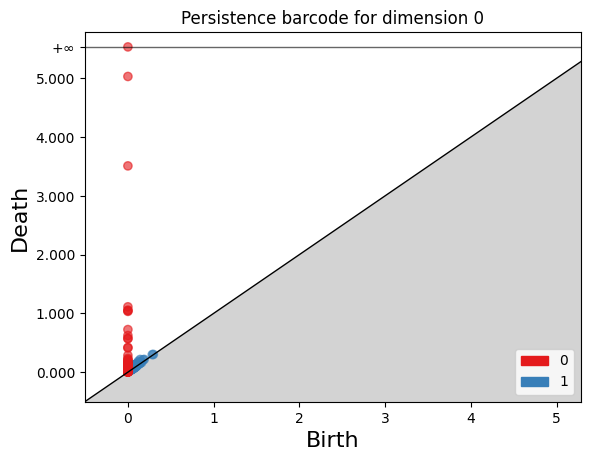

<Figure size 640x480 with 0 Axes>

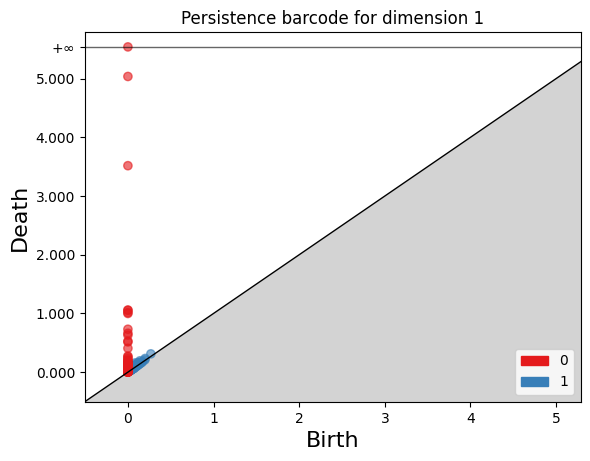

<Figure size 640x480 with 0 Axes>

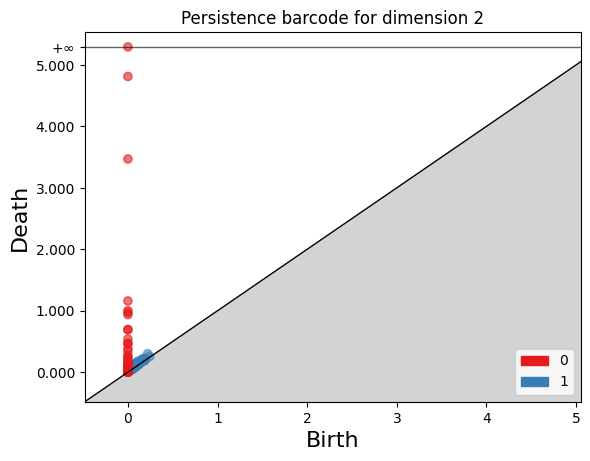

<Figure size 640x480 with 0 Axes>

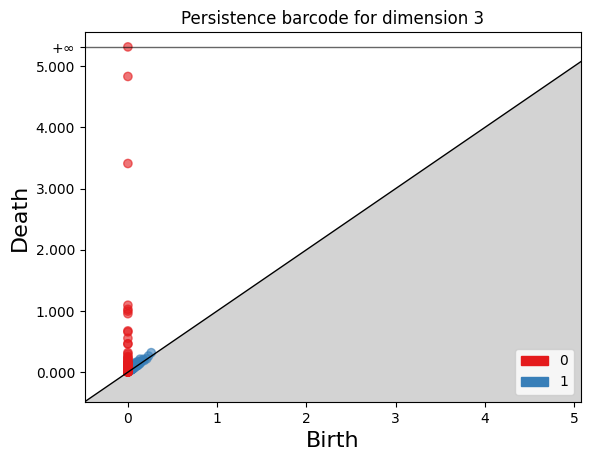

<Figure size 640x480 with 0 Axes>

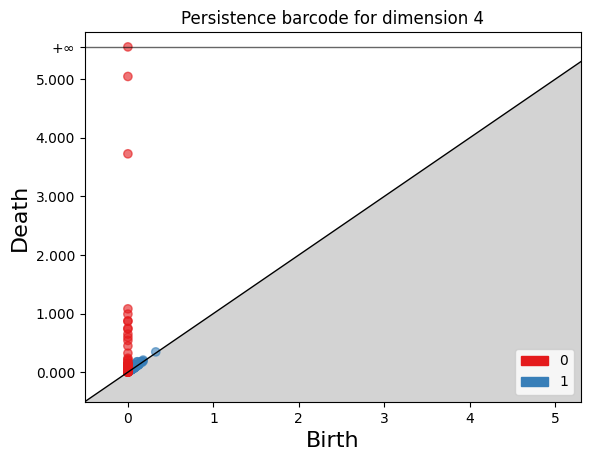

<Figure size 640x480 with 0 Axes>

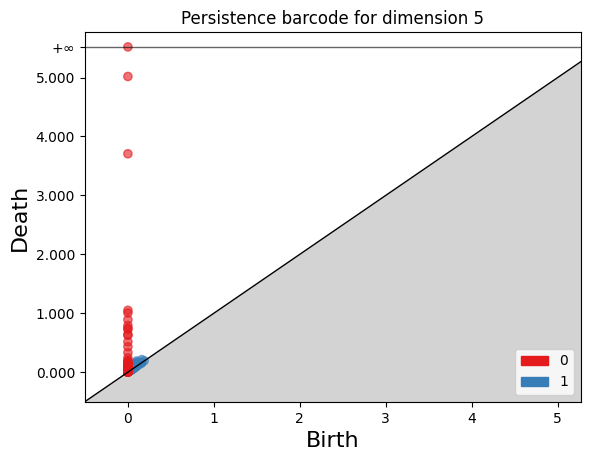

<Figure size 640x480 with 0 Axes>

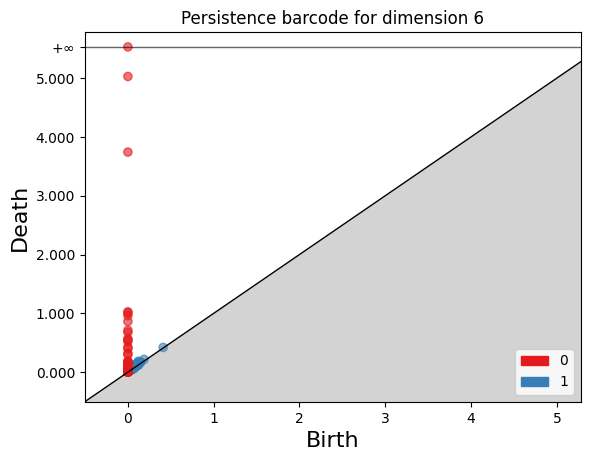

<Figure size 640x480 with 0 Axes>

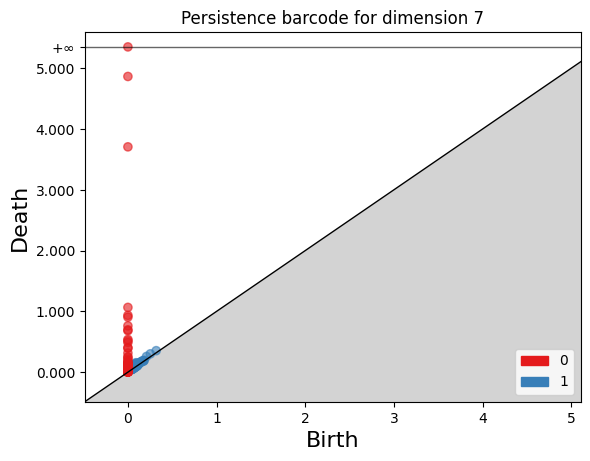

<Figure size 640x480 with 0 Axes>

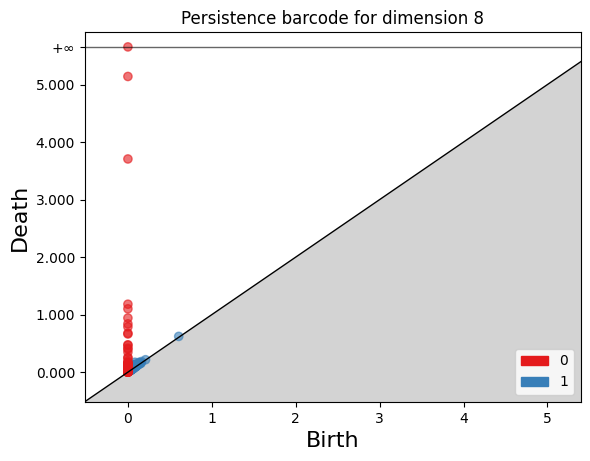

<Figure size 640x480 with 0 Axes>

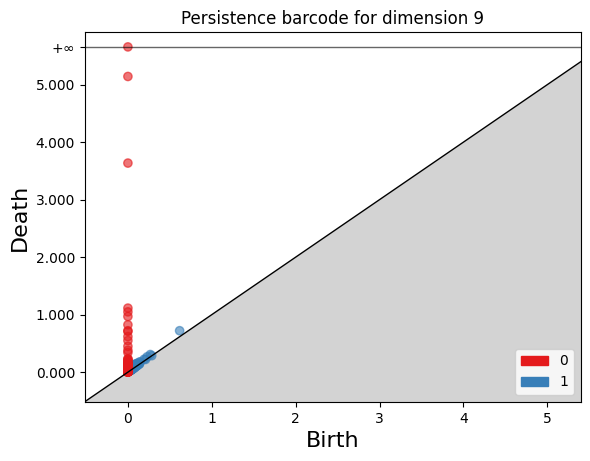

<Figure size 640x480 with 0 Axes>

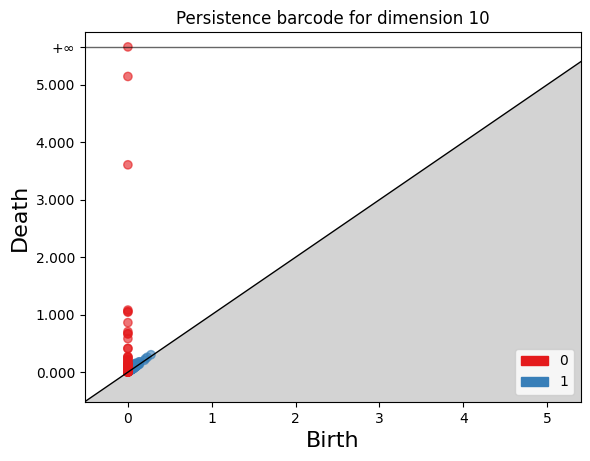

<Figure size 640x480 with 0 Axes>

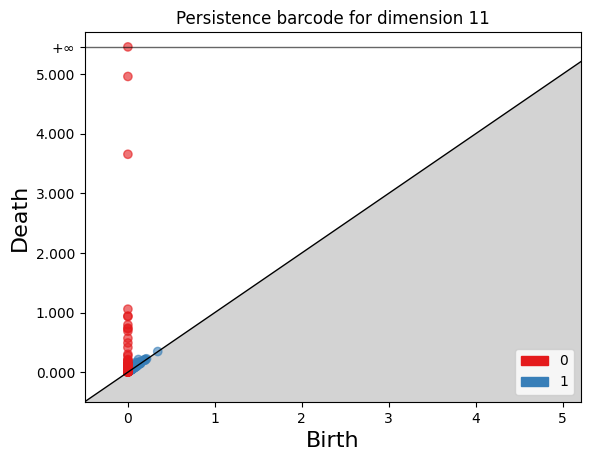

<Figure size 640x480 with 0 Axes>

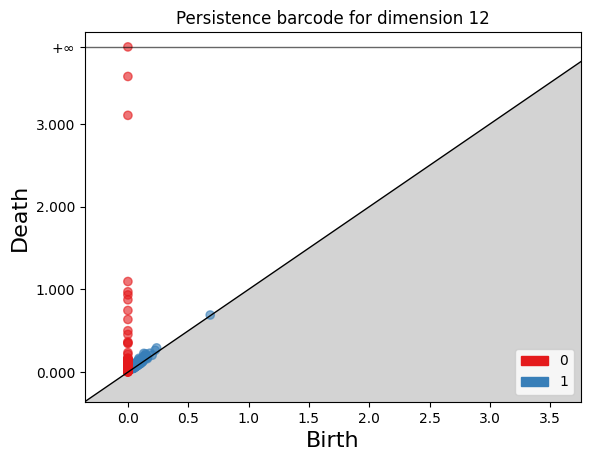

<Figure size 640x480 with 0 Axes>

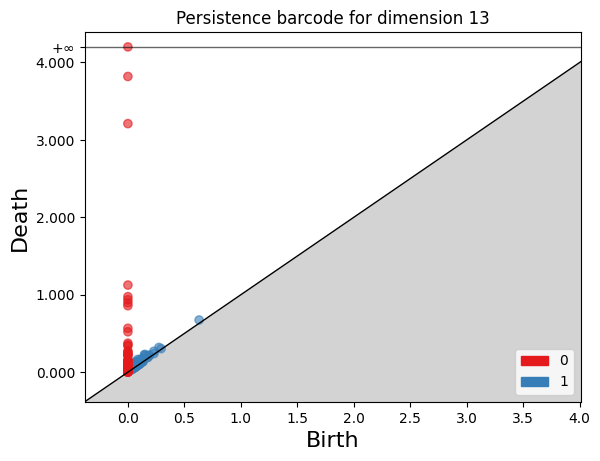

<Figure size 640x480 with 0 Axes>

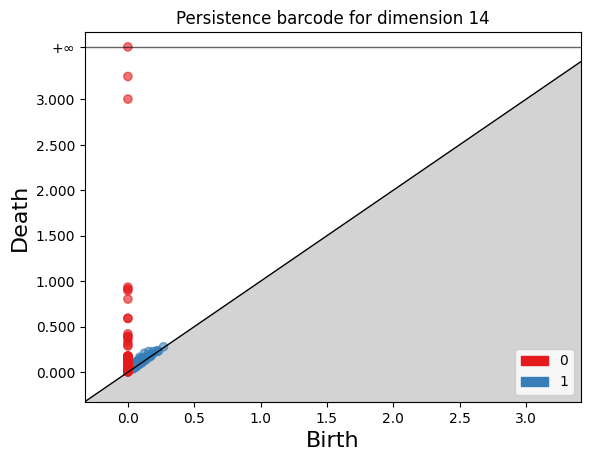

<Figure size 640x480 with 0 Axes>

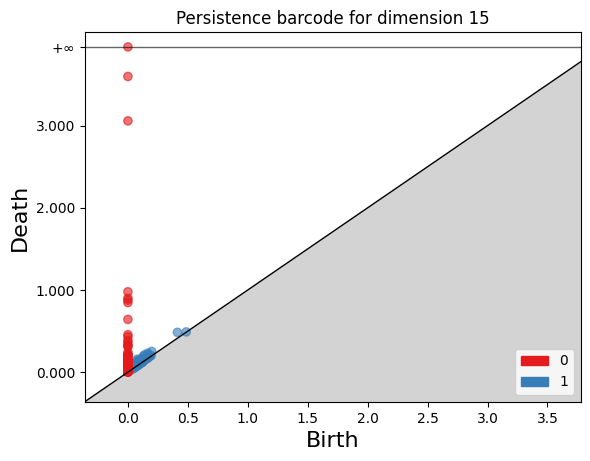

<Figure size 640x480 with 0 Axes>

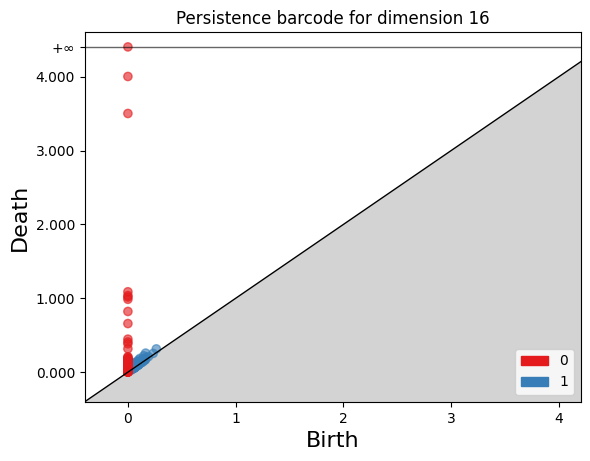

<Figure size 640x480 with 0 Axes>

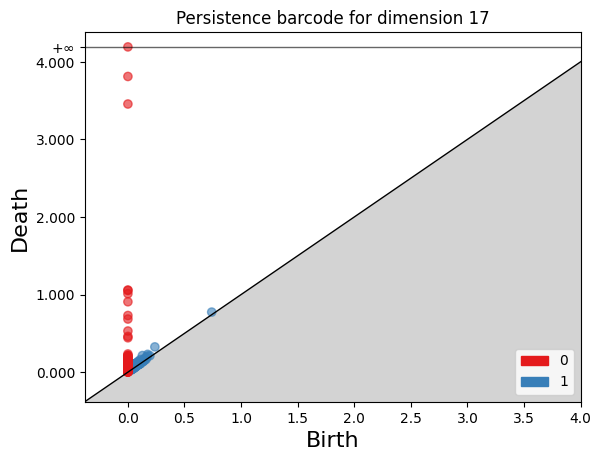

<Figure size 640x480 with 0 Axes>

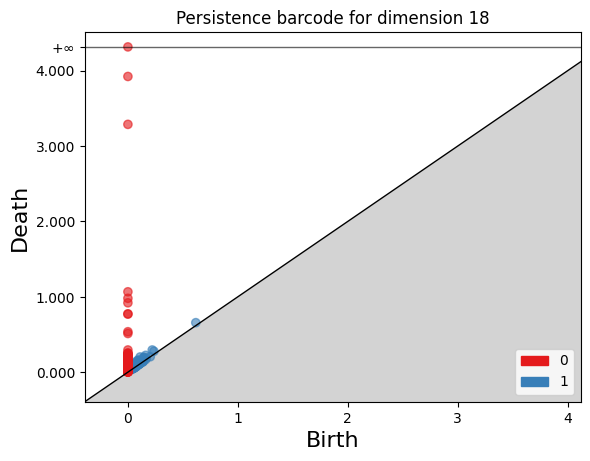

<Figure size 640x480 with 0 Axes>

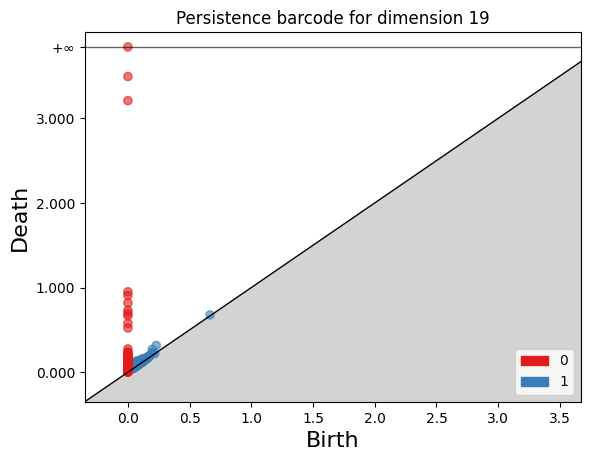

<Figure size 640x480 with 0 Axes>

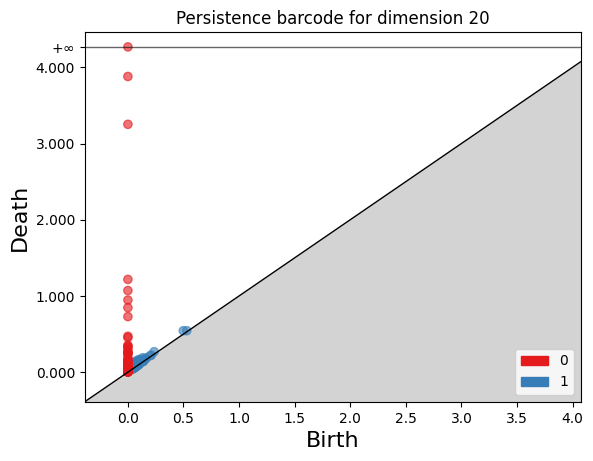

<Figure size 640x480 with 0 Axes>

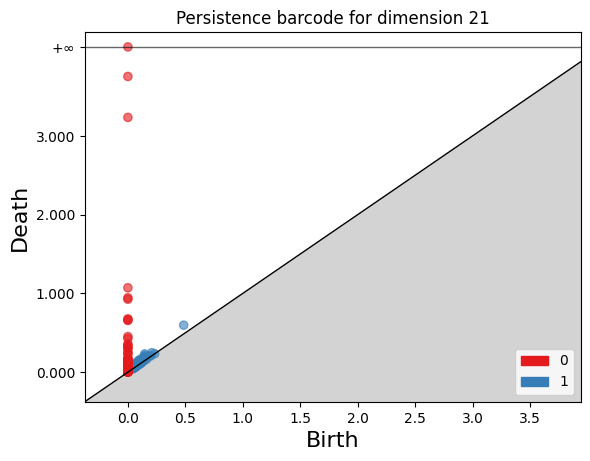

<Figure size 640x480 with 0 Axes>

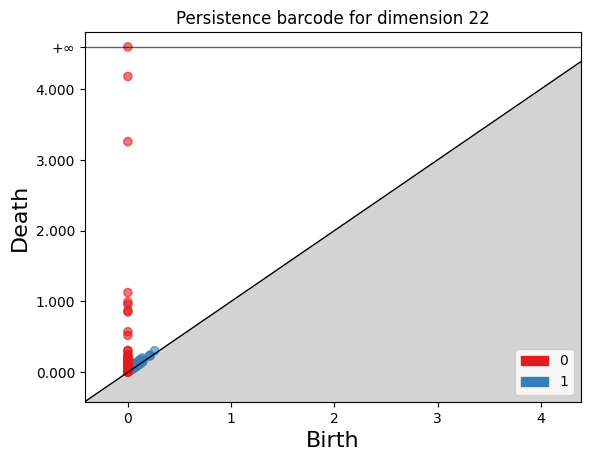

<Figure size 640x480 with 0 Axes>

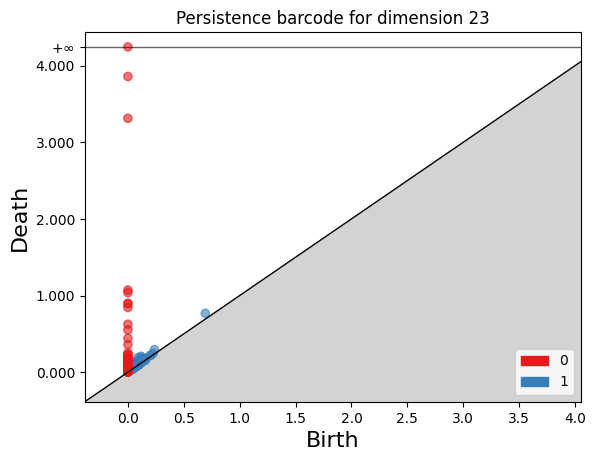

<Figure size 640x480 with 0 Axes>

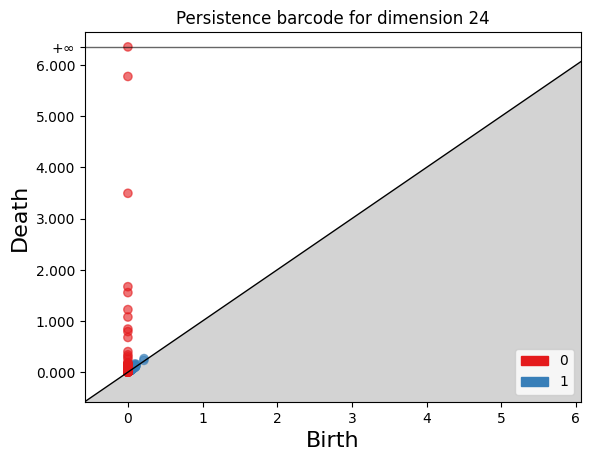

<Figure size 640x480 with 0 Axes>

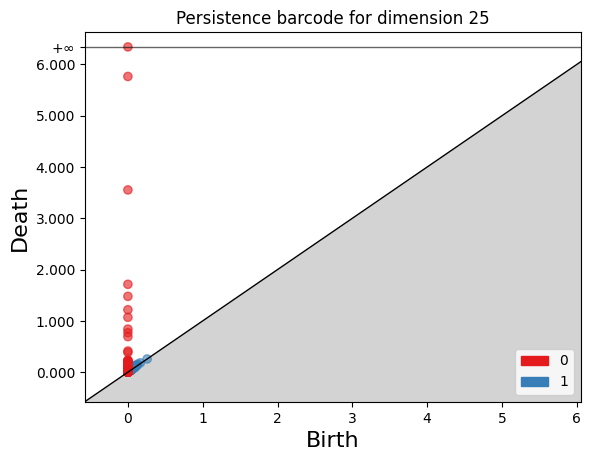

<Figure size 640x480 with 0 Axes>

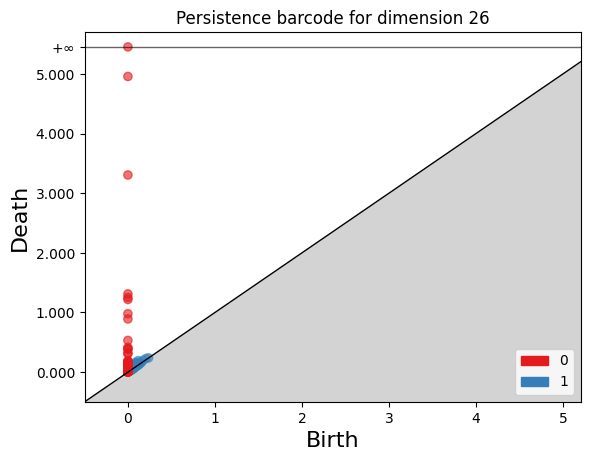

<Figure size 640x480 with 0 Axes>

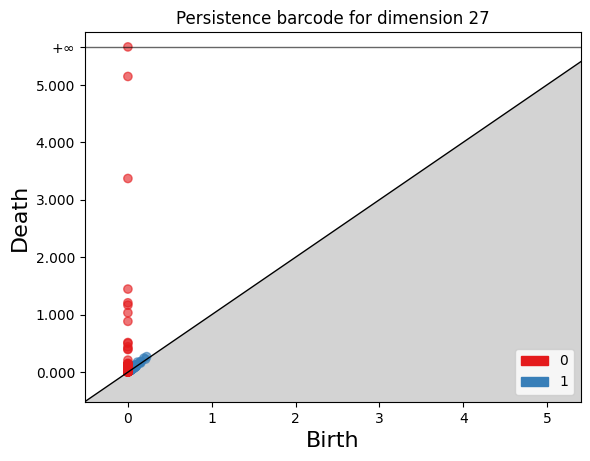

<Figure size 640x480 with 0 Axes>

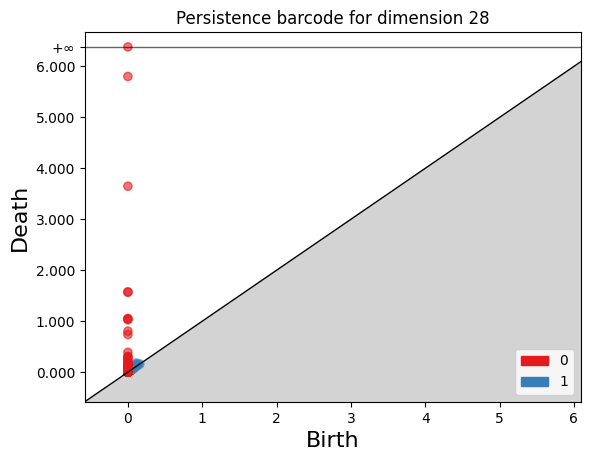

<Figure size 640x480 with 0 Axes>

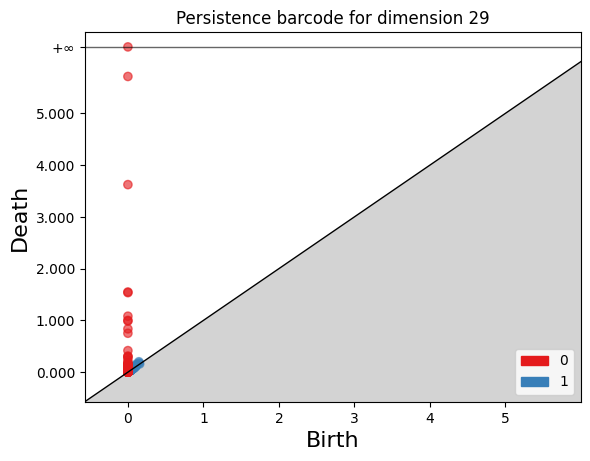

<Figure size 640x480 with 0 Axes>

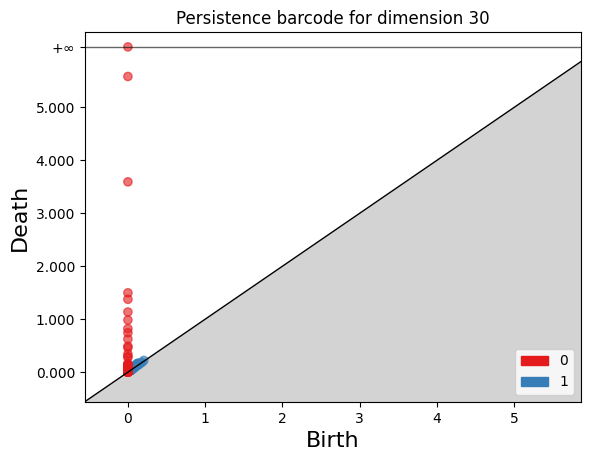

<Figure size 640x480 with 0 Axes>

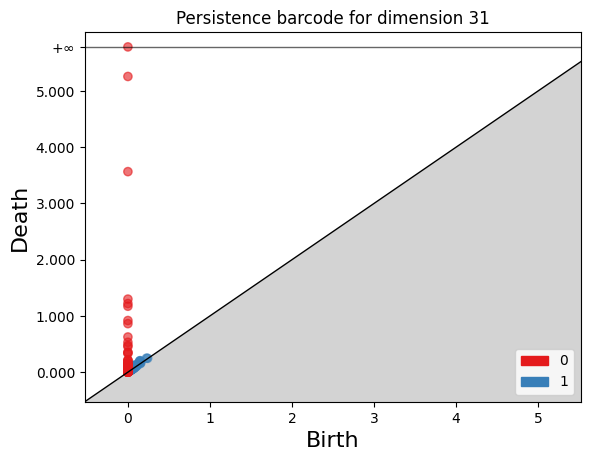

<Figure size 640x480 with 0 Axes>

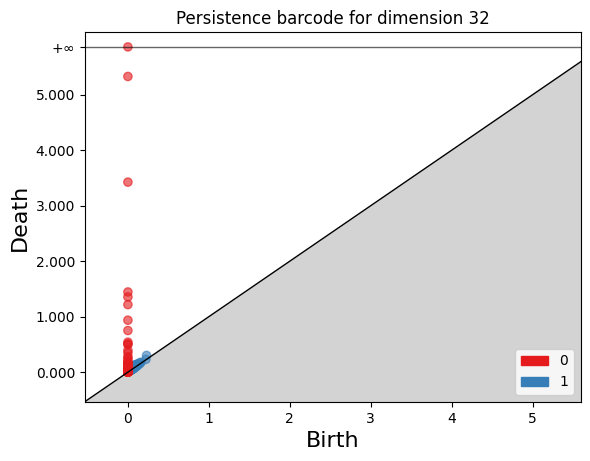

<Figure size 640x480 with 0 Axes>

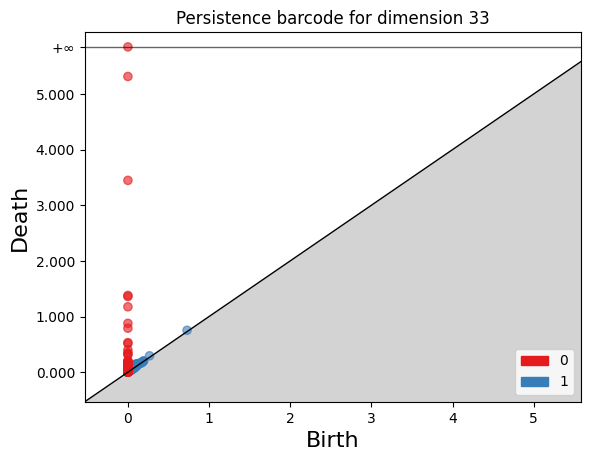

<Figure size 640x480 with 0 Axes>

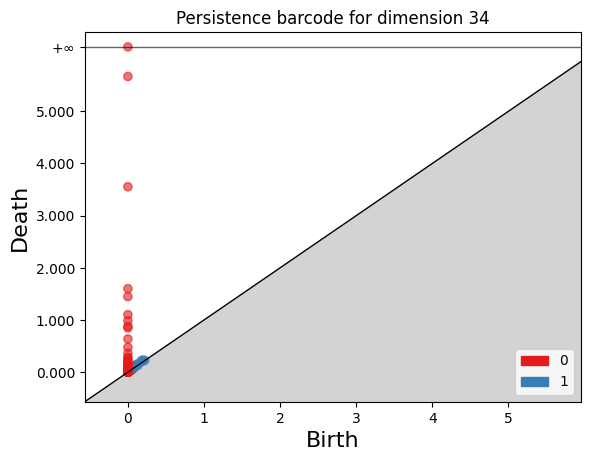

<Figure size 640x480 with 0 Axes>

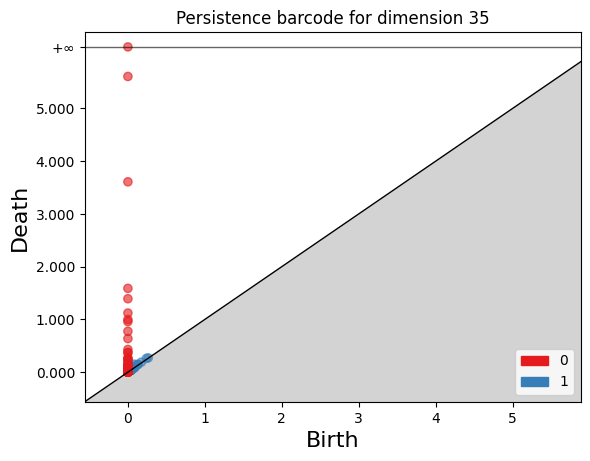

<Figure size 640x480 with 0 Axes>

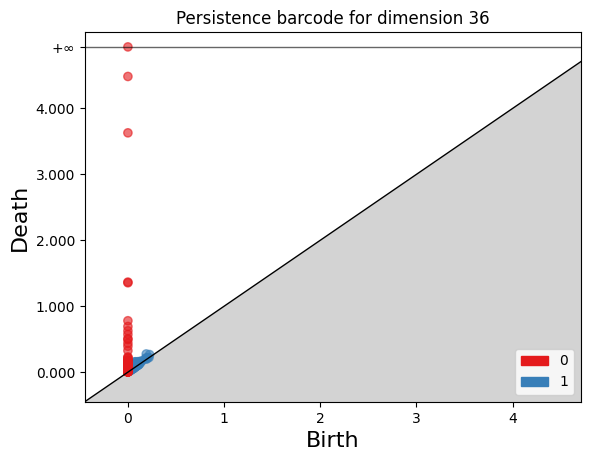

<Figure size 640x480 with 0 Axes>

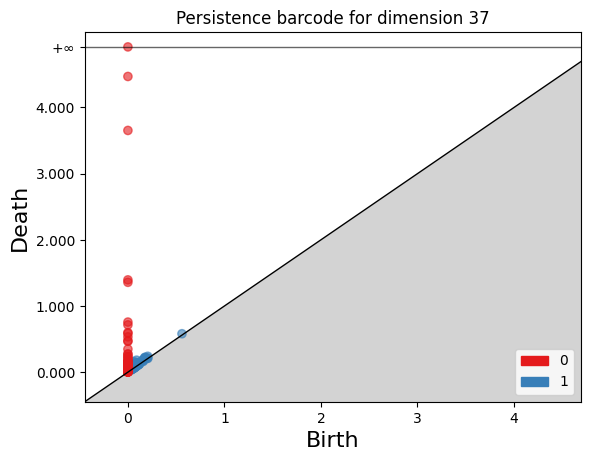

<Figure size 640x480 with 0 Axes>

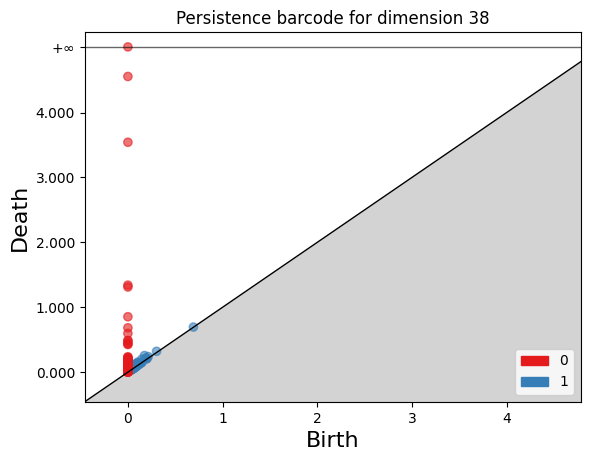

<Figure size 640x480 with 0 Axes>

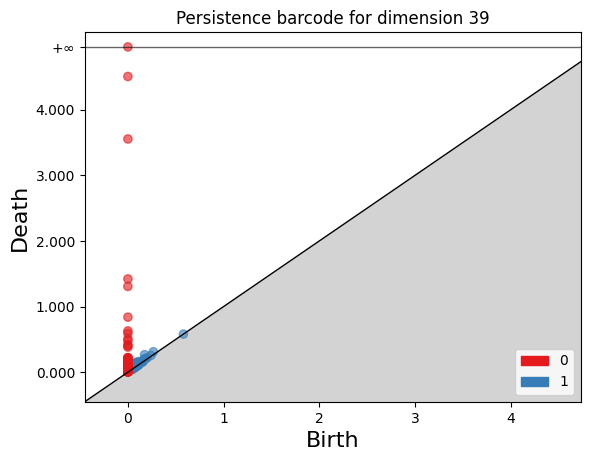

<Figure size 640x480 with 0 Axes>

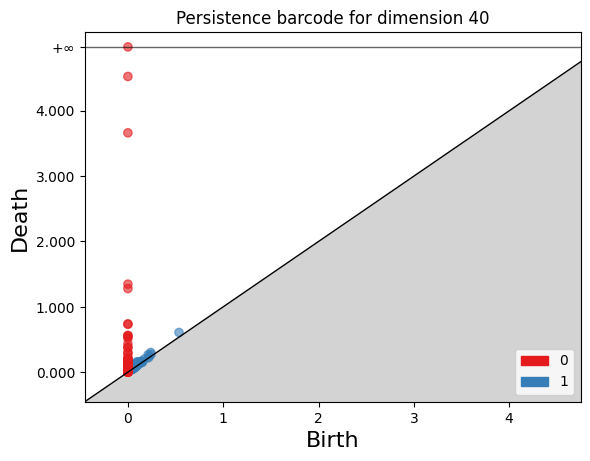

<Figure size 640x480 with 0 Axes>

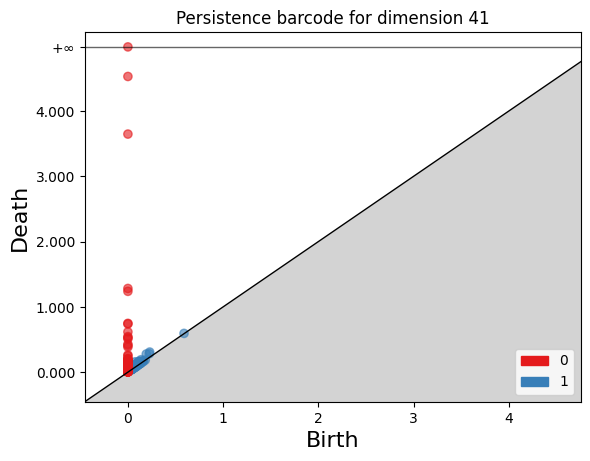

<Figure size 640x480 with 0 Axes>

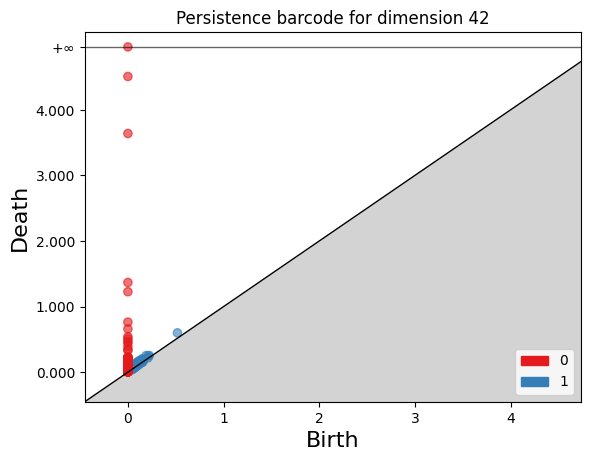

<Figure size 640x480 with 0 Axes>

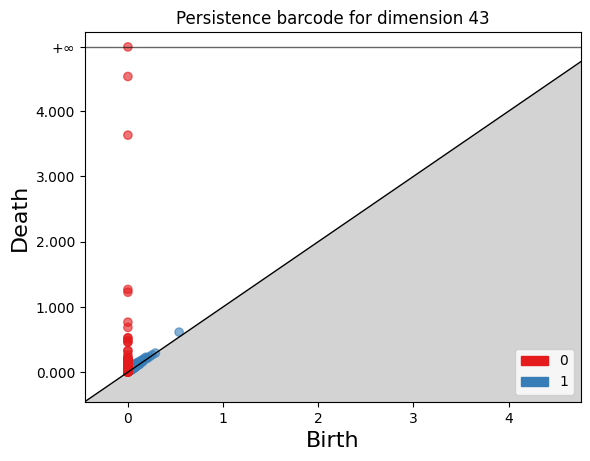

<Figure size 640x480 with 0 Axes>

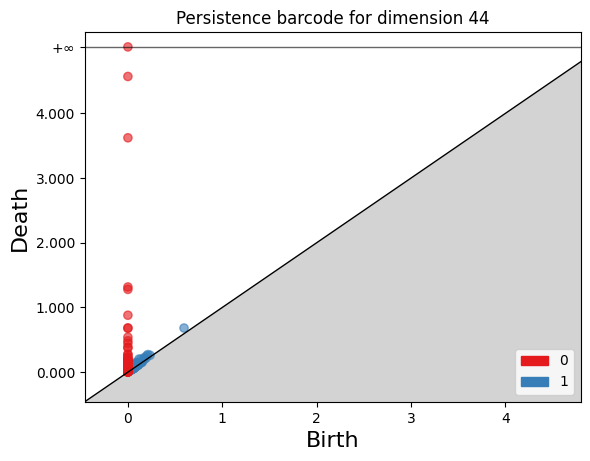

<Figure size 640x480 with 0 Axes>

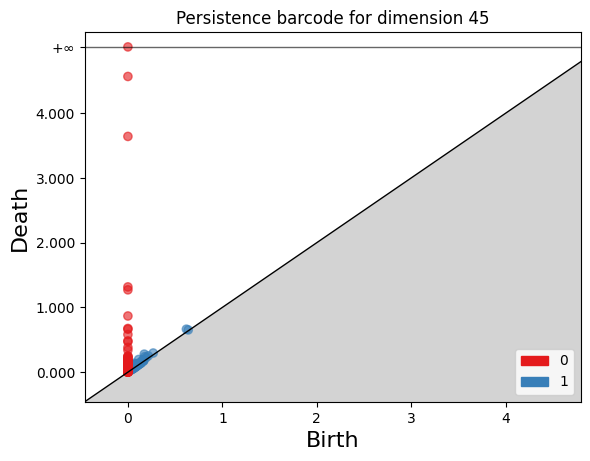

<Figure size 640x480 with 0 Axes>

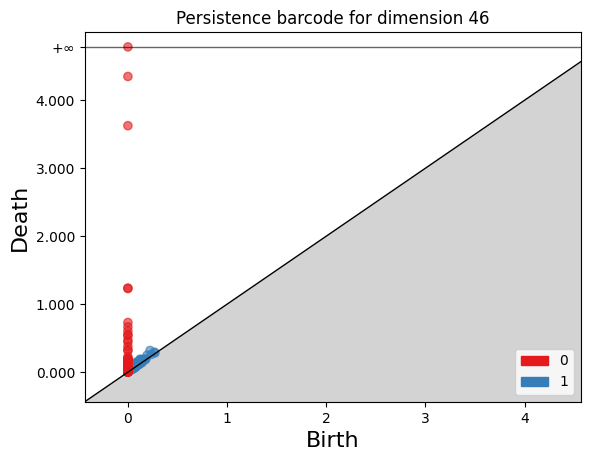

<Figure size 640x480 with 0 Axes>

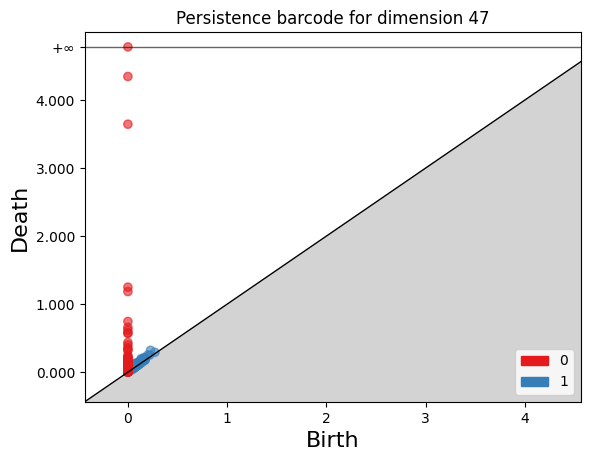

<Figure size 640x480 with 0 Axes>

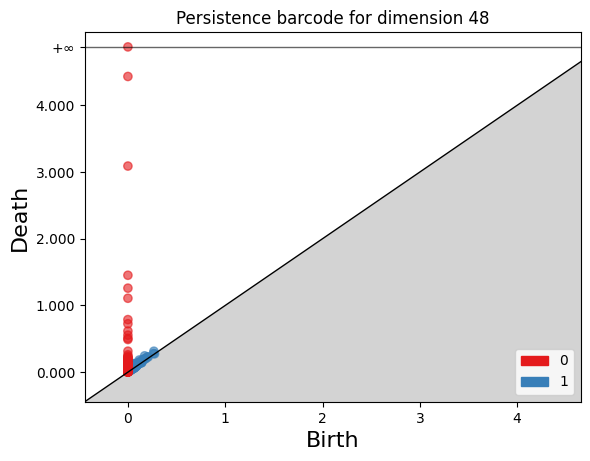

<Figure size 640x480 with 0 Axes>

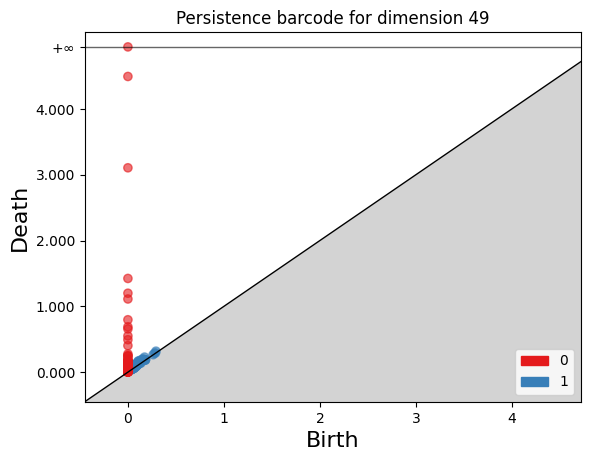

<Figure size 640x480 with 0 Axes>

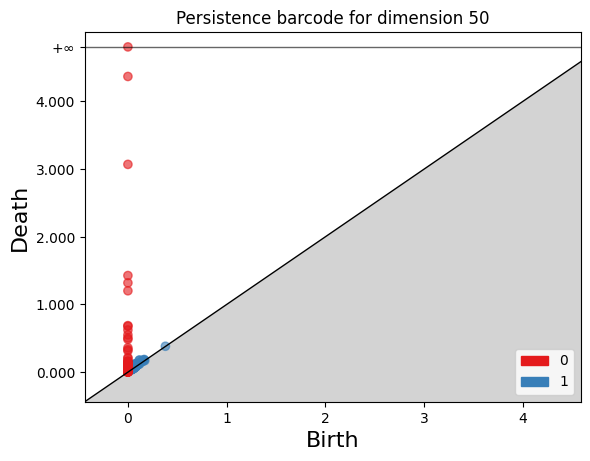

<Figure size 640x480 with 0 Axes>

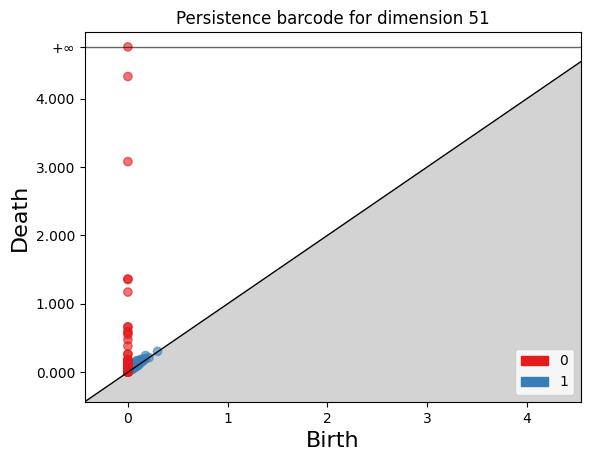

<Figure size 640x480 with 0 Axes>

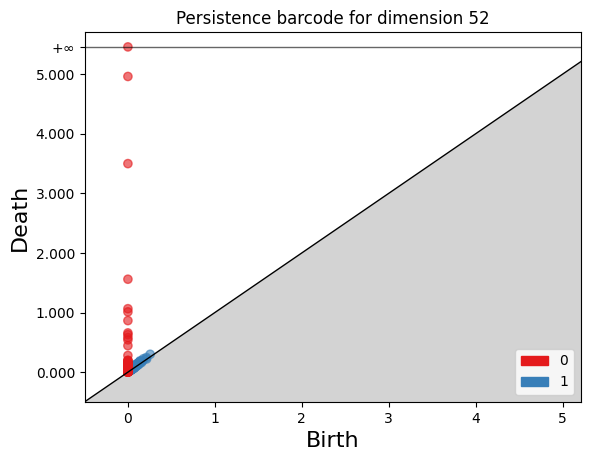

<Figure size 640x480 with 0 Axes>

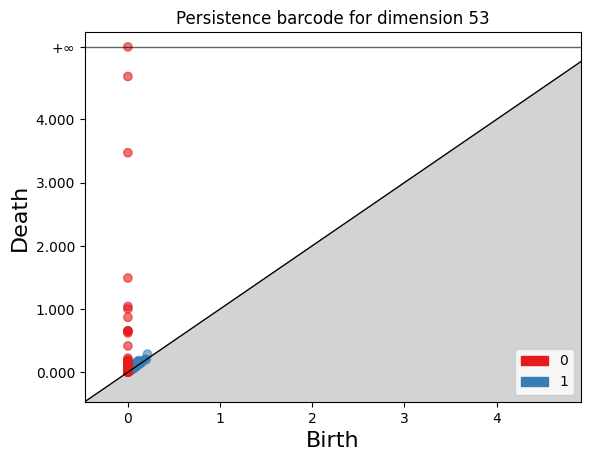

<Figure size 640x480 with 0 Axes>

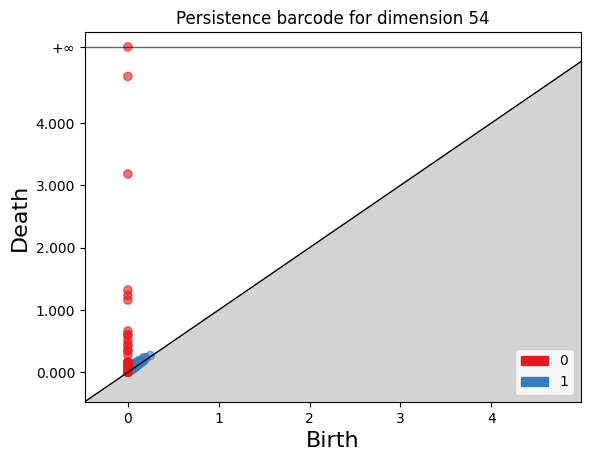

<Figure size 640x480 with 0 Axes>

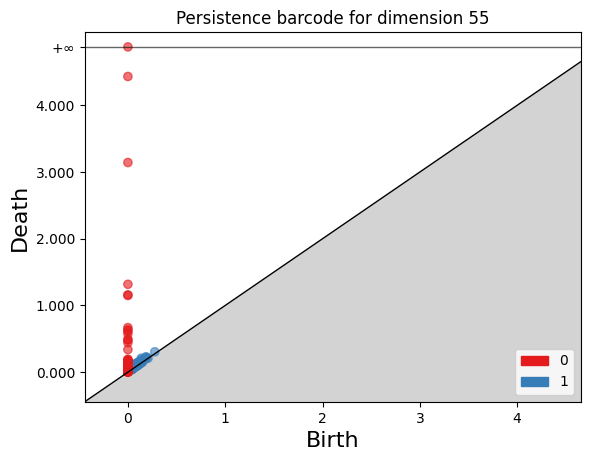

<Figure size 640x480 with 0 Axes>

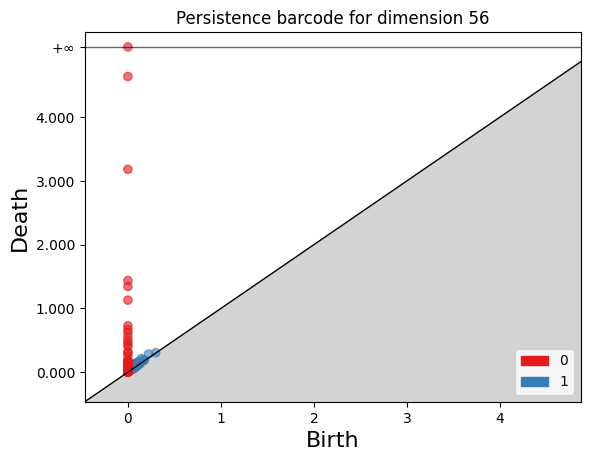

<Figure size 640x480 with 0 Axes>

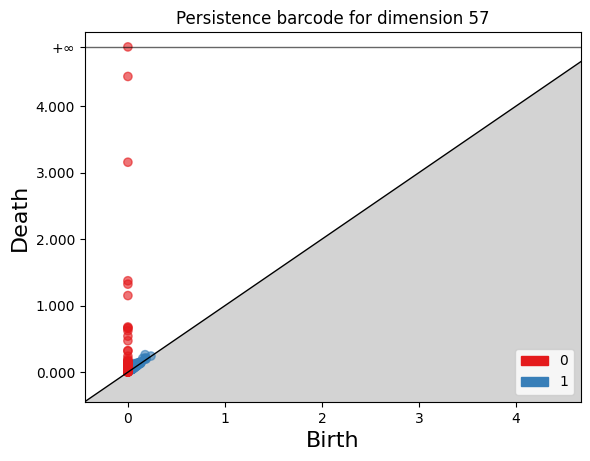

<Figure size 640x480 with 0 Axes>

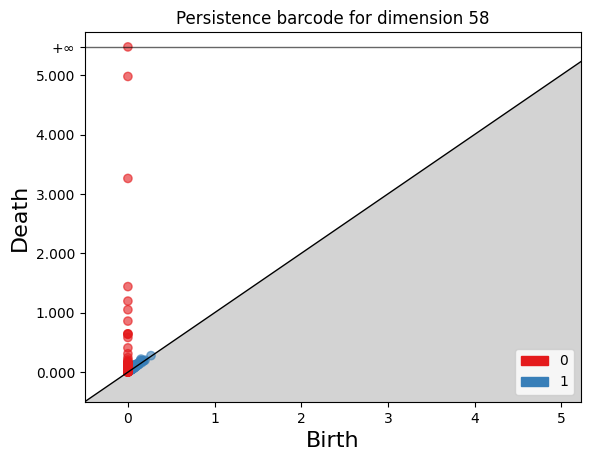

<Figure size 640x480 with 0 Axes>

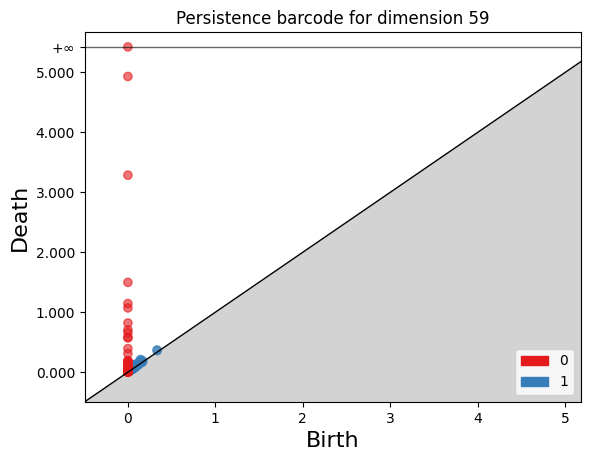

<Figure size 640x480 with 0 Axes>

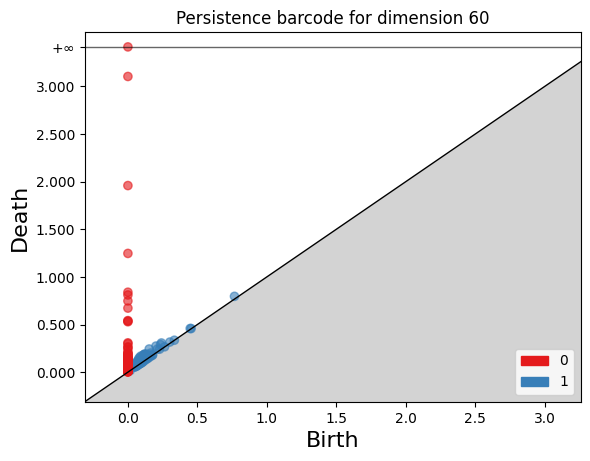

<Figure size 640x480 with 0 Axes>

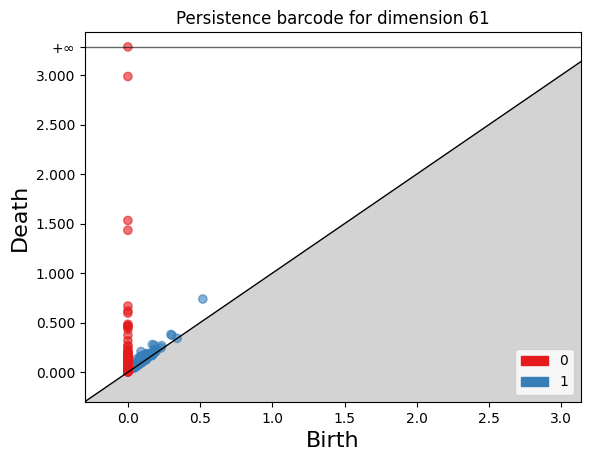

<Figure size 640x480 with 0 Axes>

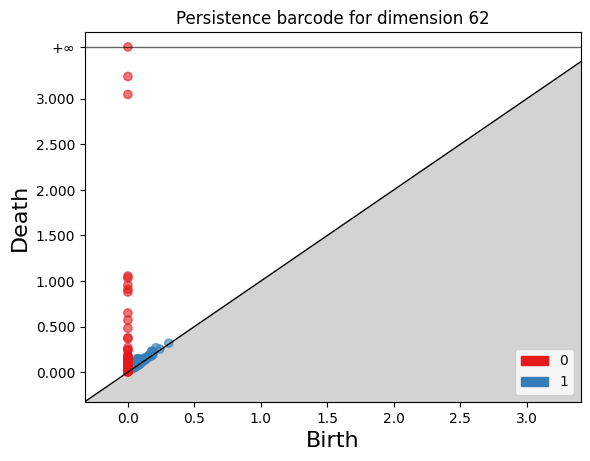

<Figure size 640x480 with 0 Axes>

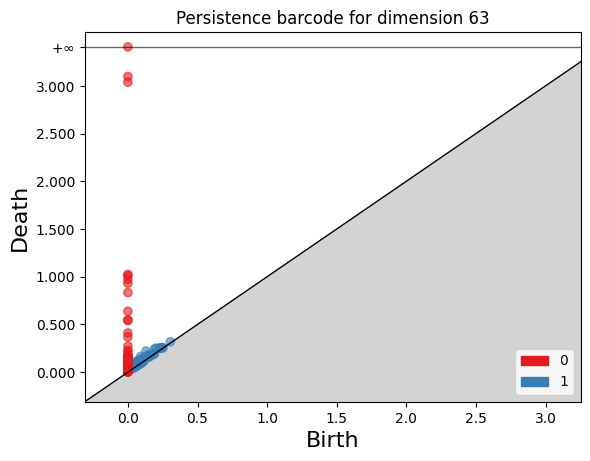

<Figure size 640x480 with 0 Axes>

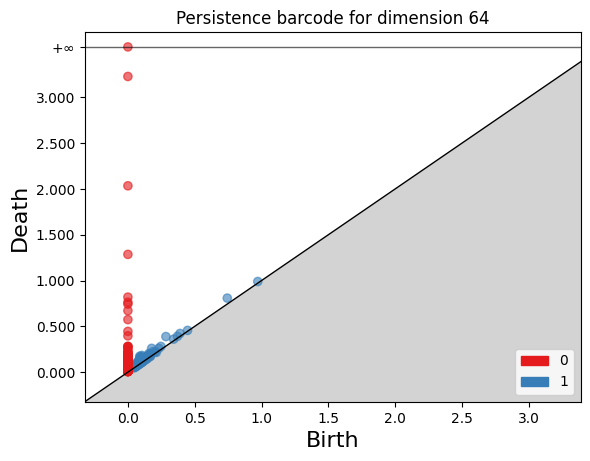

<Figure size 640x480 with 0 Axes>

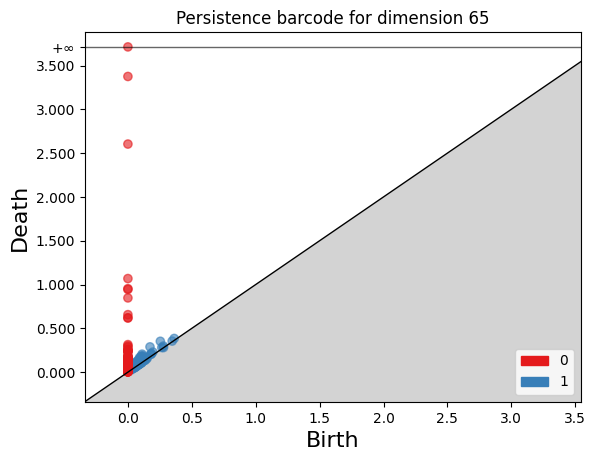

<Figure size 640x480 with 0 Axes>

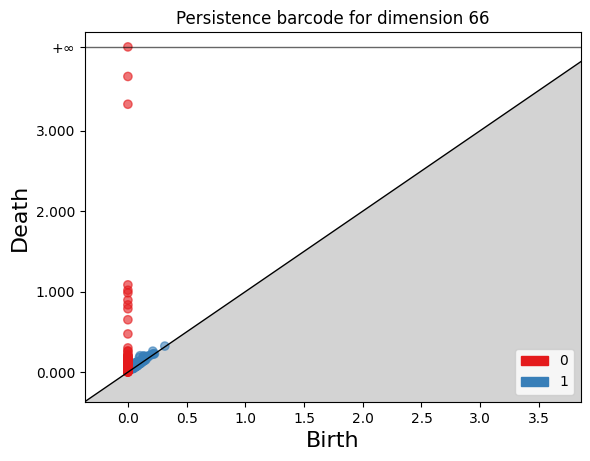

<Figure size 640x480 with 0 Axes>

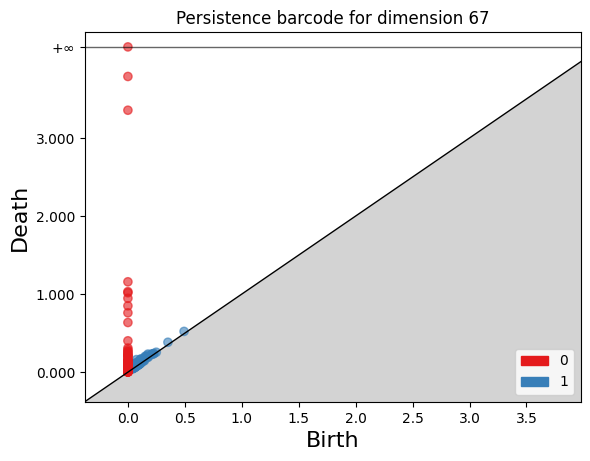

<Figure size 640x480 with 0 Axes>

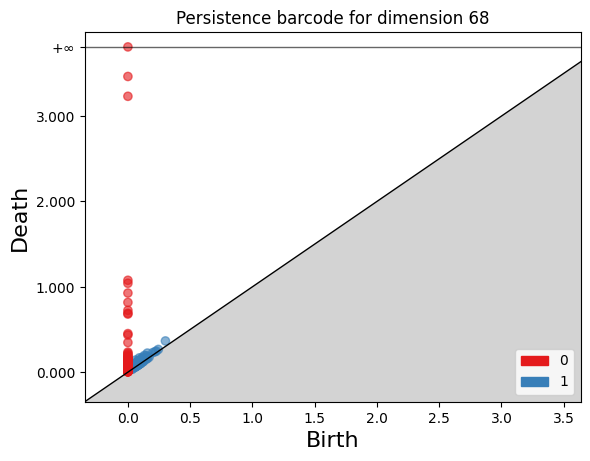

<Figure size 640x480 with 0 Axes>

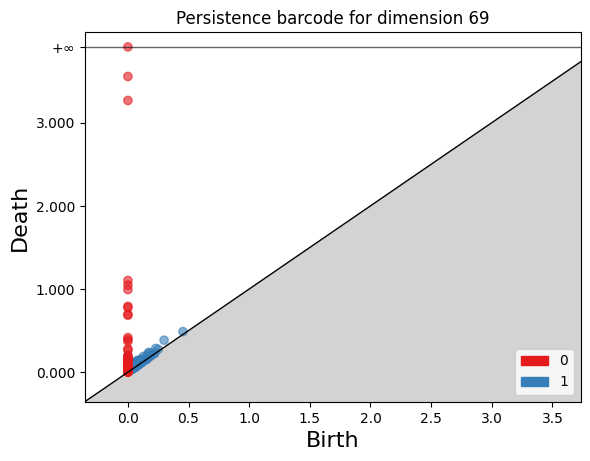

<Figure size 640x480 with 0 Axes>

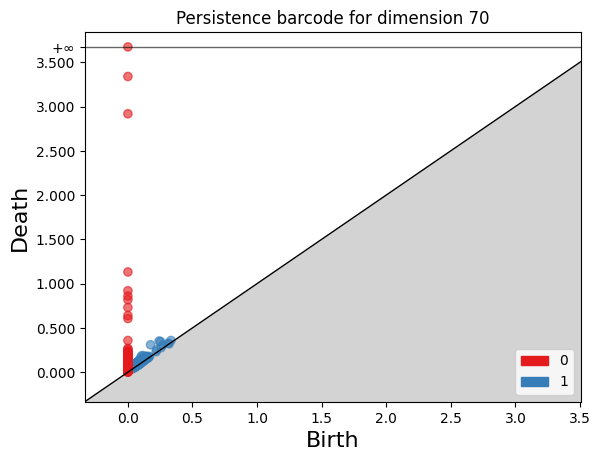

<Figure size 640x480 with 0 Axes>

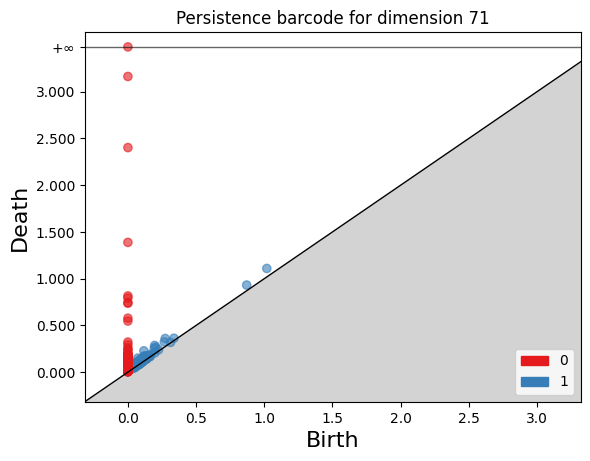

<Figure size 640x480 with 0 Axes>

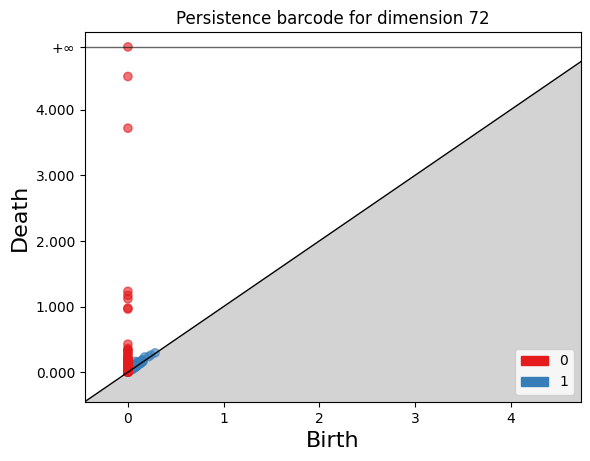

<Figure size 640x480 with 0 Axes>

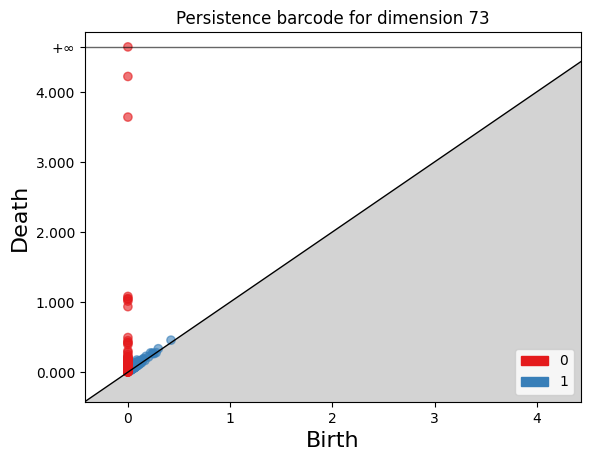

<Figure size 640x480 with 0 Axes>

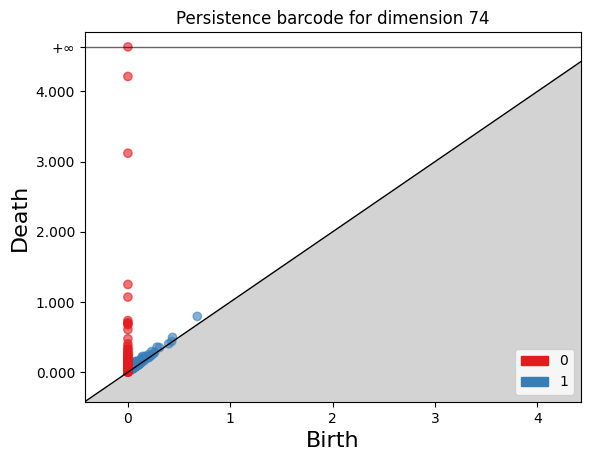

<Figure size 640x480 with 0 Axes>

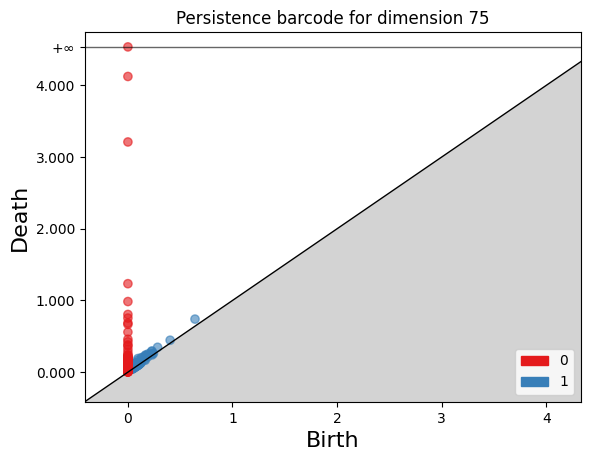

<Figure size 640x480 with 0 Axes>

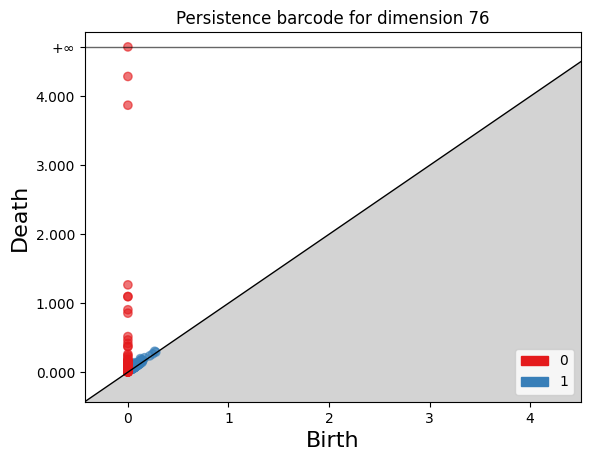

<Figure size 640x480 with 0 Axes>

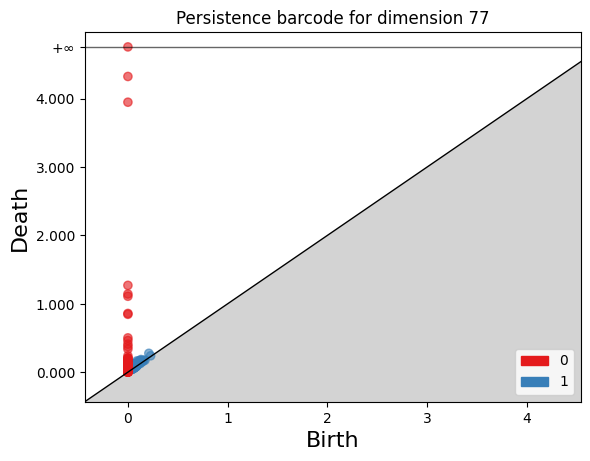

<Figure size 640x480 with 0 Axes>

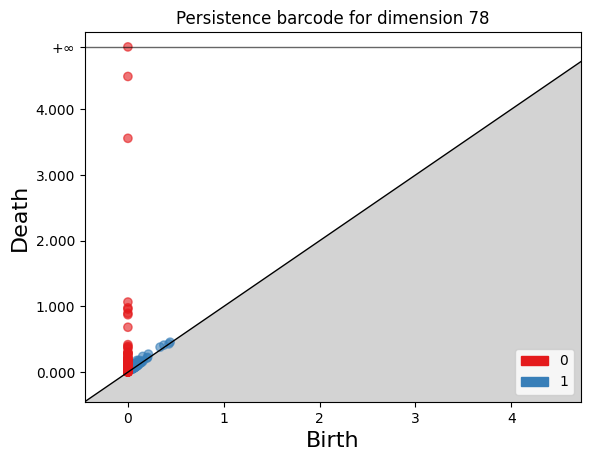

<Figure size 640x480 with 0 Axes>

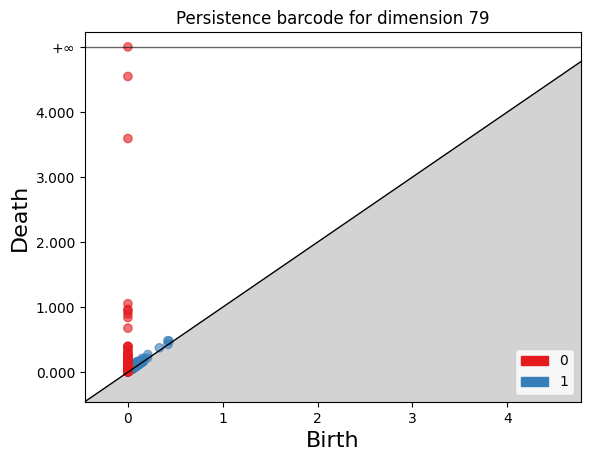

<Figure size 640x480 with 0 Axes>

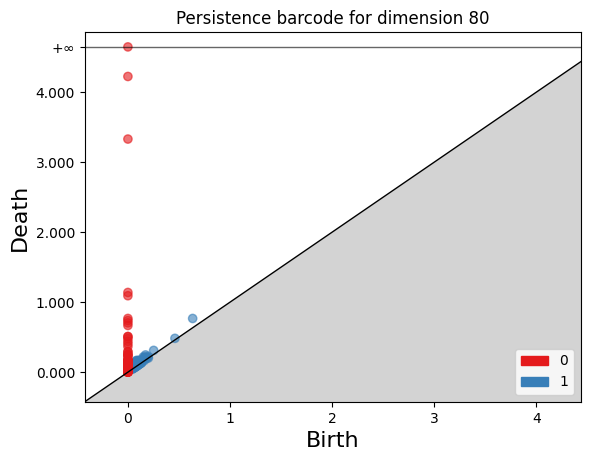

<Figure size 640x480 with 0 Axes>

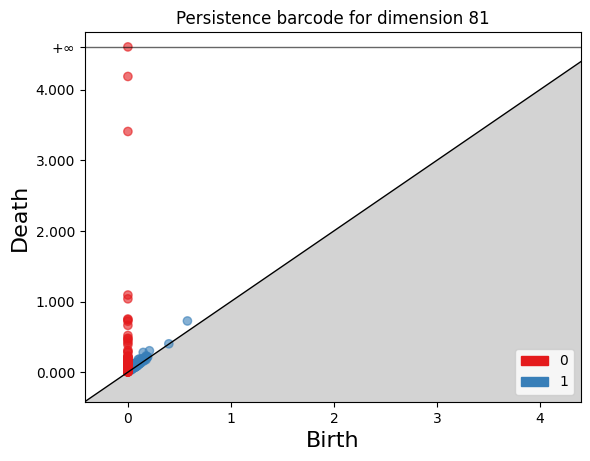

<Figure size 640x480 with 0 Axes>

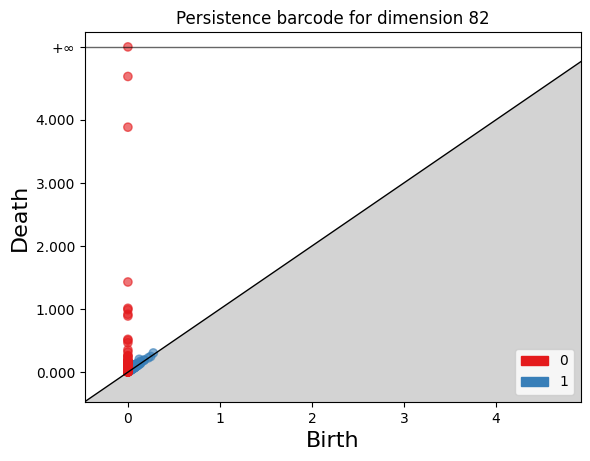

<Figure size 640x480 with 0 Axes>

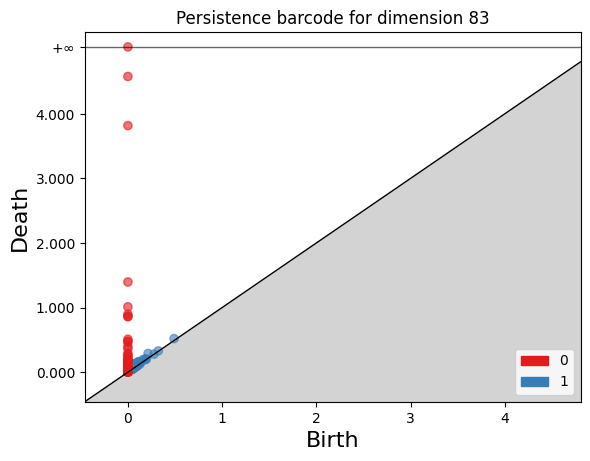

<Figure size 640x480 with 0 Axes>

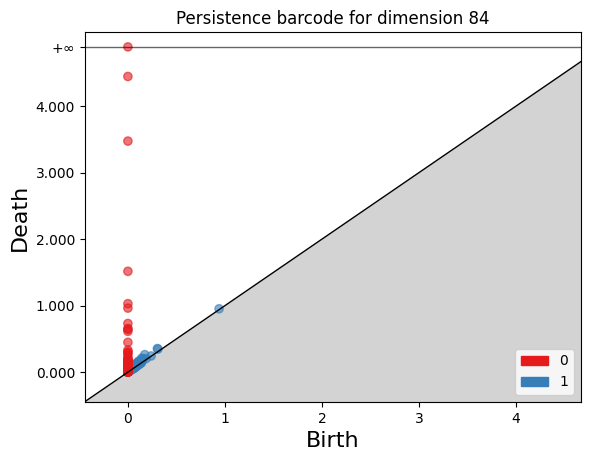

<Figure size 640x480 with 0 Axes>

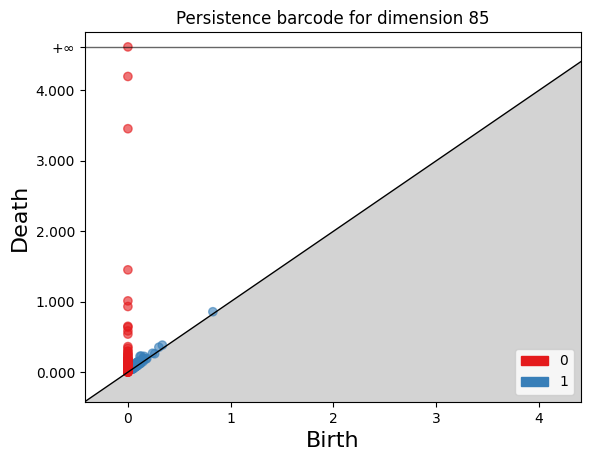

<Figure size 640x480 with 0 Axes>

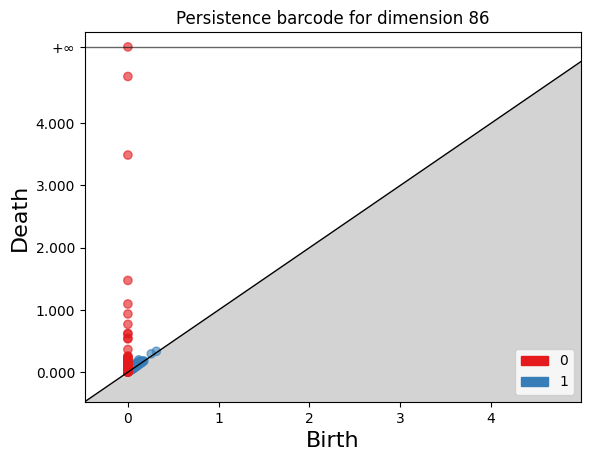

<Figure size 640x480 with 0 Axes>

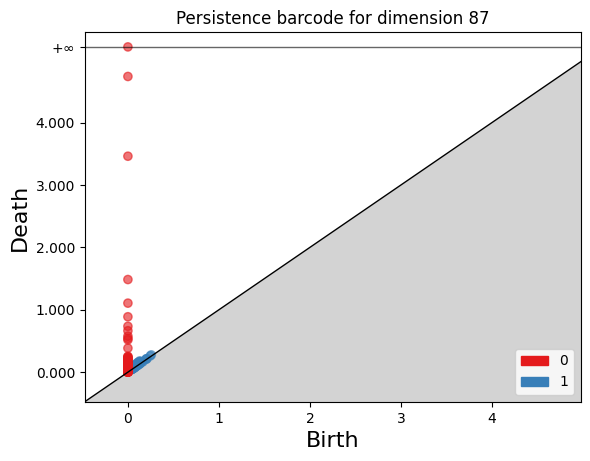

<Figure size 640x480 with 0 Axes>

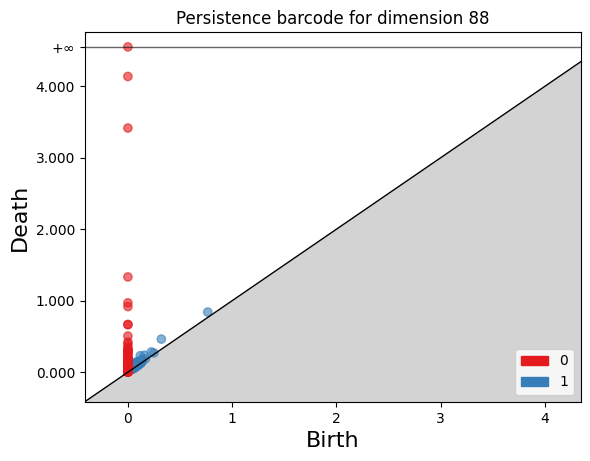

<Figure size 640x480 with 0 Axes>

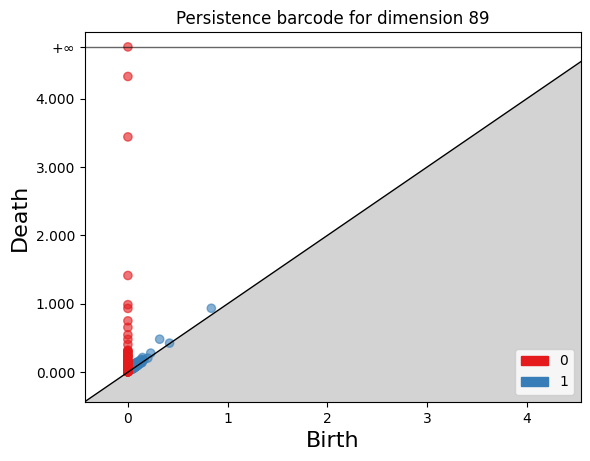

<Figure size 640x480 with 0 Axes>

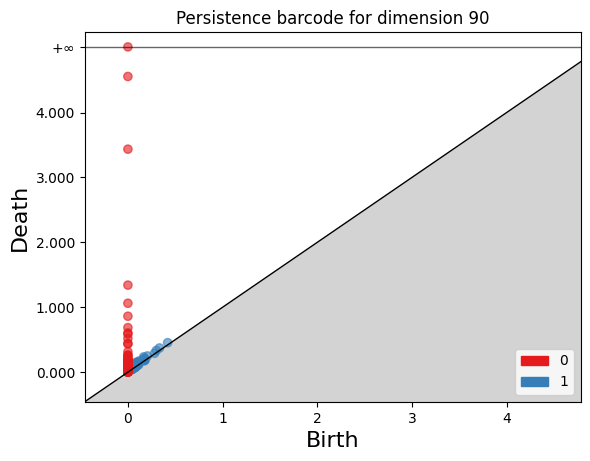

<Figure size 640x480 with 0 Axes>

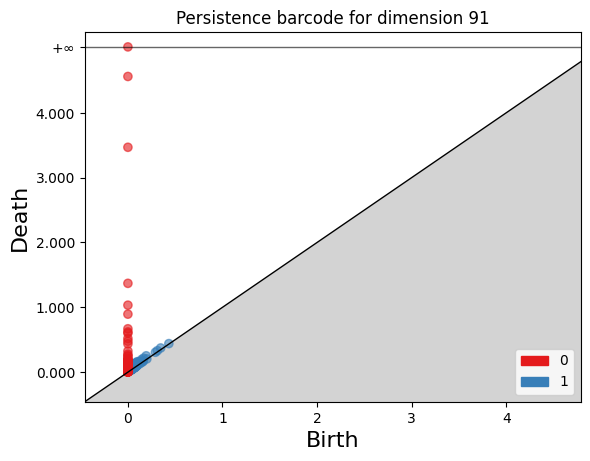

<Figure size 640x480 with 0 Axes>

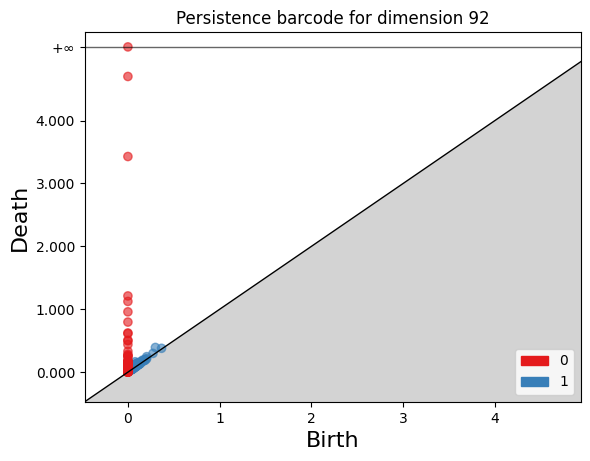

<Figure size 640x480 with 0 Axes>

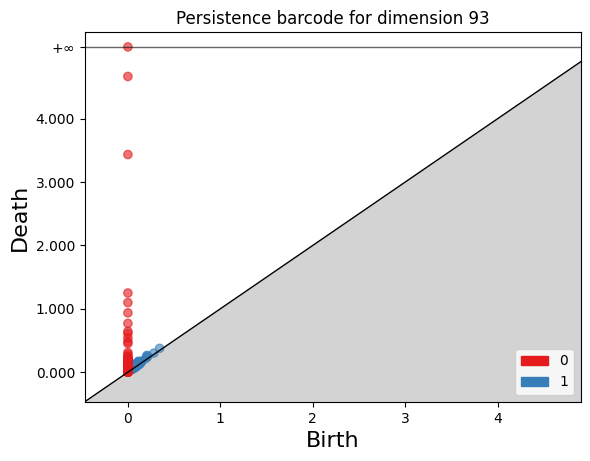

<Figure size 640x480 with 0 Axes>

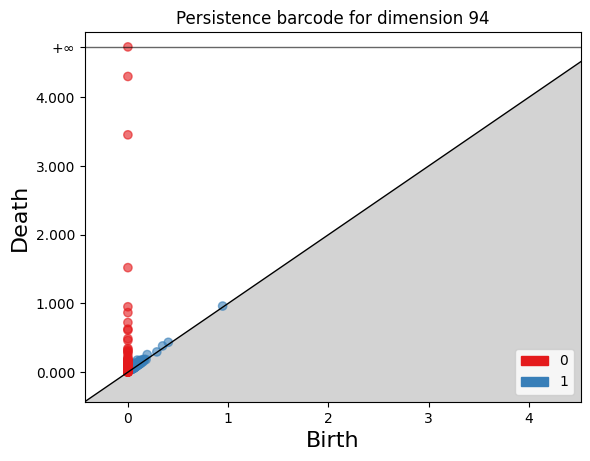

<Figure size 640x480 with 0 Axes>

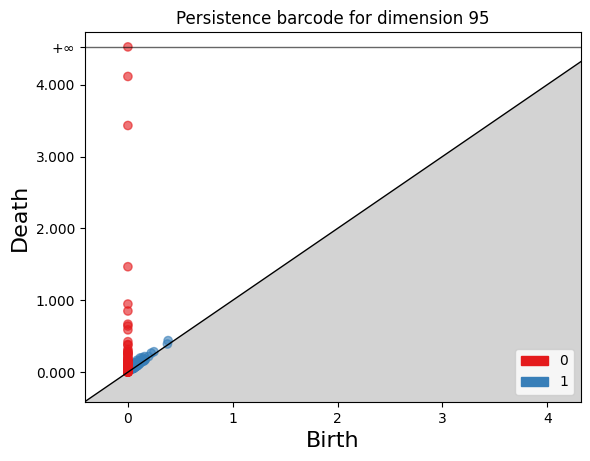

<Figure size 640x480 with 0 Axes>

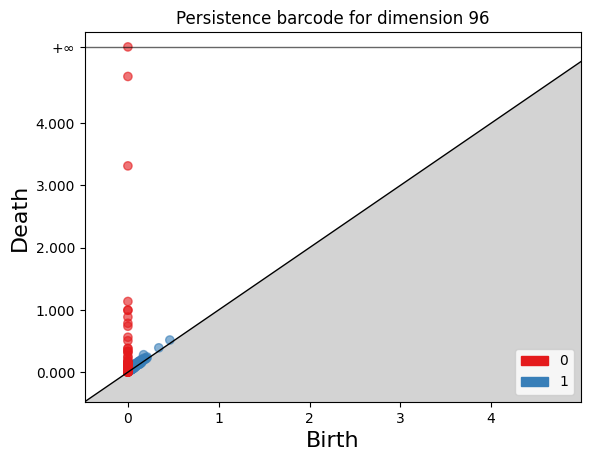

<Figure size 640x480 with 0 Axes>

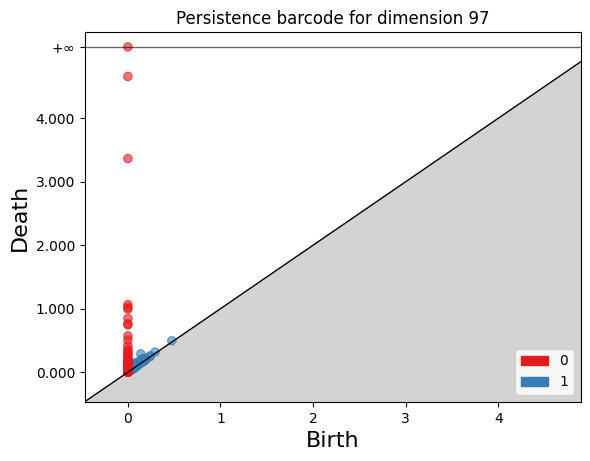

<Figure size 640x480 with 0 Axes>

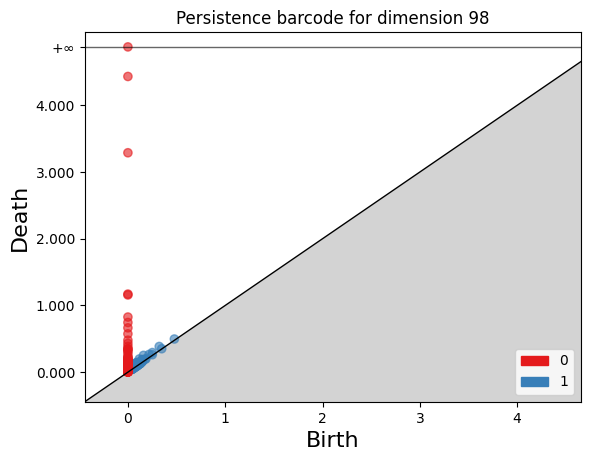

<Figure size 640x480 with 0 Axes>

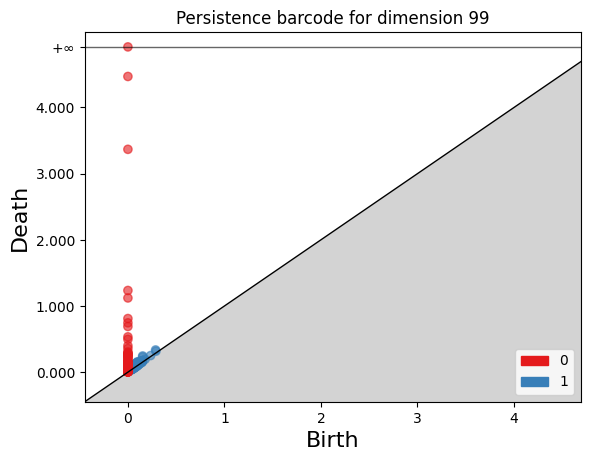

<Figure size 640x480 with 0 Axes>

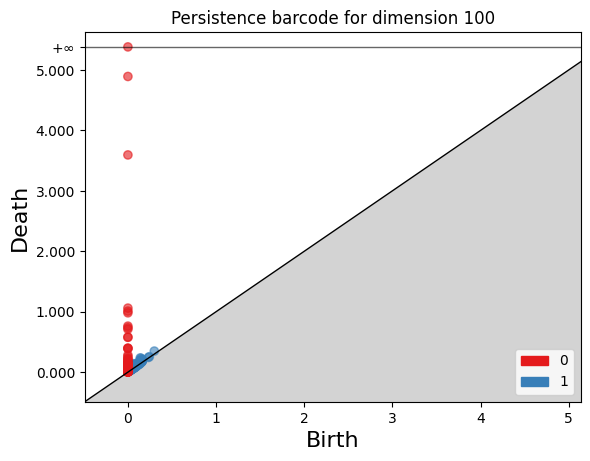

<Figure size 640x480 with 0 Axes>

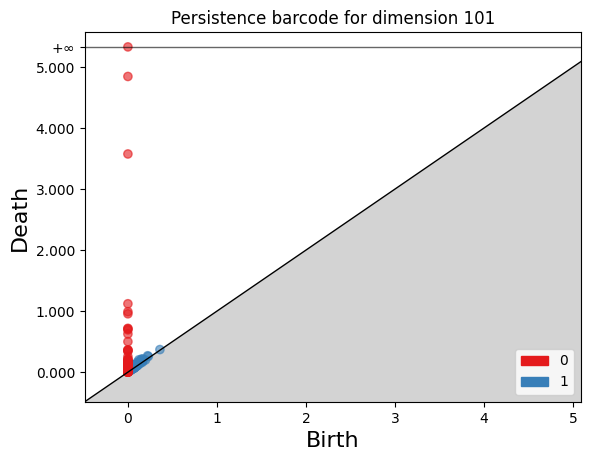

<Figure size 640x480 with 0 Axes>

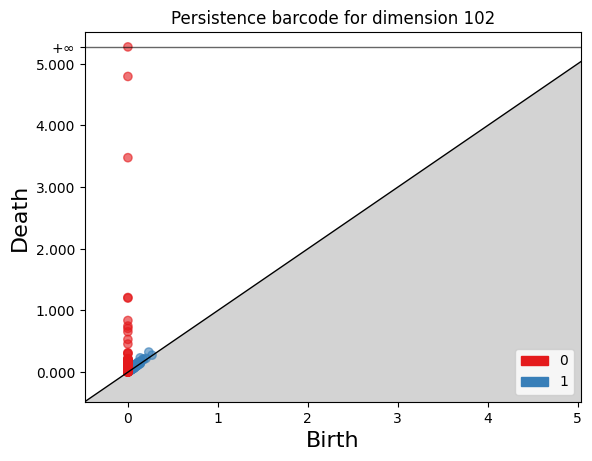

<Figure size 640x480 with 0 Axes>

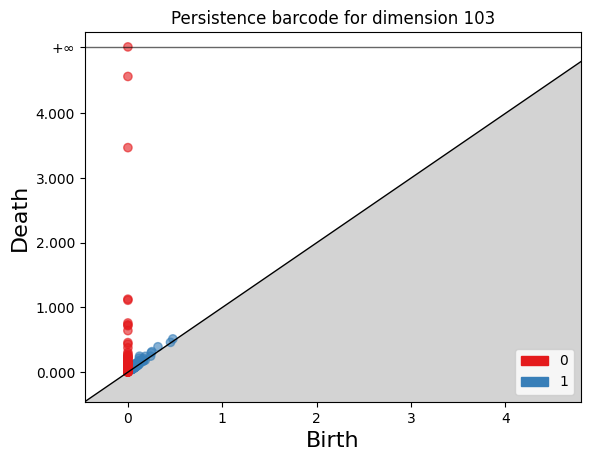

<Figure size 640x480 with 0 Axes>

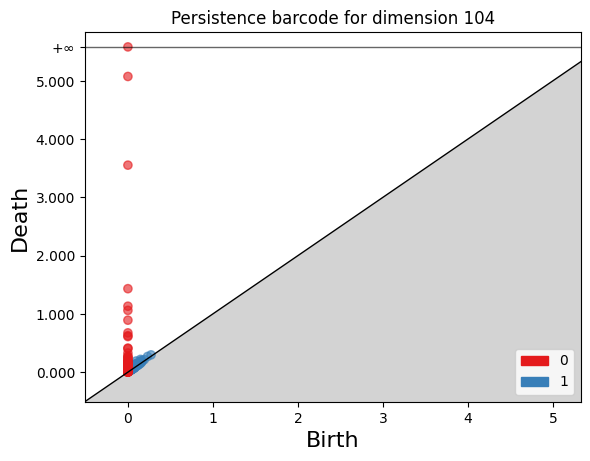

<Figure size 640x480 with 0 Axes>

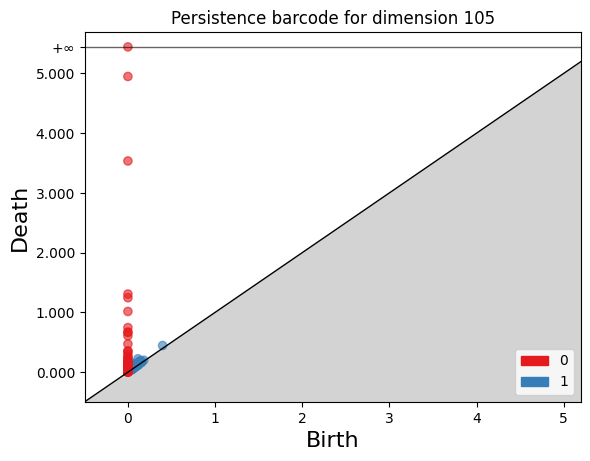

<Figure size 640x480 with 0 Axes>

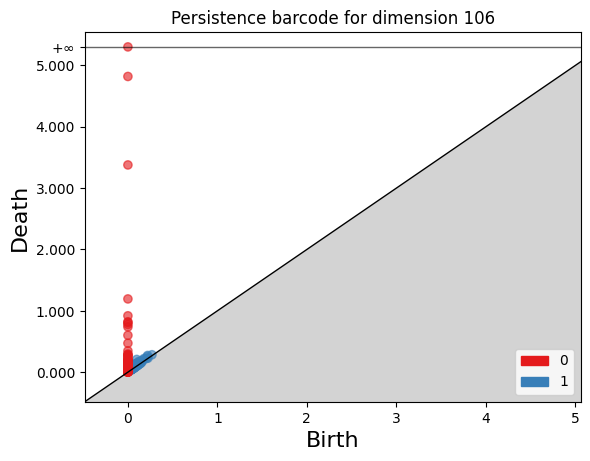

<Figure size 640x480 with 0 Axes>

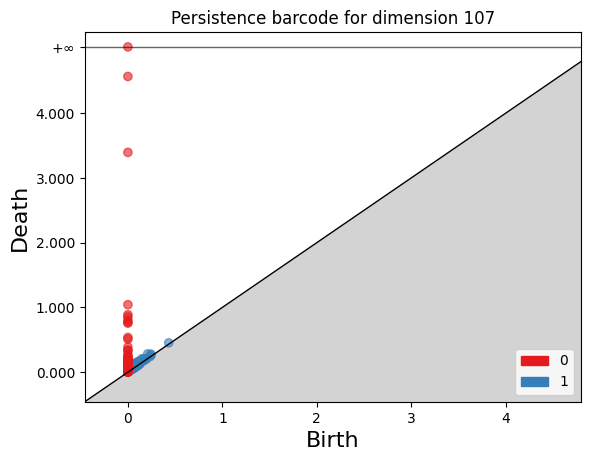

<Figure size 640x480 with 0 Axes>

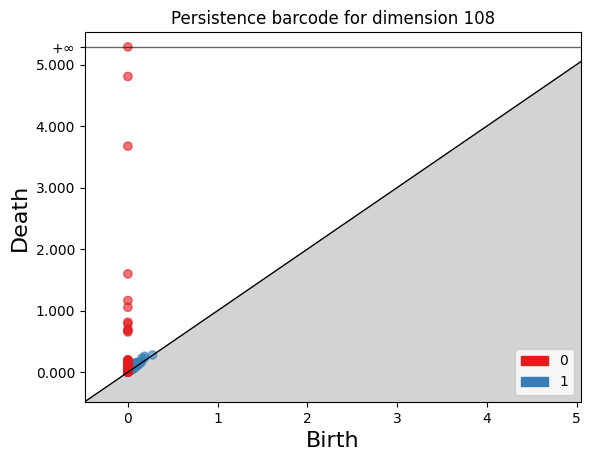

<Figure size 640x480 with 0 Axes>

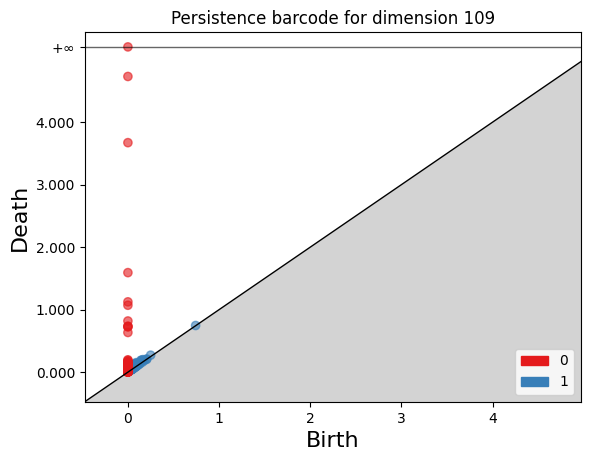

<Figure size 640x480 with 0 Axes>

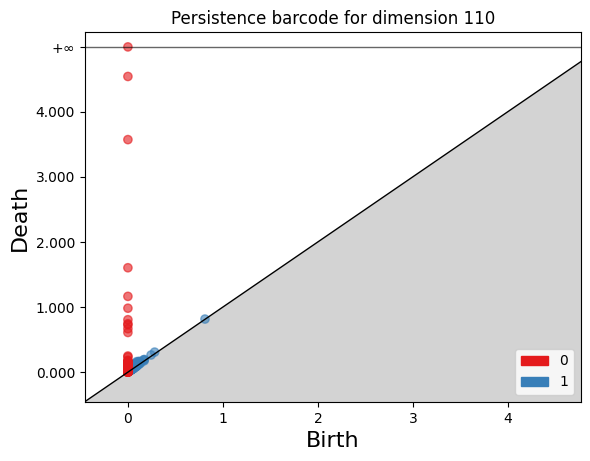

<Figure size 640x480 with 0 Axes>

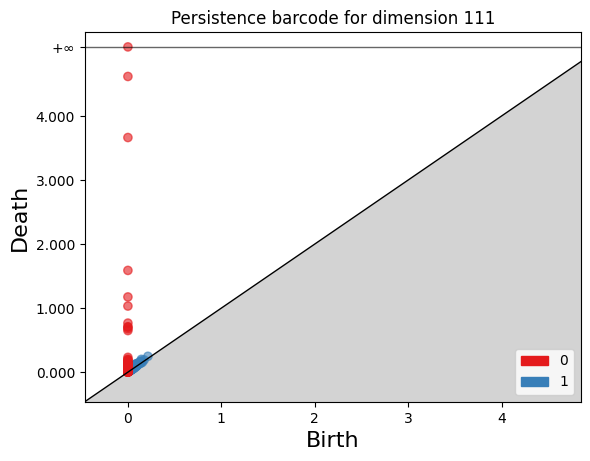

<Figure size 640x480 with 0 Axes>

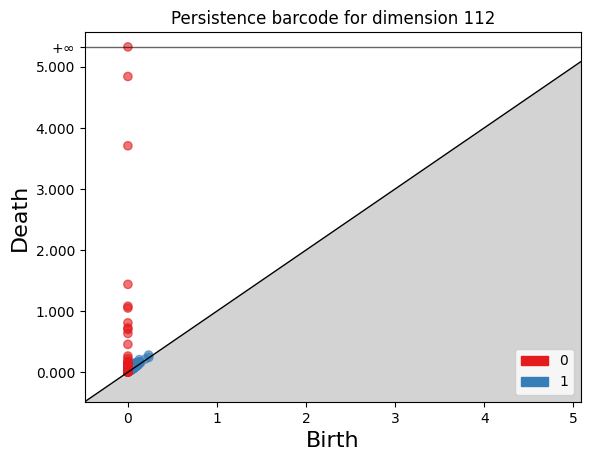

<Figure size 640x480 with 0 Axes>

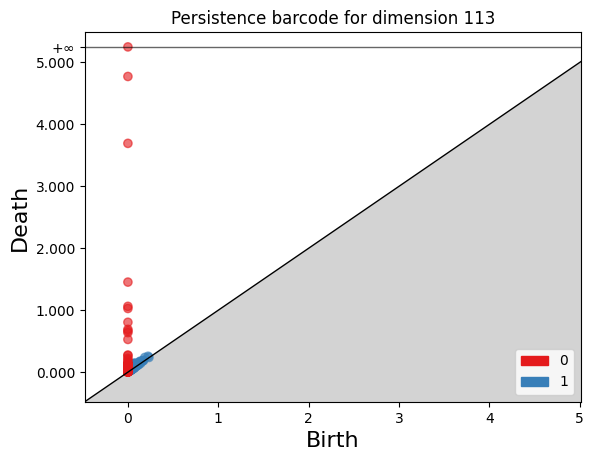

<Figure size 640x480 with 0 Axes>

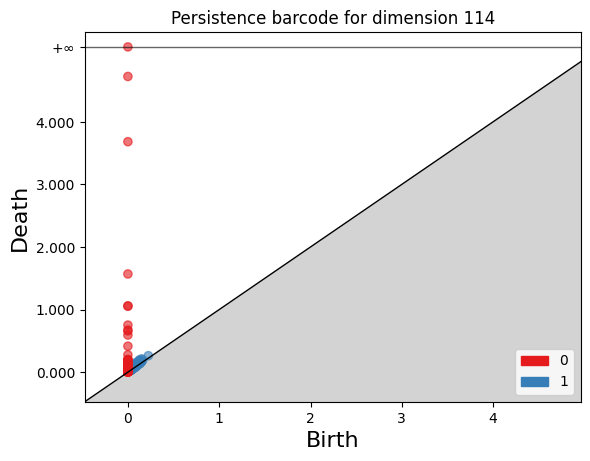

<Figure size 640x480 with 0 Axes>

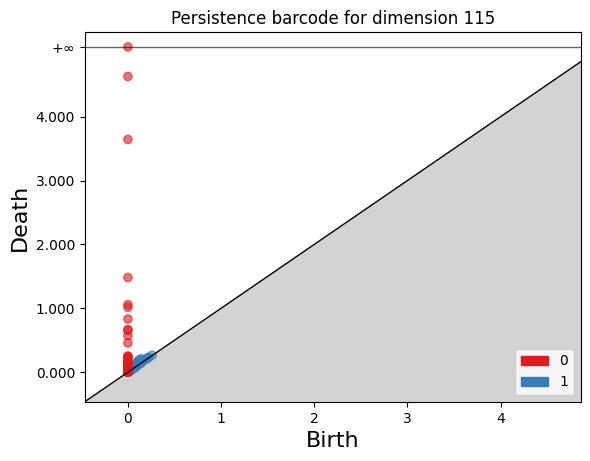

<Figure size 640x480 with 0 Axes>

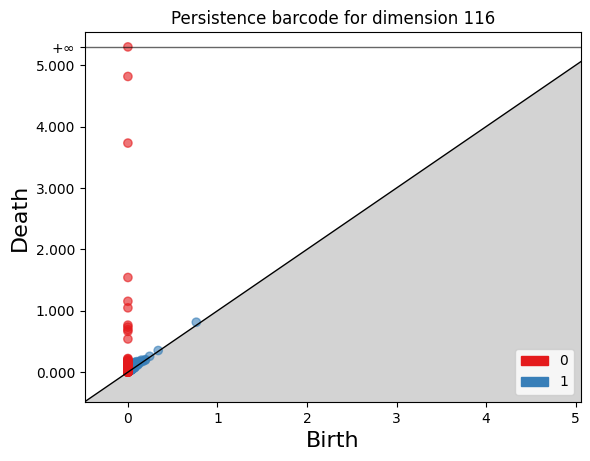

<Figure size 640x480 with 0 Axes>

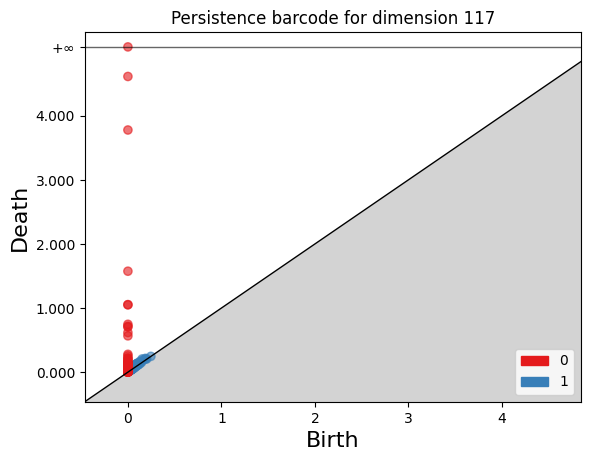

<Figure size 640x480 with 0 Axes>

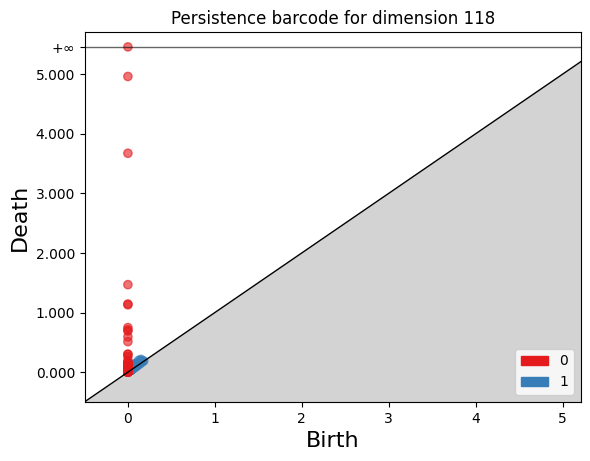

<Figure size 640x480 with 0 Axes>

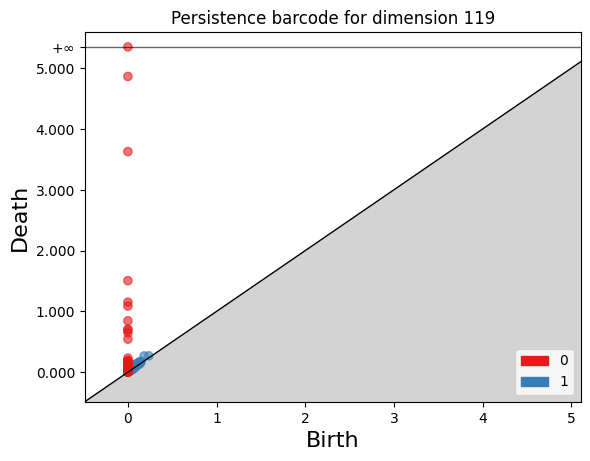

<Figure size 640x480 with 0 Axes>

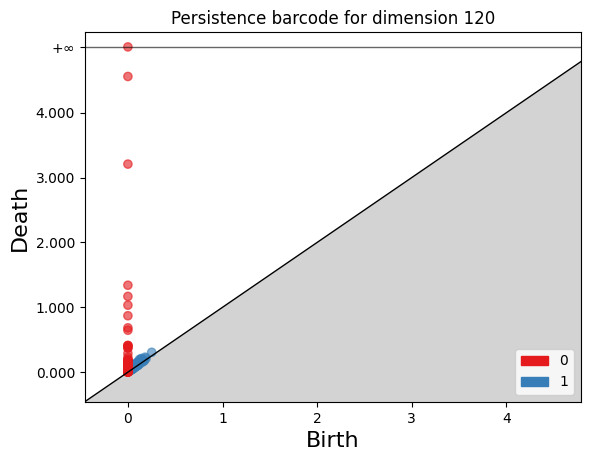

<Figure size 640x480 with 0 Axes>

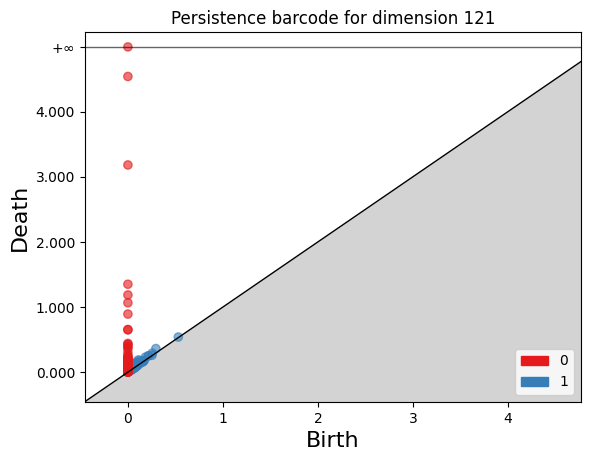

<Figure size 640x480 with 0 Axes>

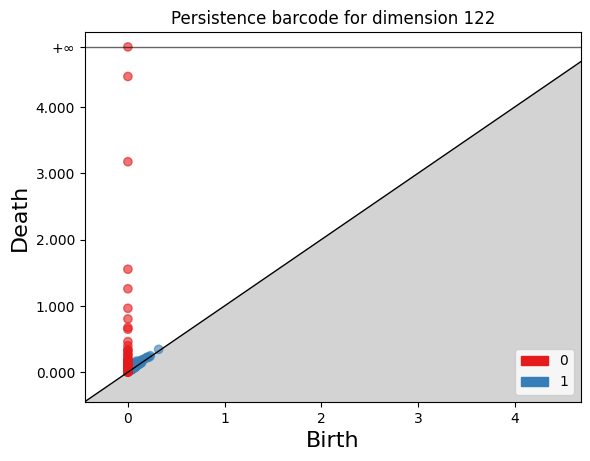

<Figure size 640x480 with 0 Axes>

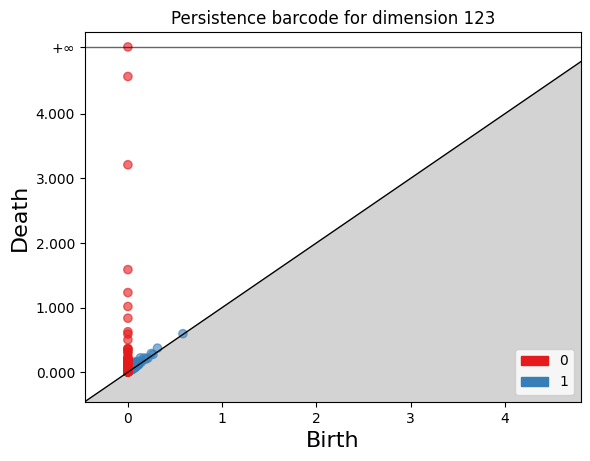

<Figure size 640x480 with 0 Axes>

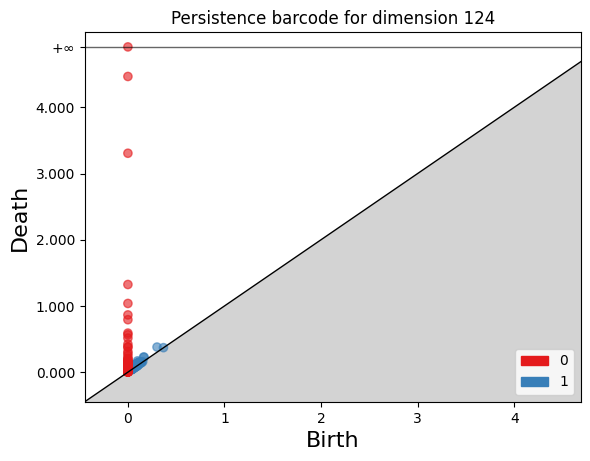

<Figure size 640x480 with 0 Axes>

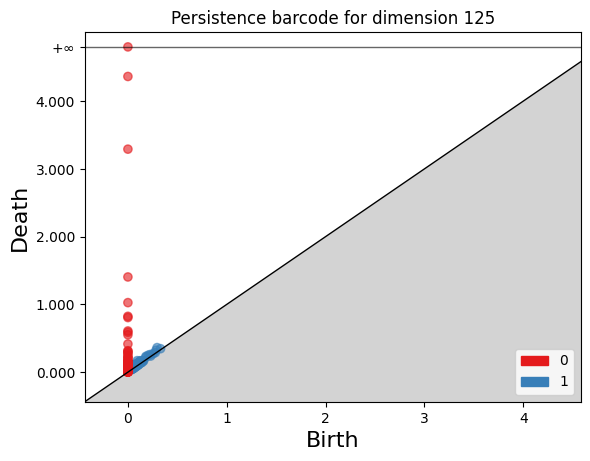

<Figure size 640x480 with 0 Axes>

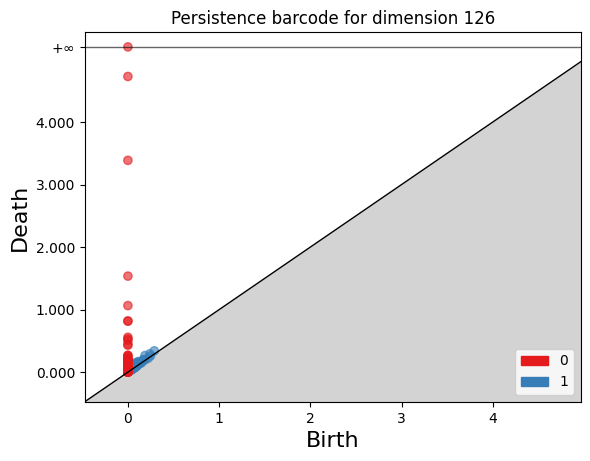

<Figure size 640x480 with 0 Axes>

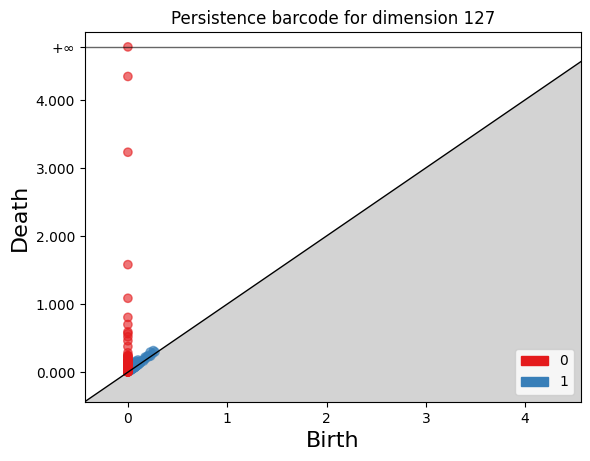

<Figure size 640x480 with 0 Axes>

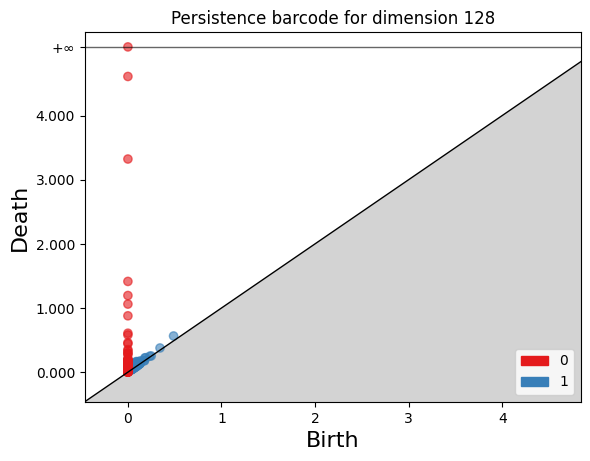

<Figure size 640x480 with 0 Axes>

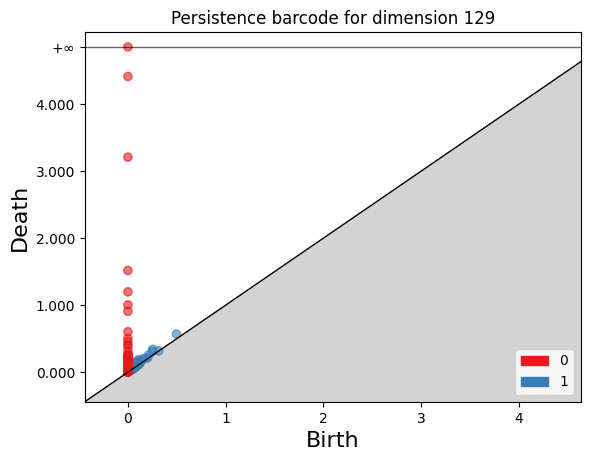

<Figure size 640x480 with 0 Axes>

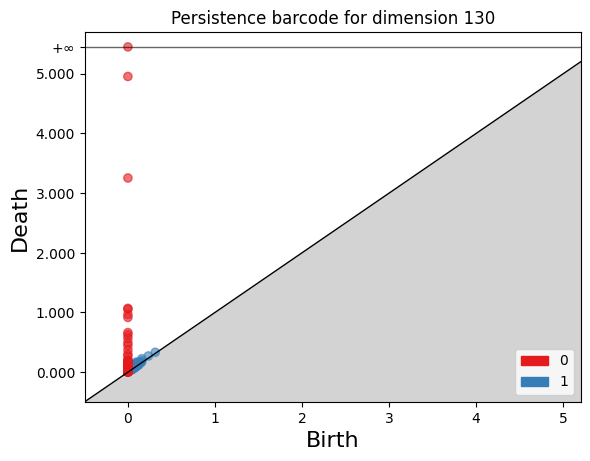

<Figure size 640x480 with 0 Axes>

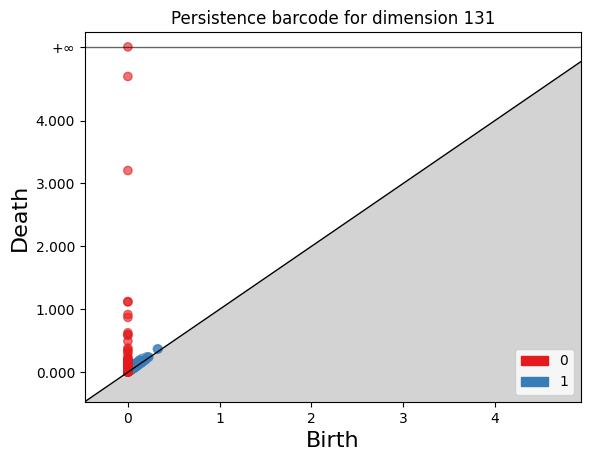

<Figure size 640x480 with 0 Axes>

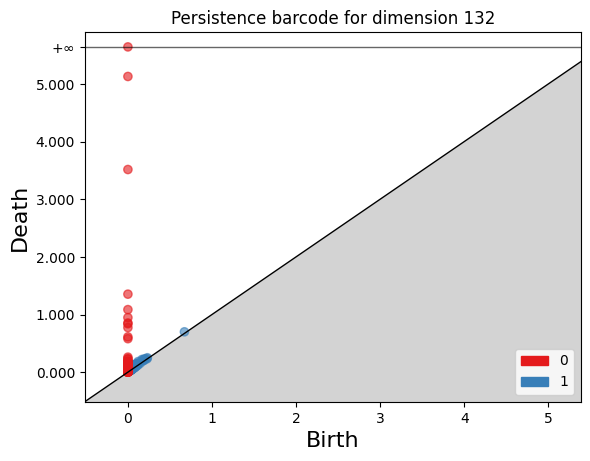

<Figure size 640x480 with 0 Axes>

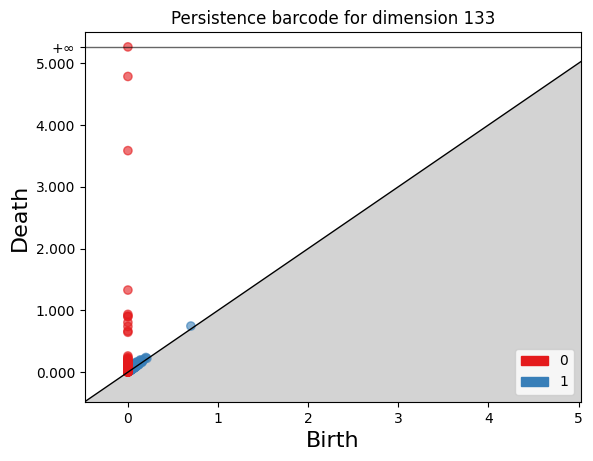

<Figure size 640x480 with 0 Axes>

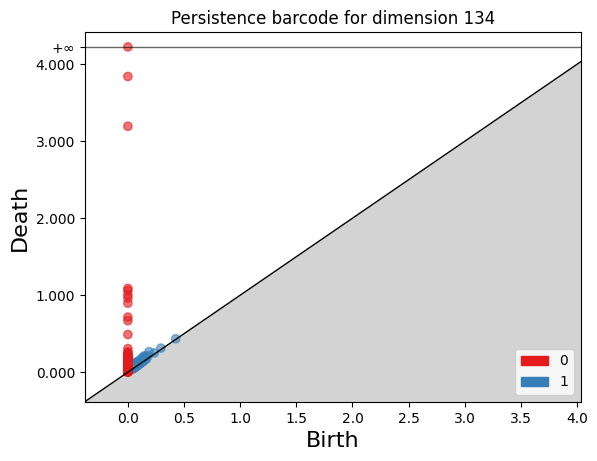

<Figure size 640x480 with 0 Axes>

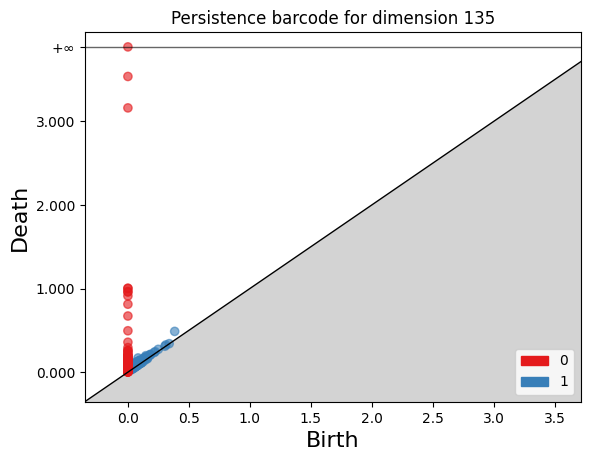

<Figure size 640x480 with 0 Axes>

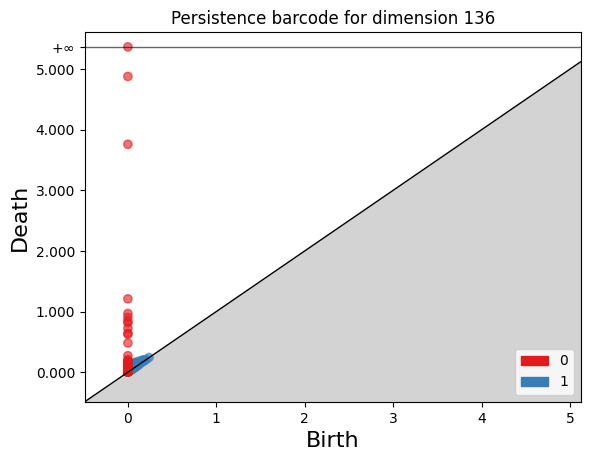

<Figure size 640x480 with 0 Axes>

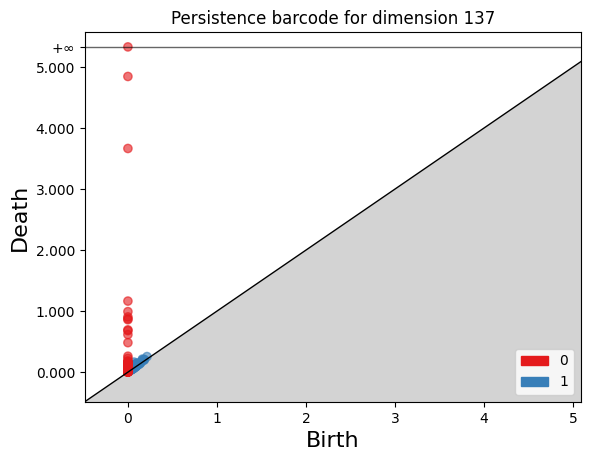

<Figure size 640x480 with 0 Axes>

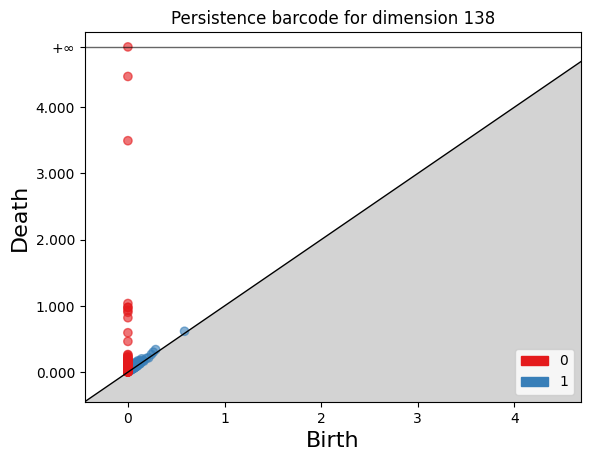

<Figure size 640x480 with 0 Axes>

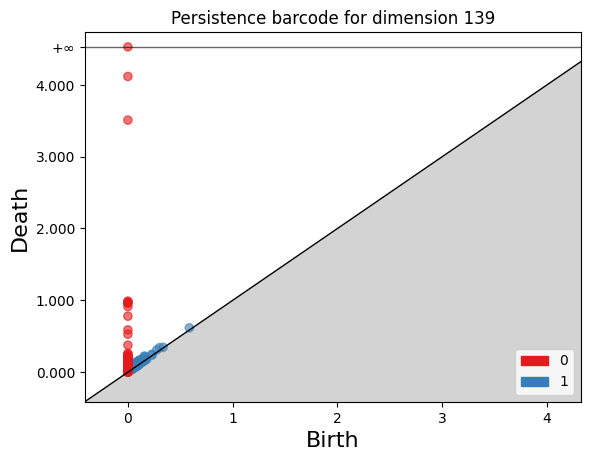

<Figure size 640x480 with 0 Axes>

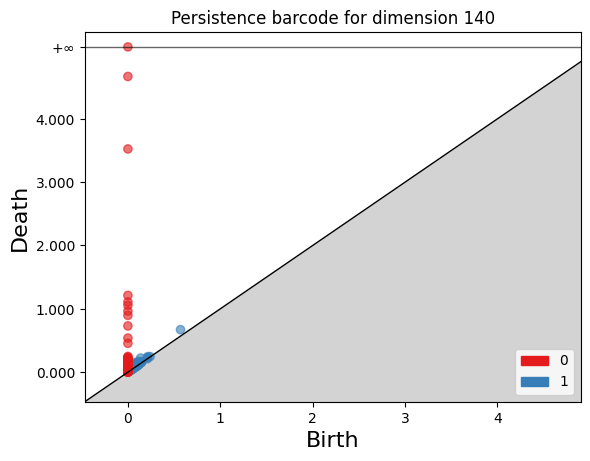

<Figure size 640x480 with 0 Axes>

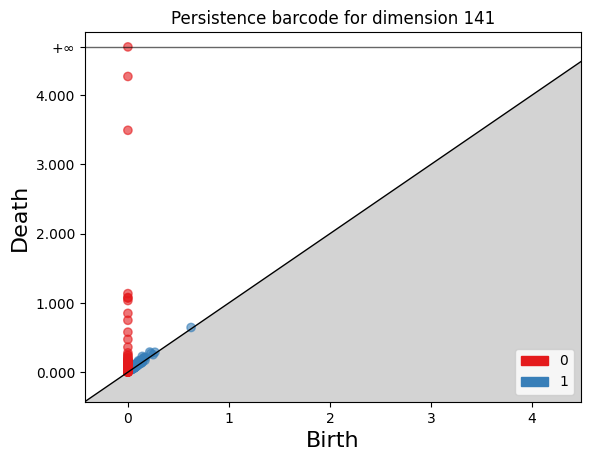

<Figure size 640x480 with 0 Axes>

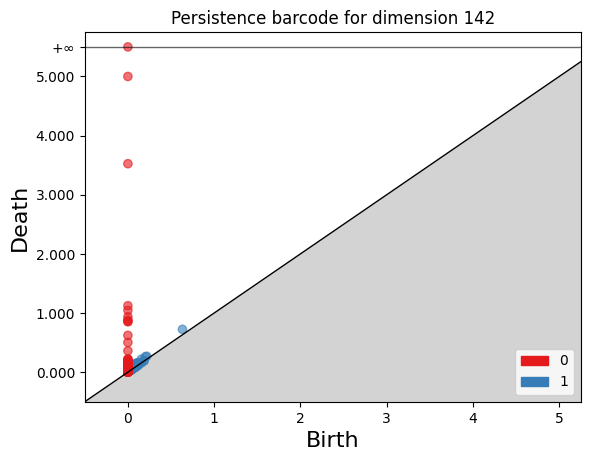

<Figure size 640x480 with 0 Axes>

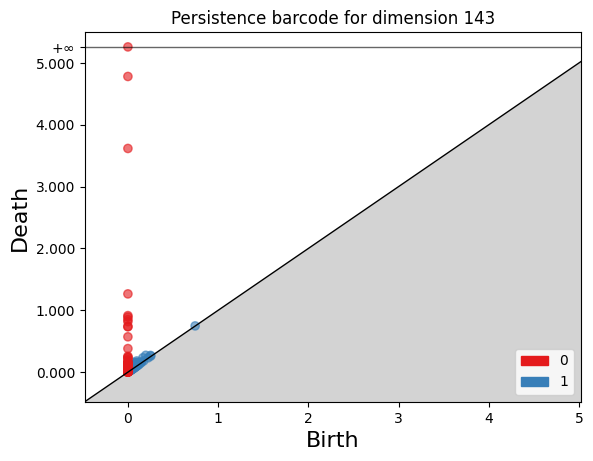

<Figure size 640x480 with 0 Axes>

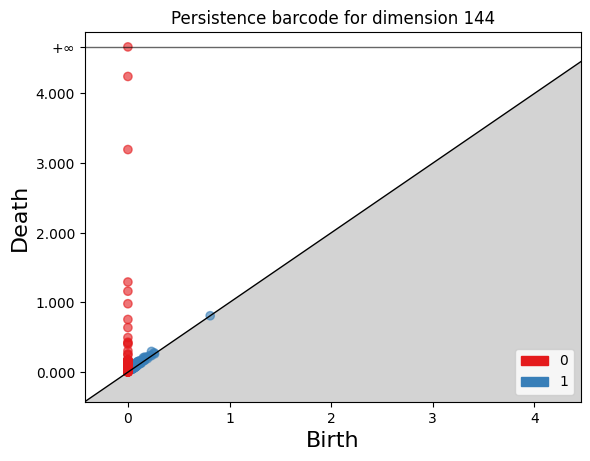

<Figure size 640x480 with 0 Axes>

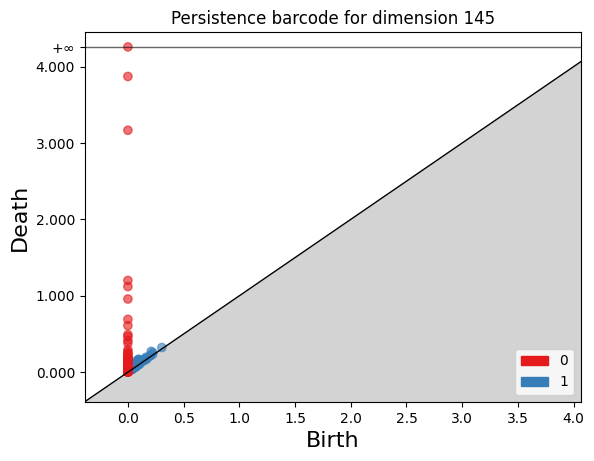

<Figure size 640x480 with 0 Axes>

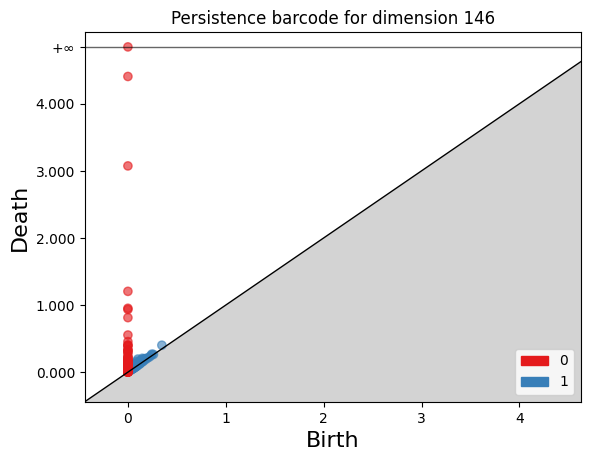

<Figure size 640x480 with 0 Axes>

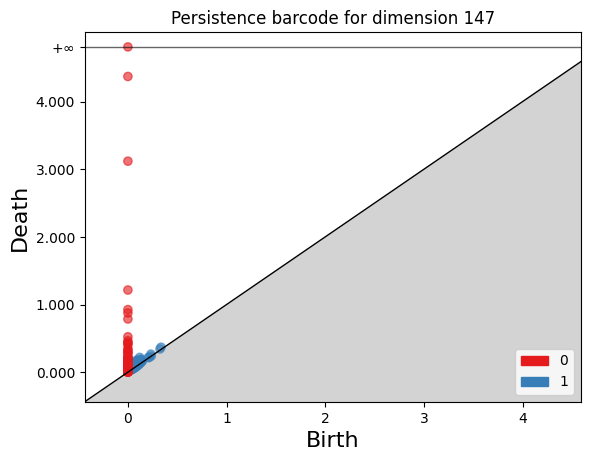

<Figure size 640x480 with 0 Axes>

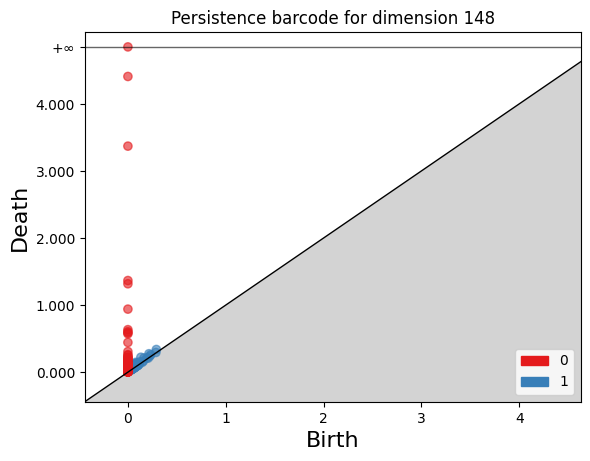

<Figure size 640x480 with 0 Axes>

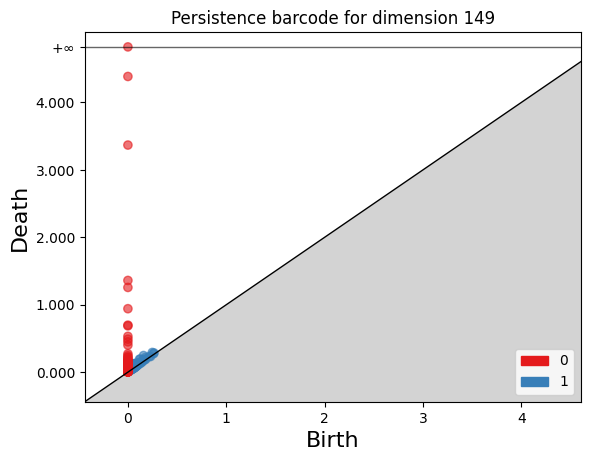

<Figure size 640x480 with 0 Axes>

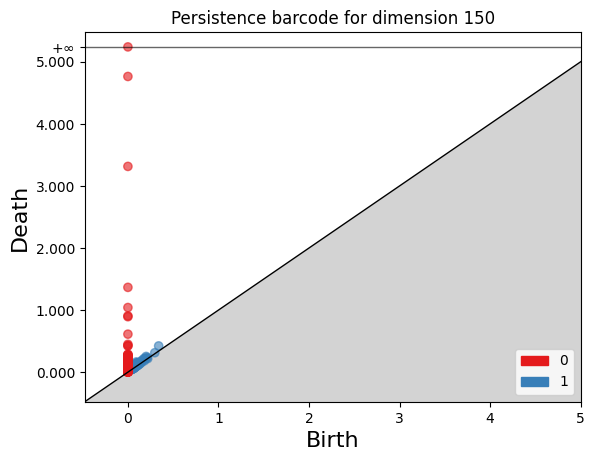

<Figure size 640x480 with 0 Axes>

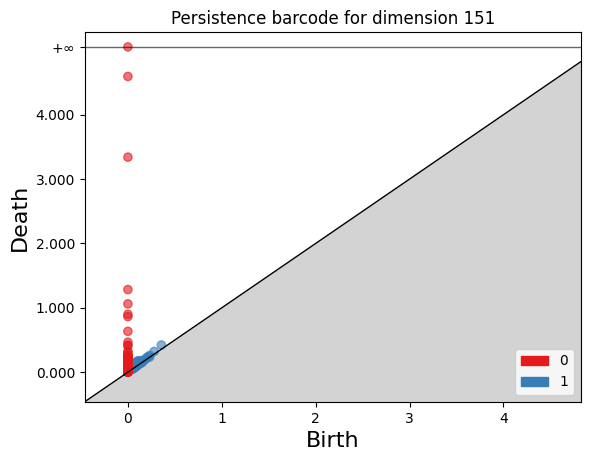

<Figure size 640x480 with 0 Axes>

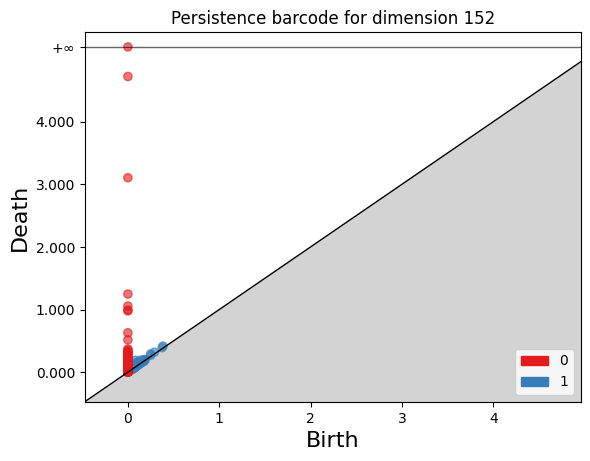

<Figure size 640x480 with 0 Axes>

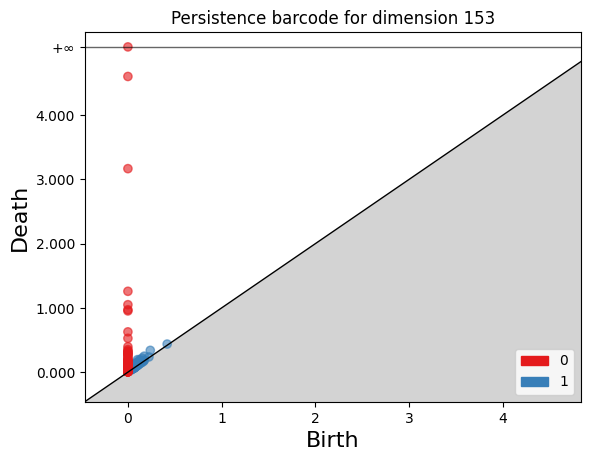

<Figure size 640x480 with 0 Axes>

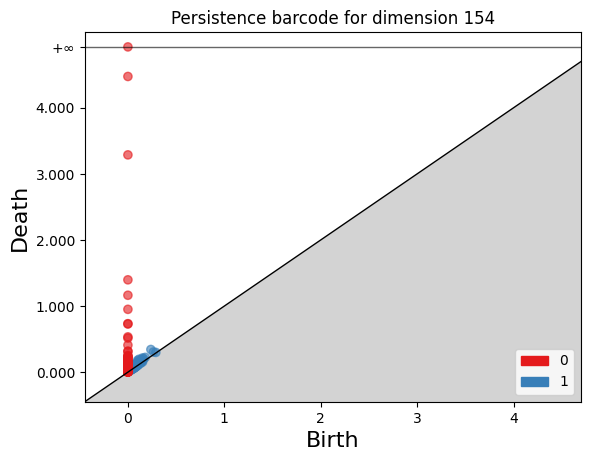

<Figure size 640x480 with 0 Axes>

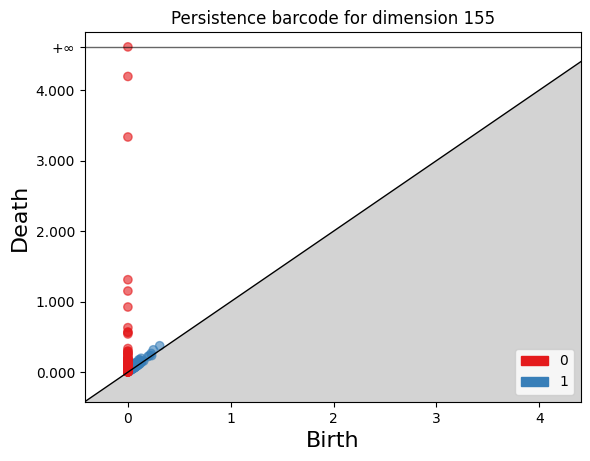

<Figure size 640x480 with 0 Axes>

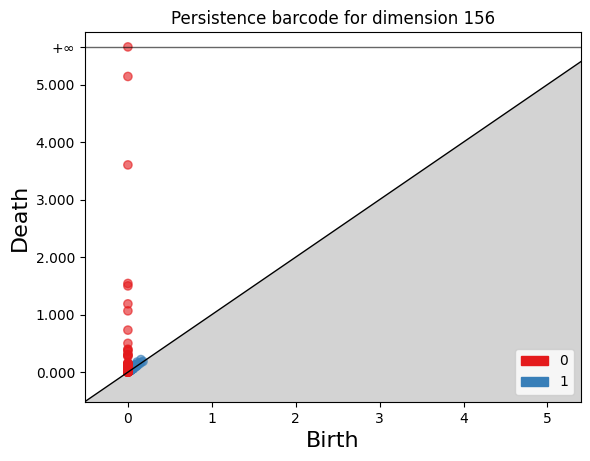

<Figure size 640x480 with 0 Axes>

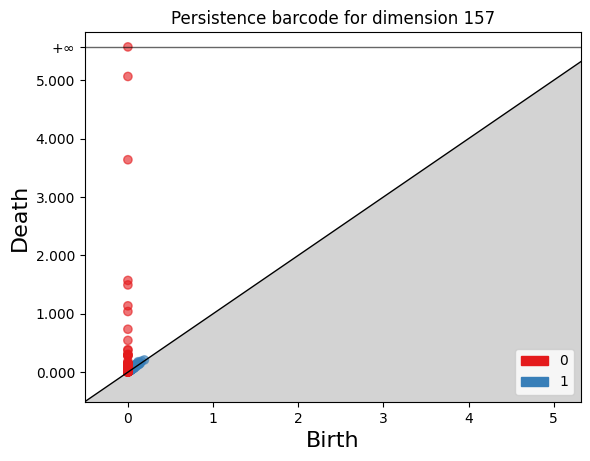

<Figure size 640x480 with 0 Axes>

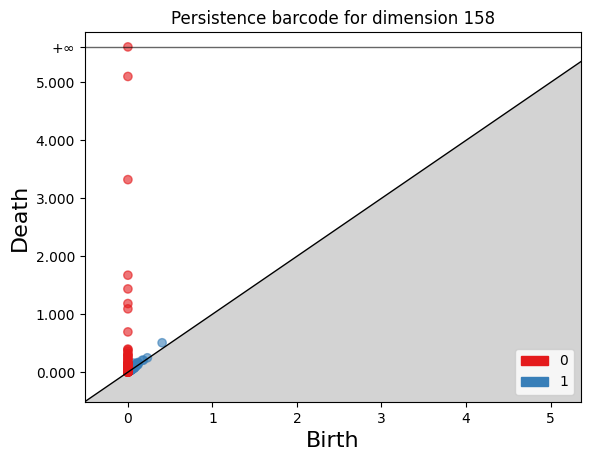

<Figure size 640x480 with 0 Axes>

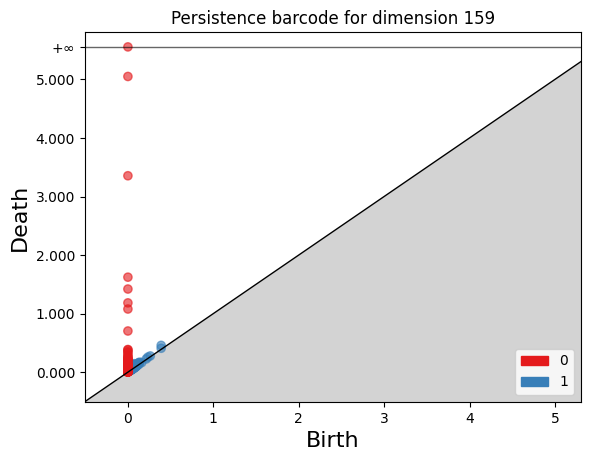

<Figure size 640x480 with 0 Axes>

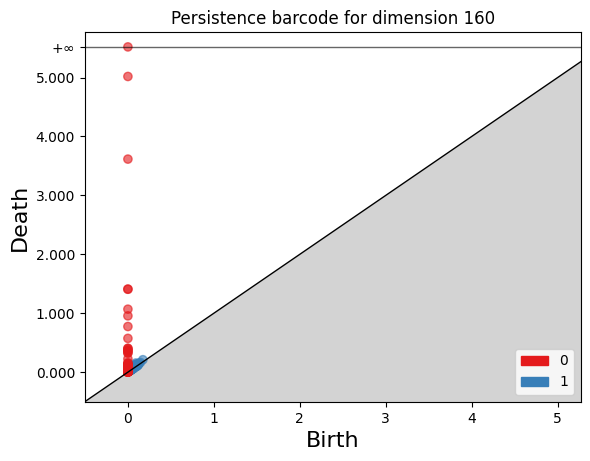

<Figure size 640x480 with 0 Axes>

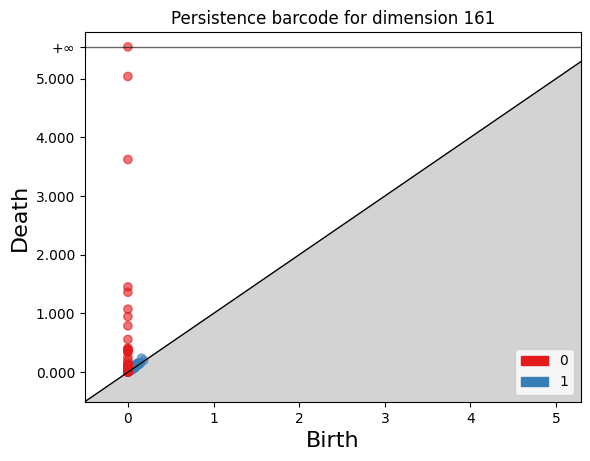

<Figure size 640x480 with 0 Axes>

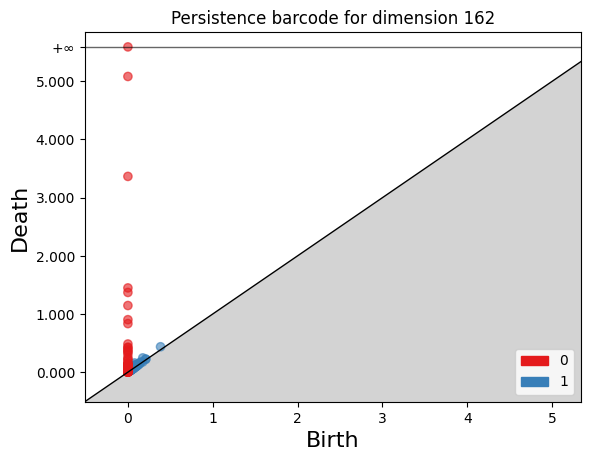

<Figure size 640x480 with 0 Axes>

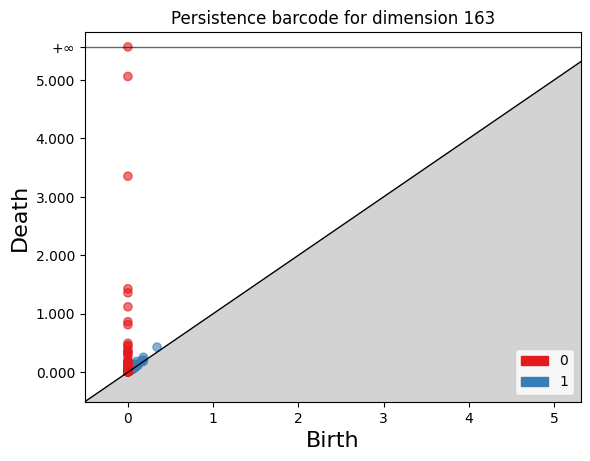

<Figure size 640x480 with 0 Axes>

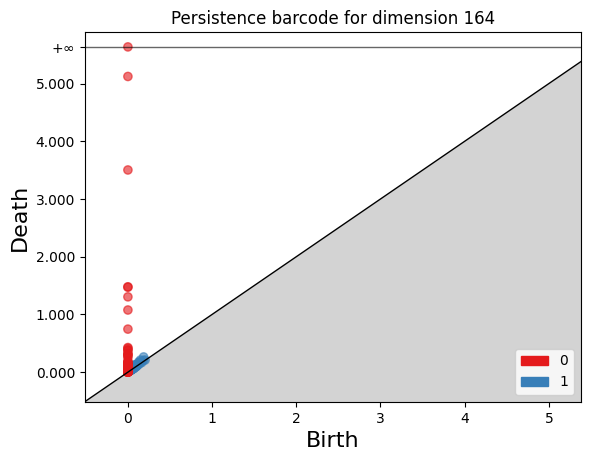

<Figure size 640x480 with 0 Axes>

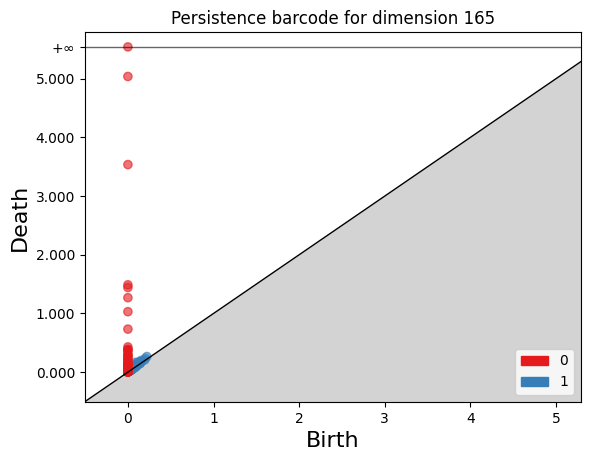

<Figure size 640x480 with 0 Axes>

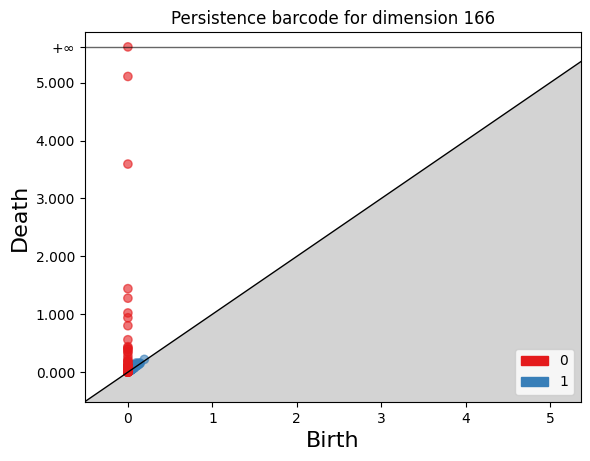

<Figure size 640x480 with 0 Axes>

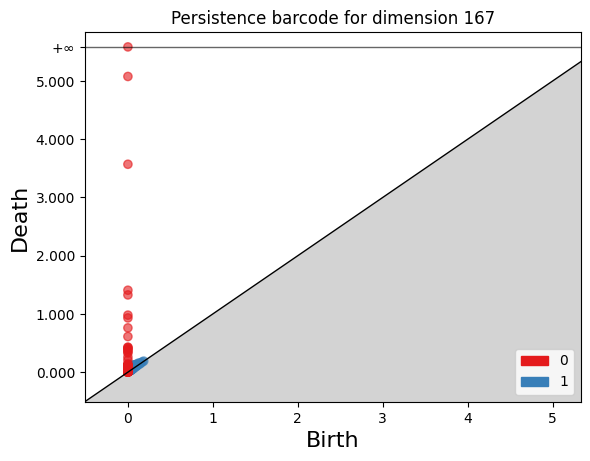

<Figure size 640x480 with 0 Axes>

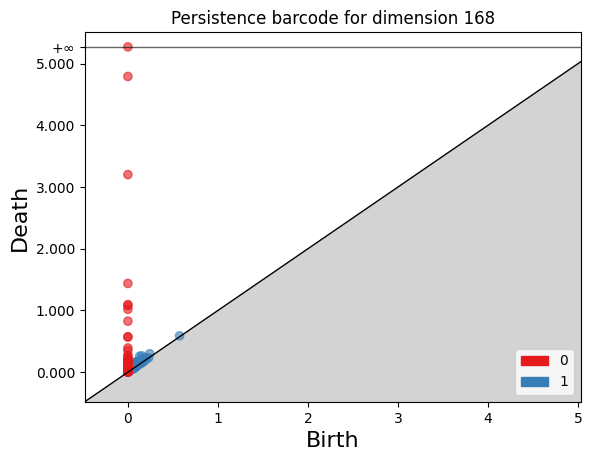

<Figure size 640x480 with 0 Axes>

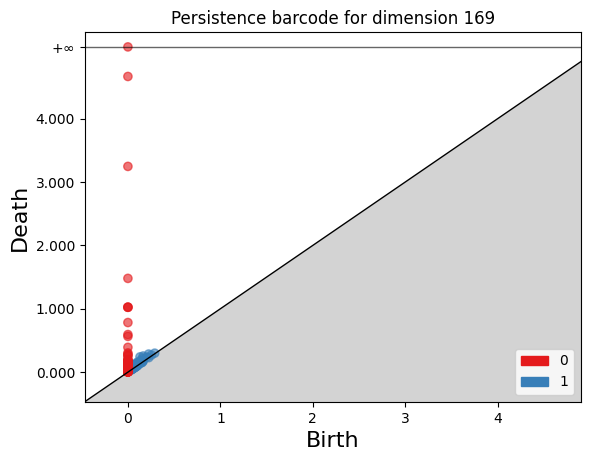

<Figure size 640x480 with 0 Axes>

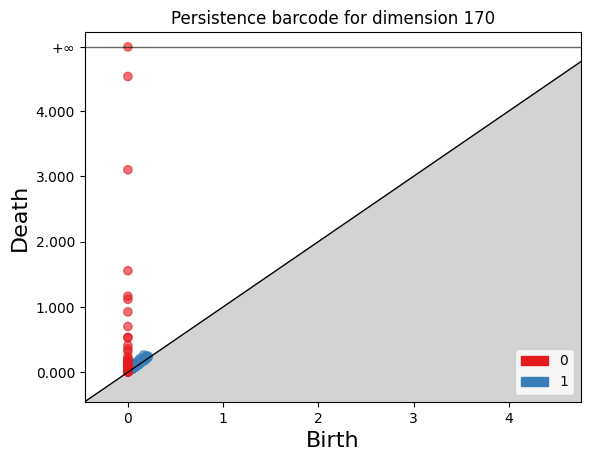

<Figure size 640x480 with 0 Axes>

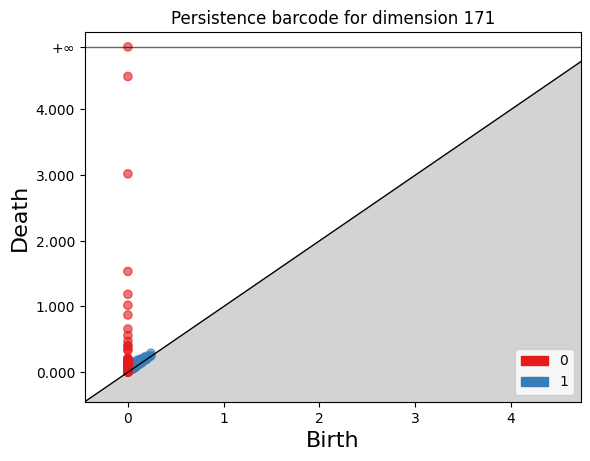

<Figure size 640x480 with 0 Axes>

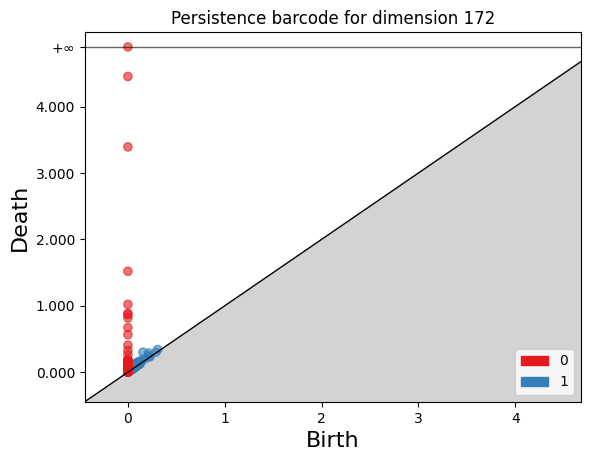

<Figure size 640x480 with 0 Axes>

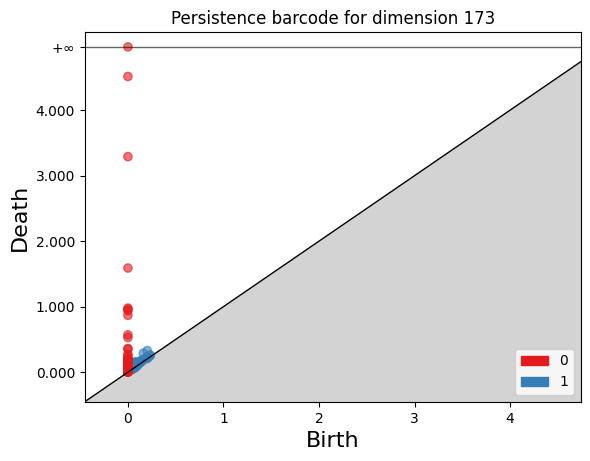

<Figure size 640x480 with 0 Axes>

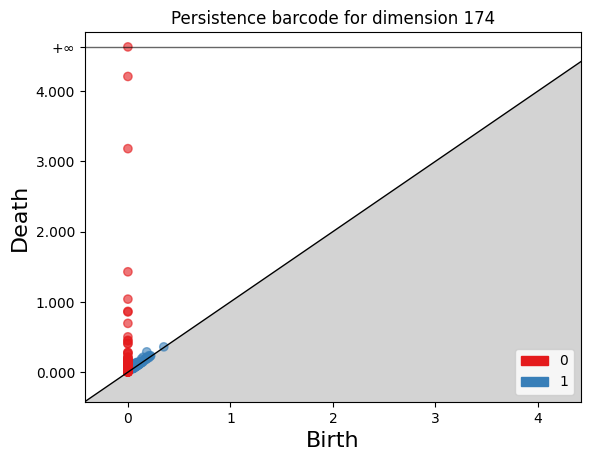

<Figure size 640x480 with 0 Axes>

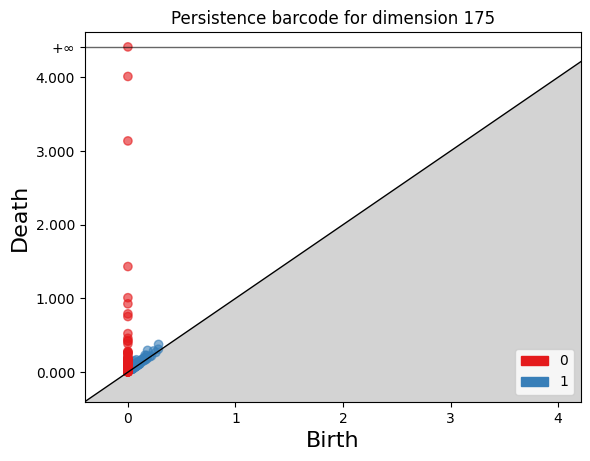

<Figure size 640x480 with 0 Axes>

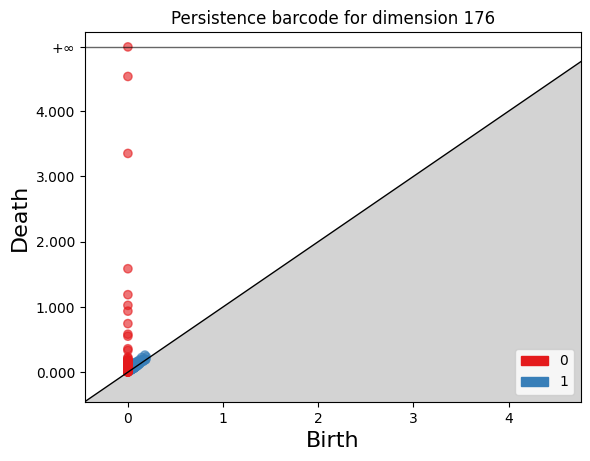

<Figure size 640x480 with 0 Axes>

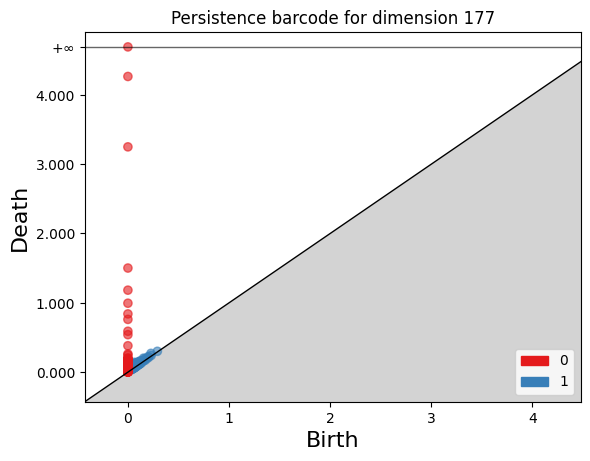

<Figure size 640x480 with 0 Axes>

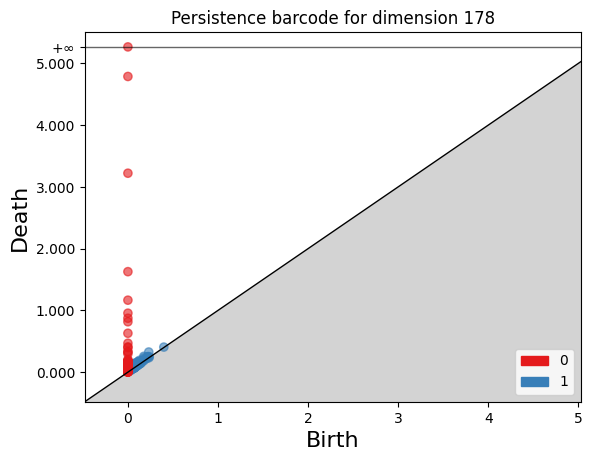

<Figure size 640x480 with 0 Axes>

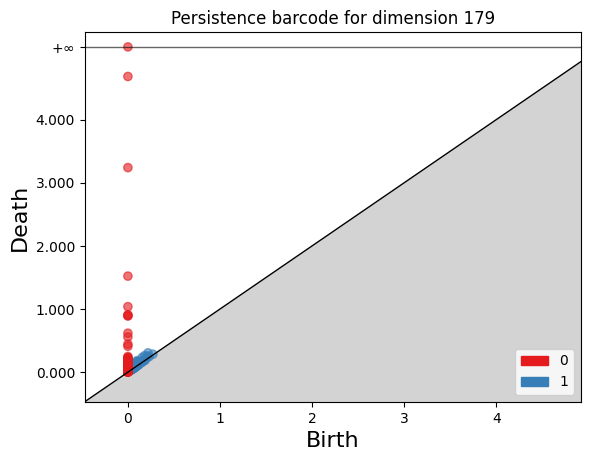

<Figure size 640x480 with 0 Axes>

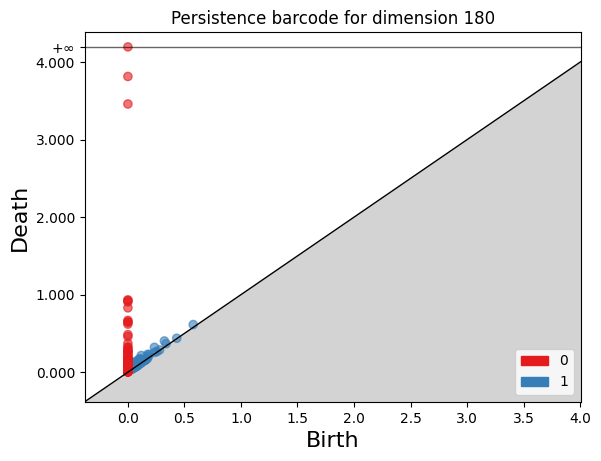

<Figure size 640x480 with 0 Axes>

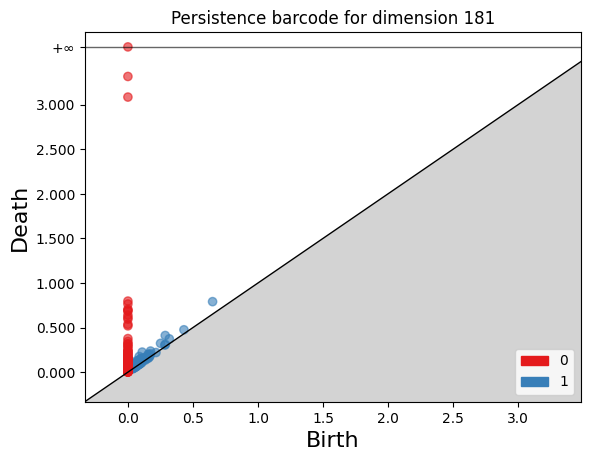

<Figure size 640x480 with 0 Axes>

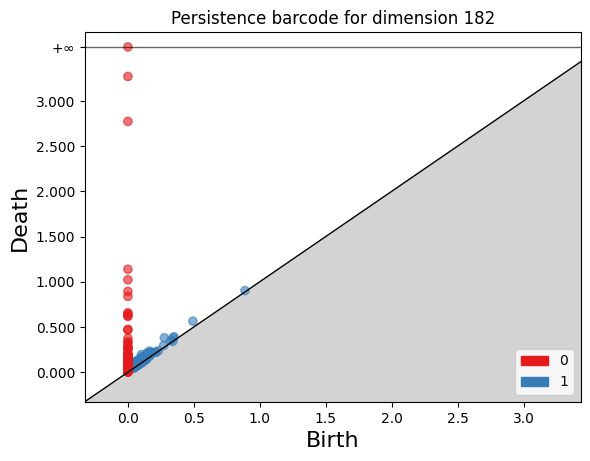

<Figure size 640x480 with 0 Axes>

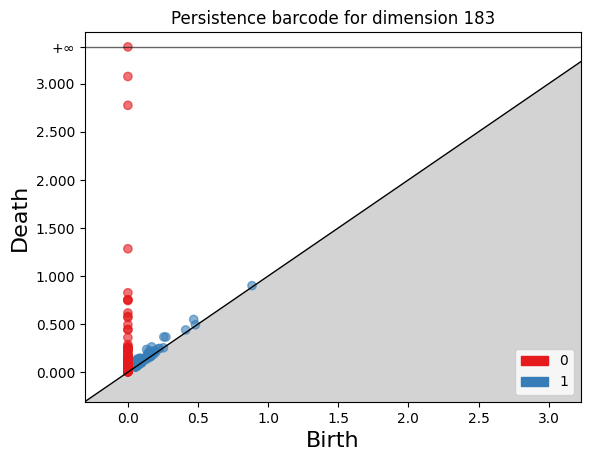

<Figure size 640x480 with 0 Axes>

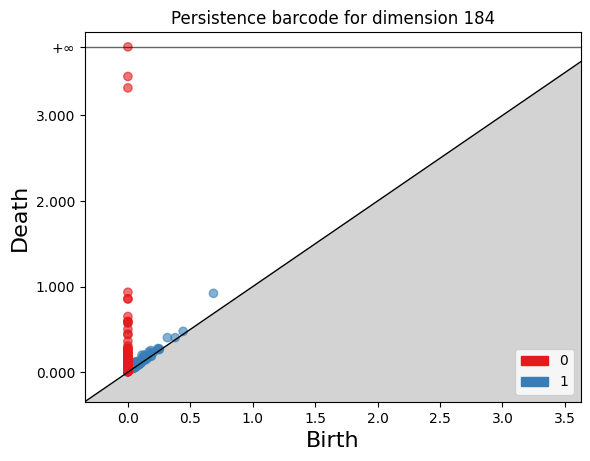

<Figure size 640x480 with 0 Axes>

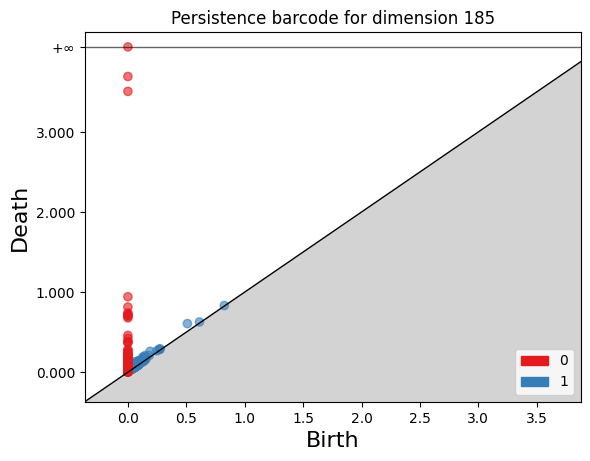

<Figure size 640x480 with 0 Axes>

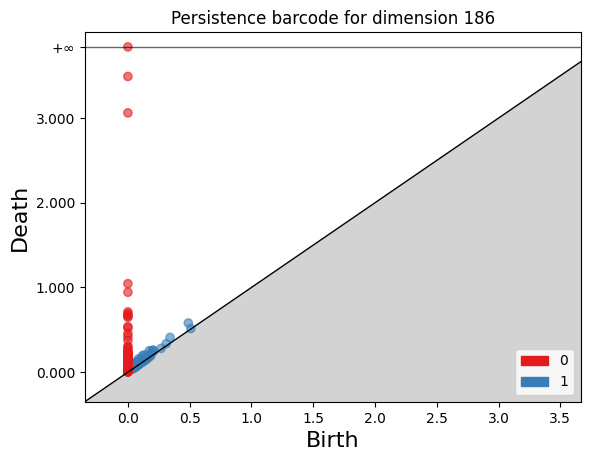

<Figure size 640x480 with 0 Axes>

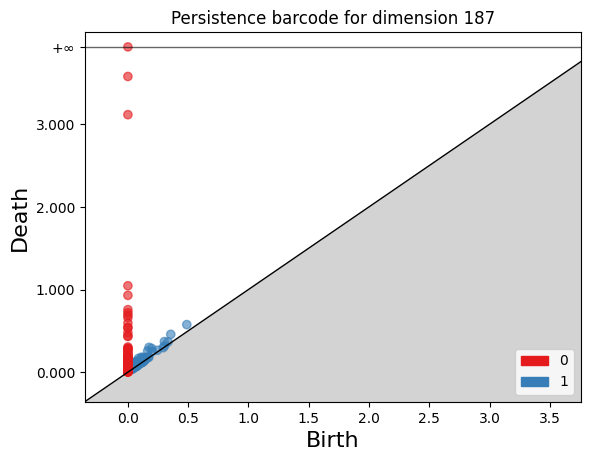

<Figure size 640x480 with 0 Axes>

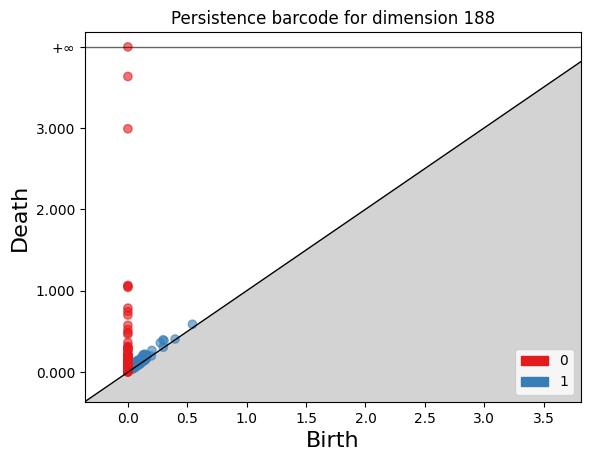

<Figure size 640x480 with 0 Axes>

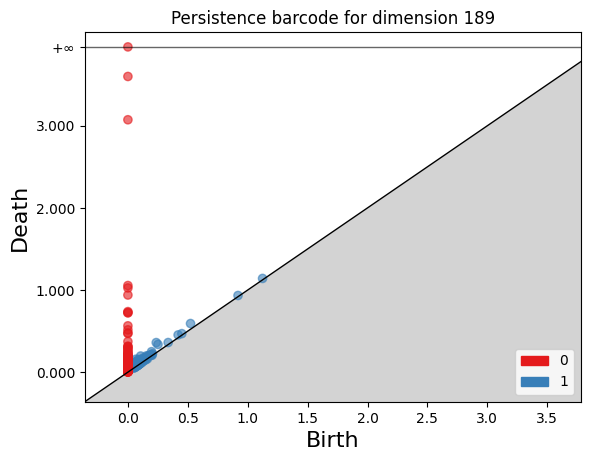

<Figure size 640x480 with 0 Axes>

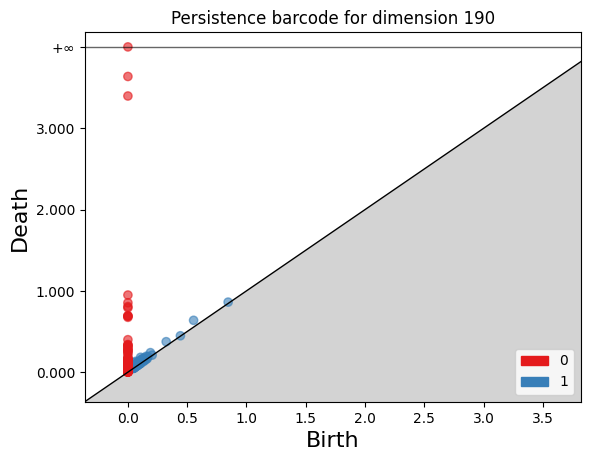

<Figure size 640x480 with 0 Axes>

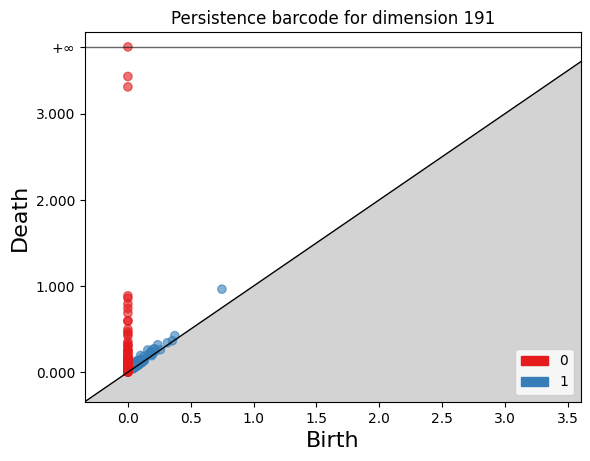

<Figure size 640x480 with 0 Axes>

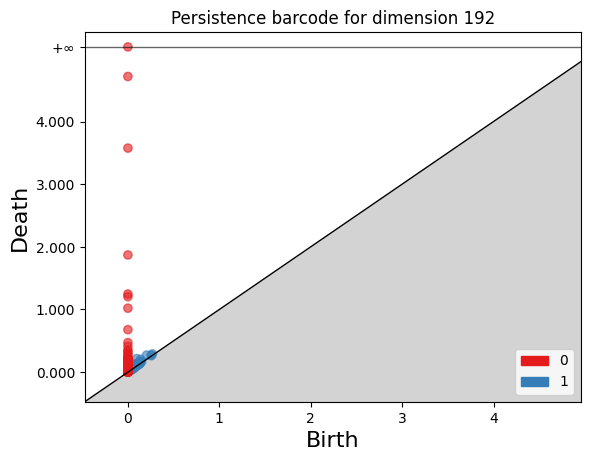

<Figure size 640x480 with 0 Axes>

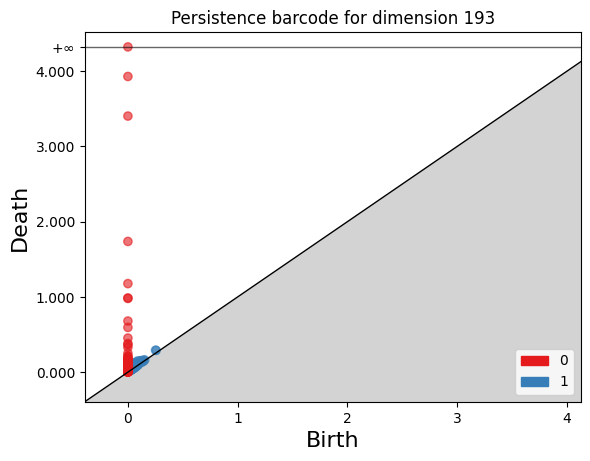

<Figure size 640x480 with 0 Axes>

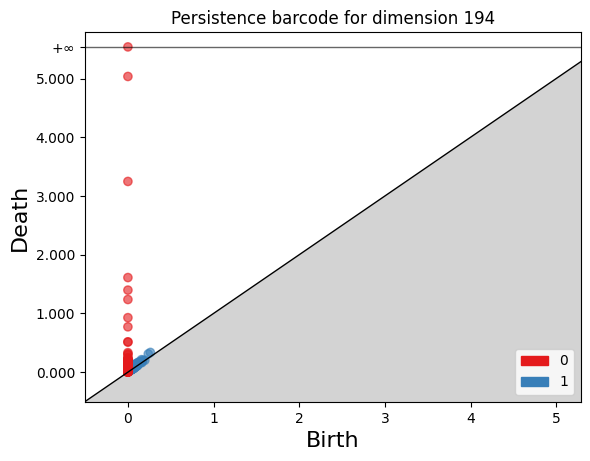

<Figure size 640x480 with 0 Axes>

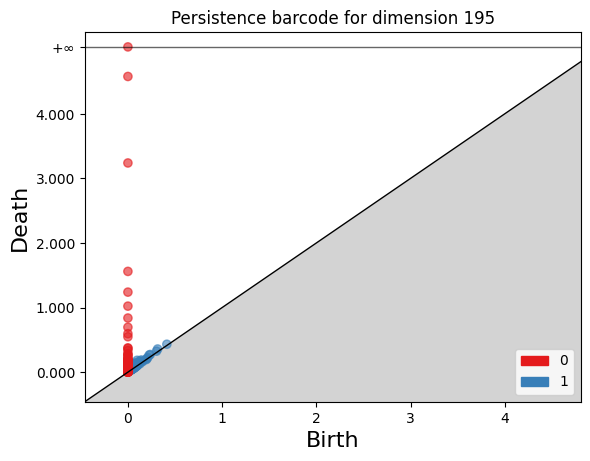

<Figure size 640x480 with 0 Axes>

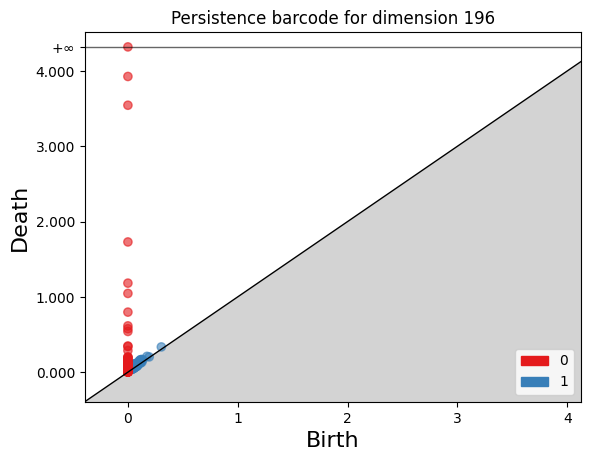

<Figure size 640x480 with 0 Axes>

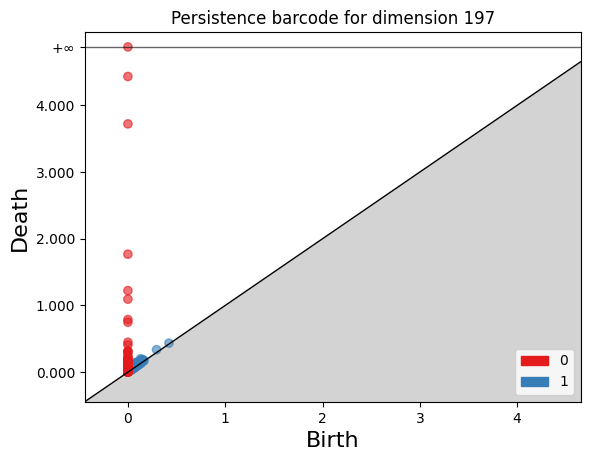

<Figure size 640x480 with 0 Axes>

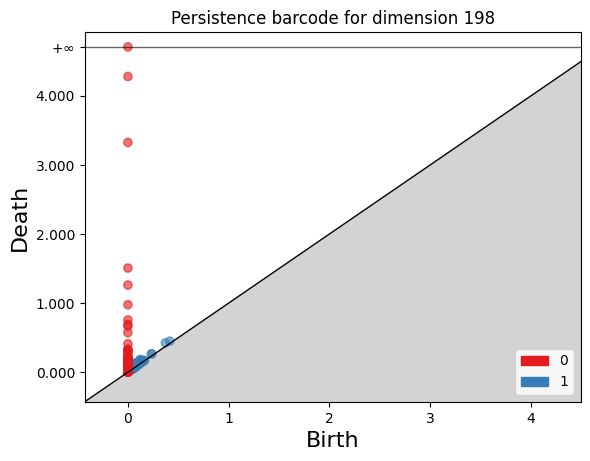

<Figure size 640x480 with 0 Axes>

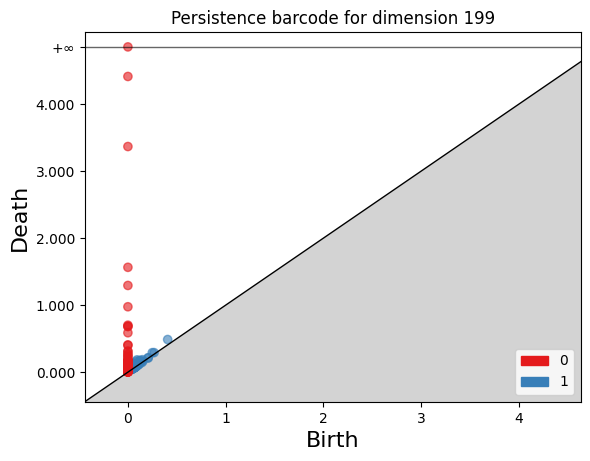

<Figure size 640x480 with 0 Axes>

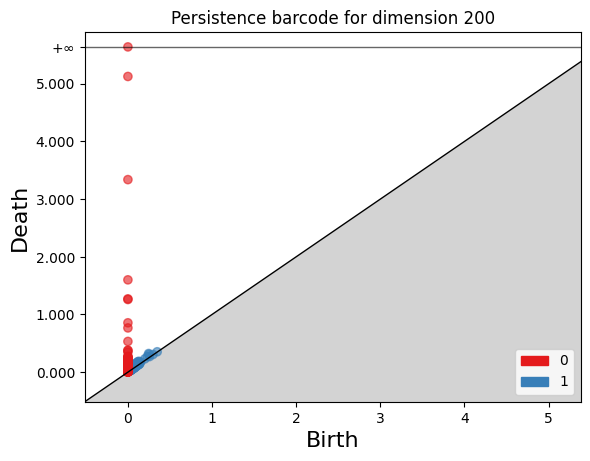

<Figure size 640x480 with 0 Axes>

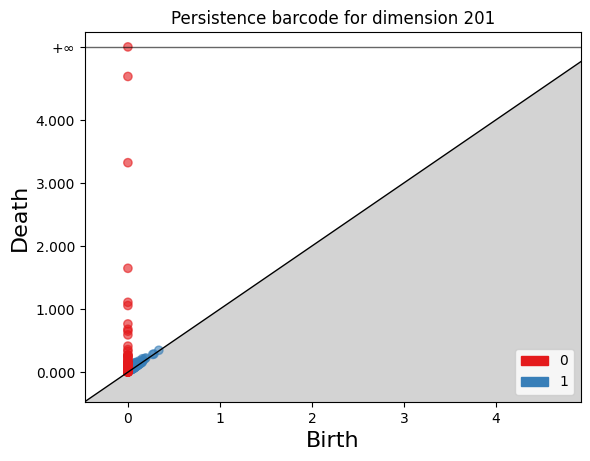

<Figure size 640x480 with 0 Axes>

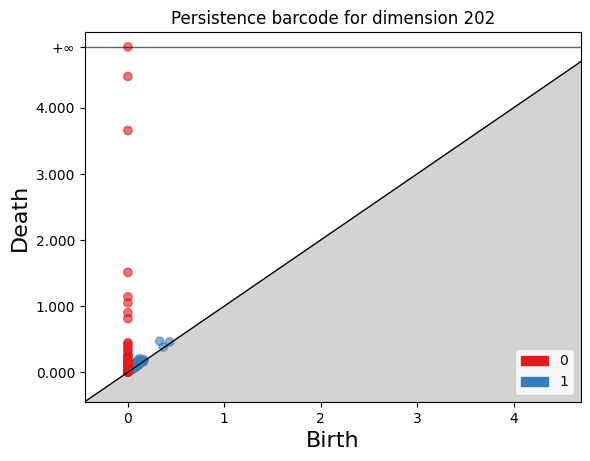

<Figure size 640x480 with 0 Axes>

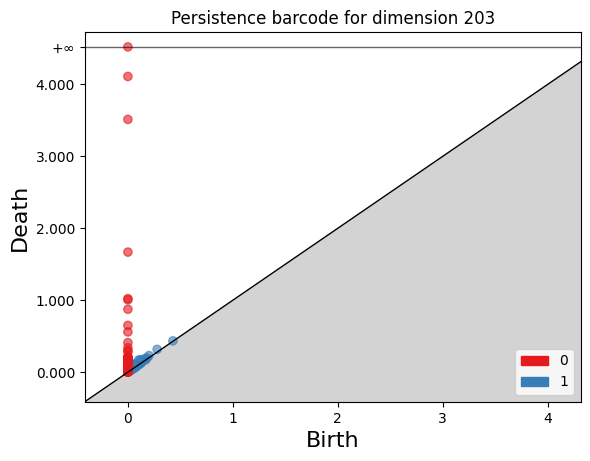

<Figure size 640x480 with 0 Axes>

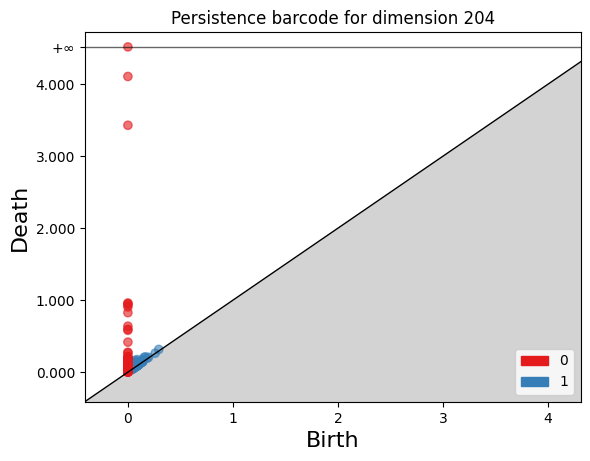

<Figure size 640x480 with 0 Axes>

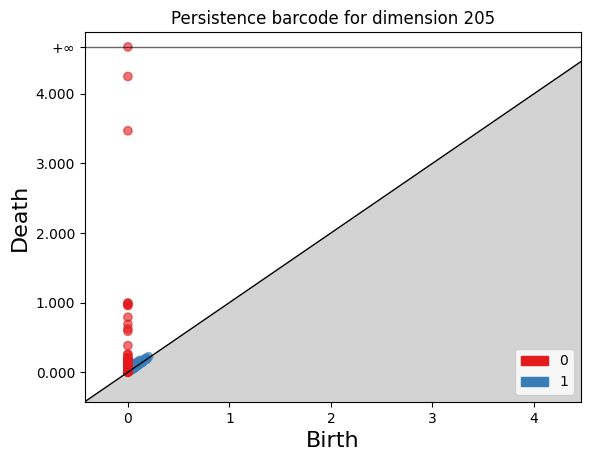

<Figure size 640x480 with 0 Axes>

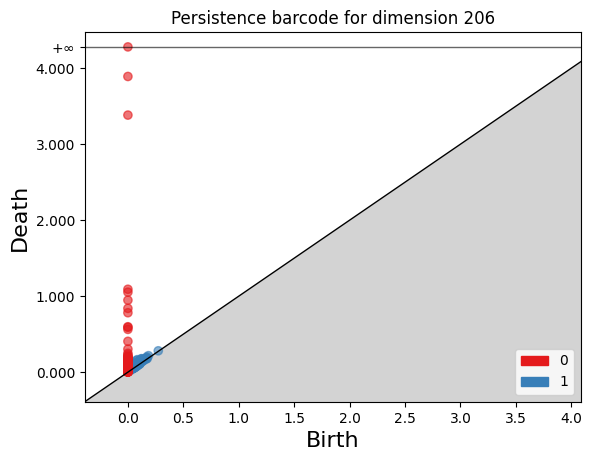

<Figure size 640x480 with 0 Axes>

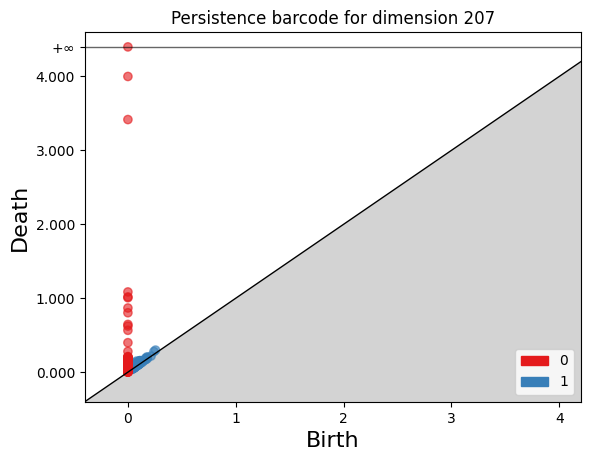

<Figure size 640x480 with 0 Axes>

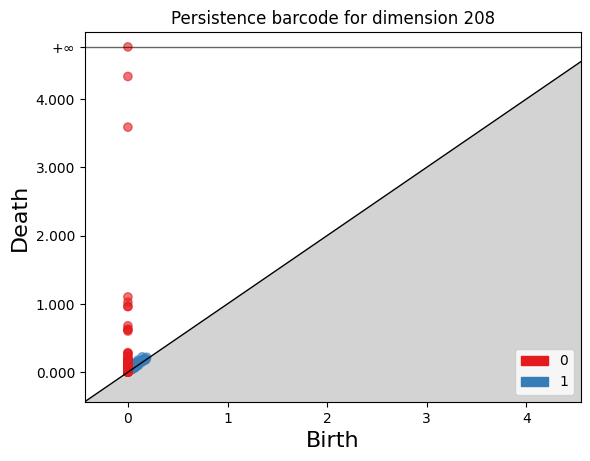

<Figure size 640x480 with 0 Axes>

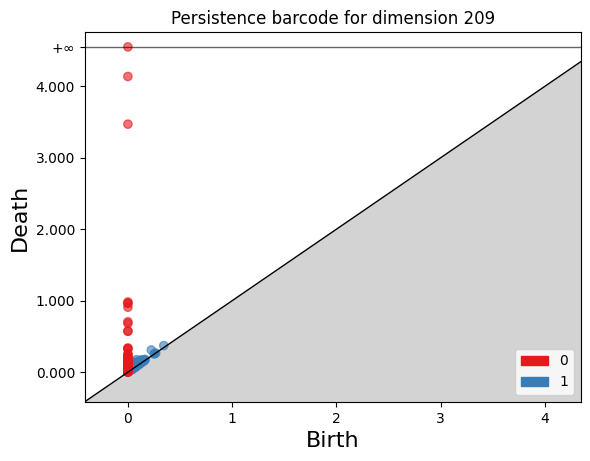

<Figure size 640x480 with 0 Axes>

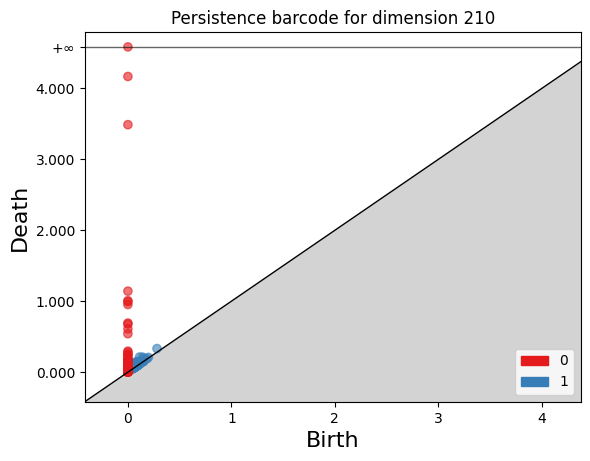

<Figure size 640x480 with 0 Axes>

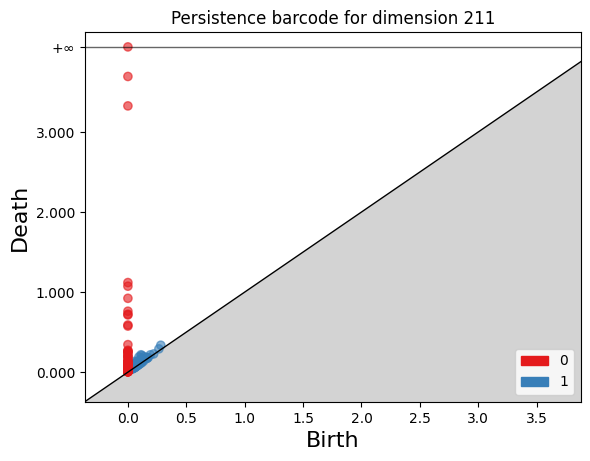

<Figure size 640x480 with 0 Axes>

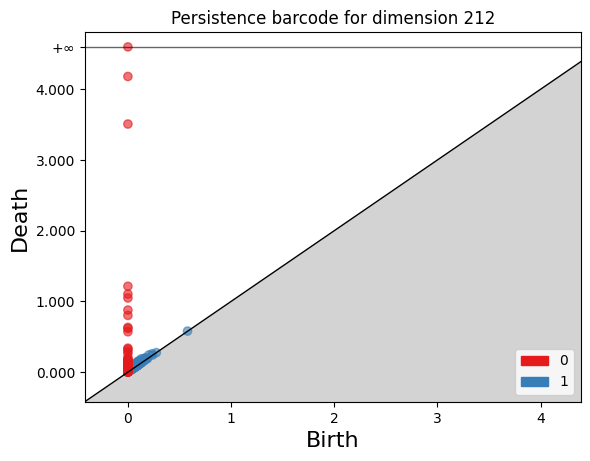

<Figure size 640x480 with 0 Axes>

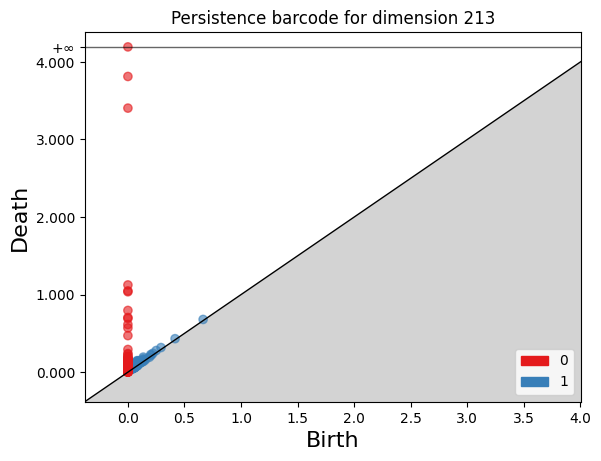

<Figure size 640x480 with 0 Axes>

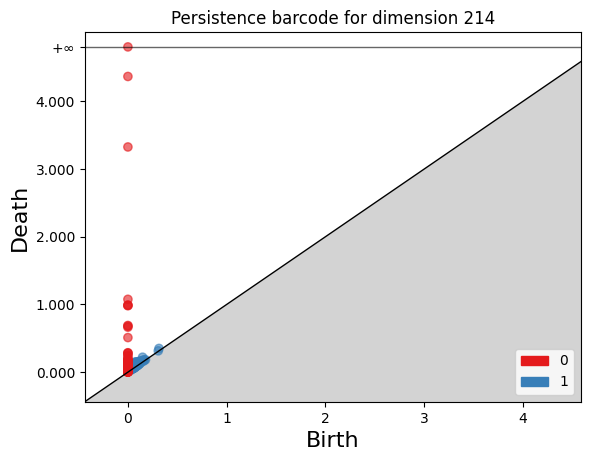

<Figure size 640x480 with 0 Axes>

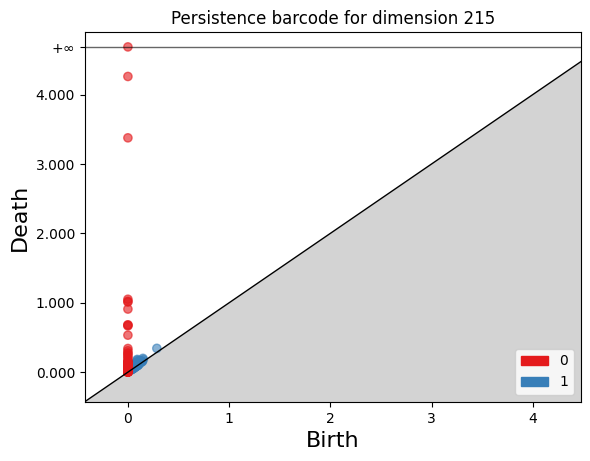

<Figure size 640x480 with 0 Axes>

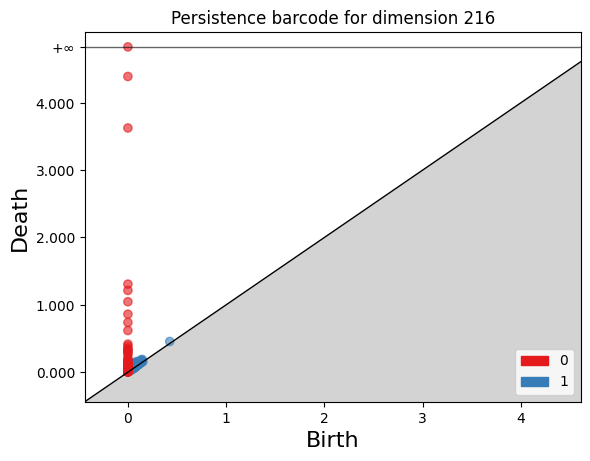

<Figure size 640x480 with 0 Axes>

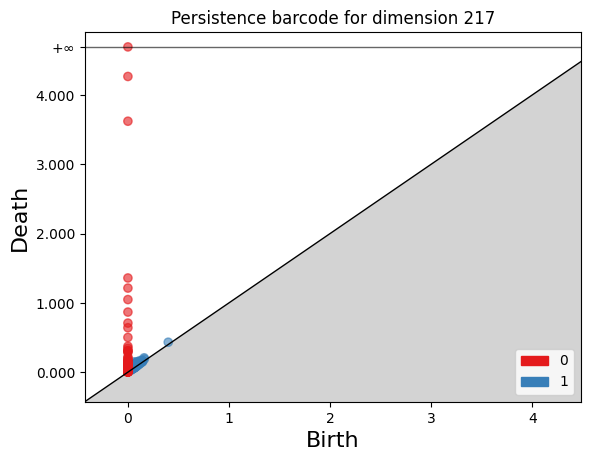

<Figure size 640x480 with 0 Axes>

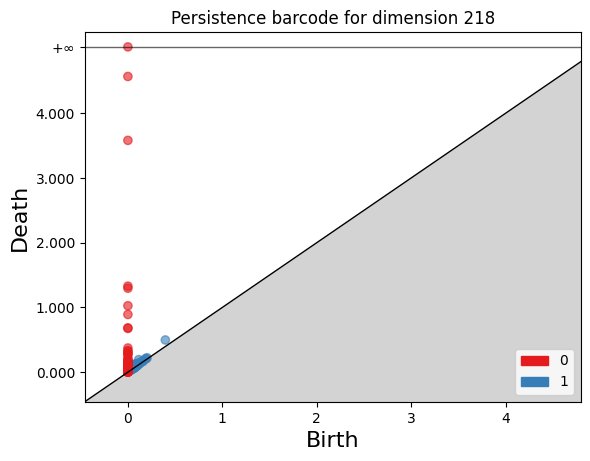

<Figure size 640x480 with 0 Axes>

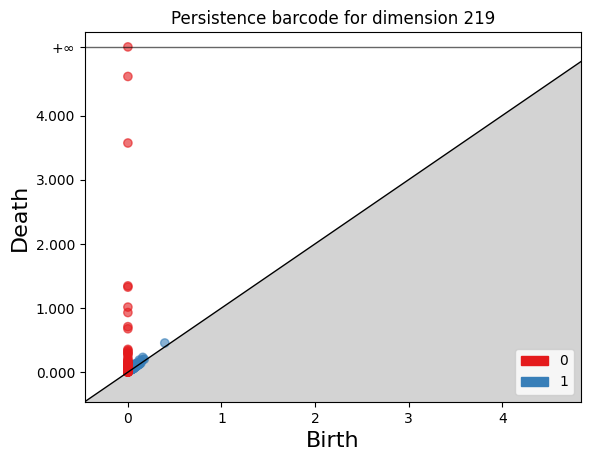

<Figure size 640x480 with 0 Axes>

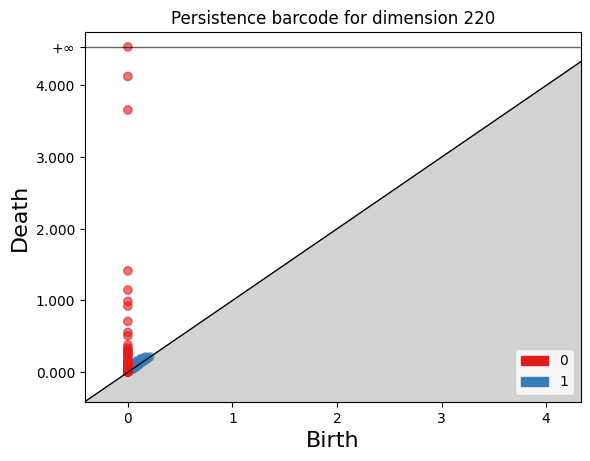

<Figure size 640x480 with 0 Axes>

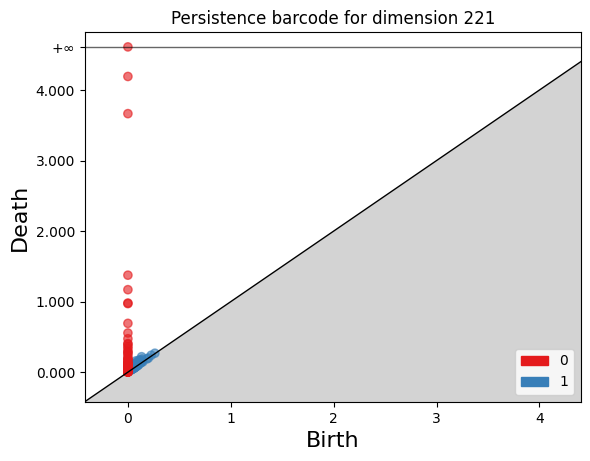

<Figure size 640x480 with 0 Axes>

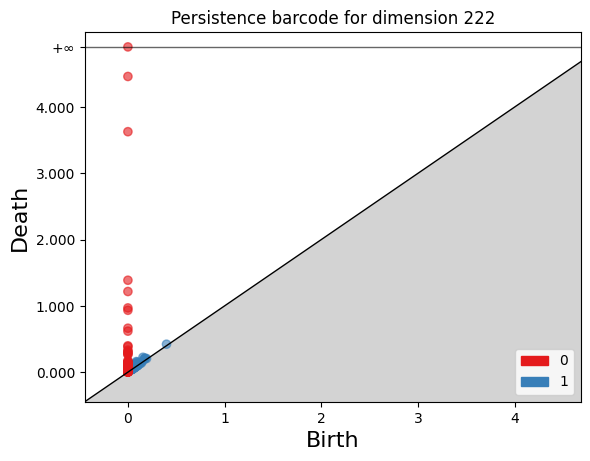

<Figure size 640x480 with 0 Axes>

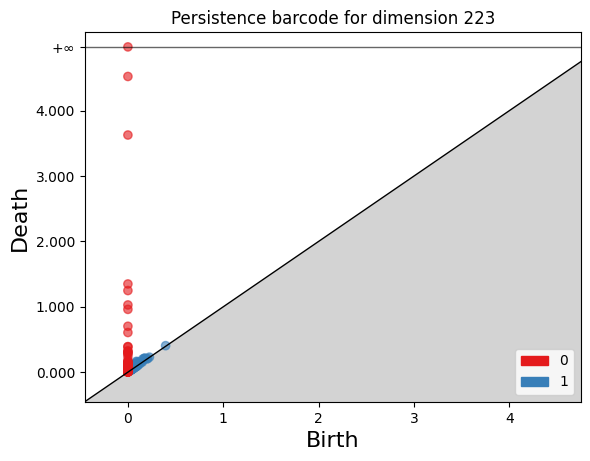

<Figure size 640x480 with 0 Axes>

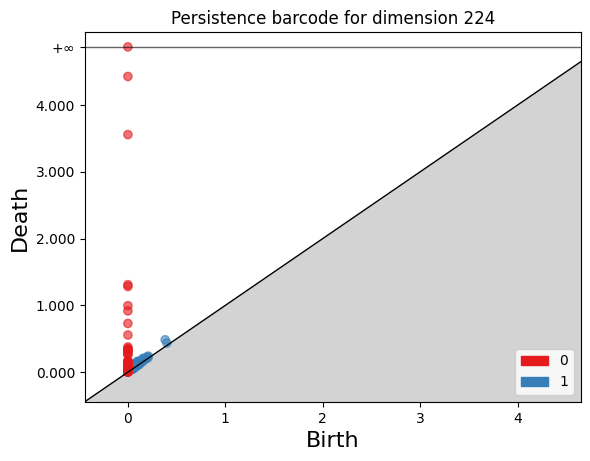

<Figure size 640x480 with 0 Axes>

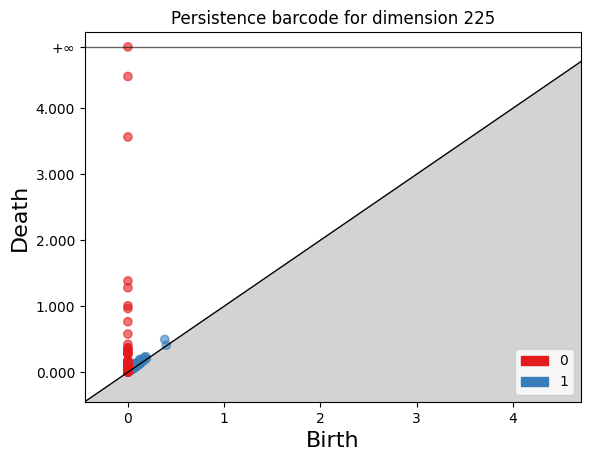

<Figure size 640x480 with 0 Axes>

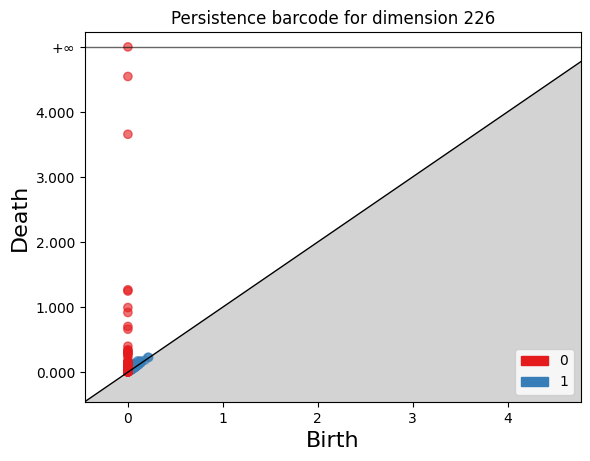

<Figure size 640x480 with 0 Axes>

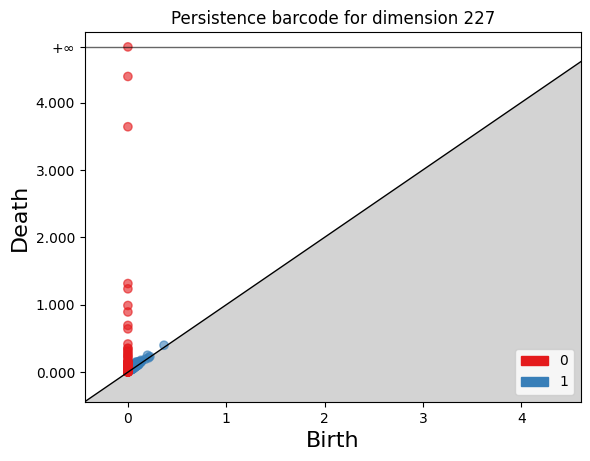

<Figure size 640x480 with 0 Axes>

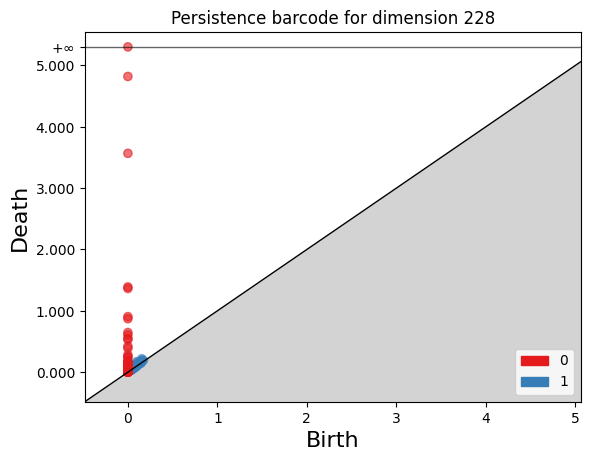

<Figure size 640x480 with 0 Axes>

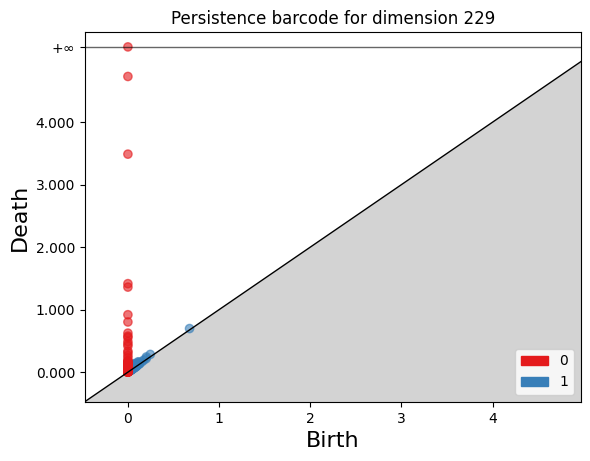

<Figure size 640x480 with 0 Axes>

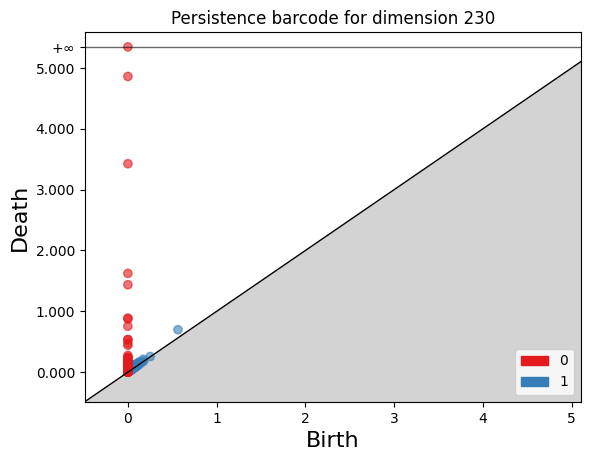

<Figure size 640x480 with 0 Axes>

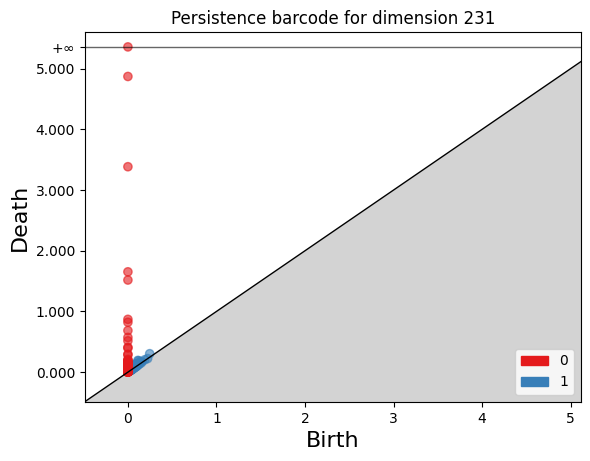

<Figure size 640x480 with 0 Axes>

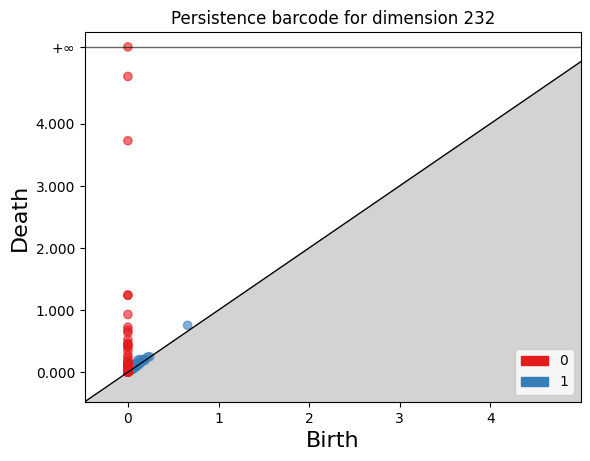

<Figure size 640x480 with 0 Axes>

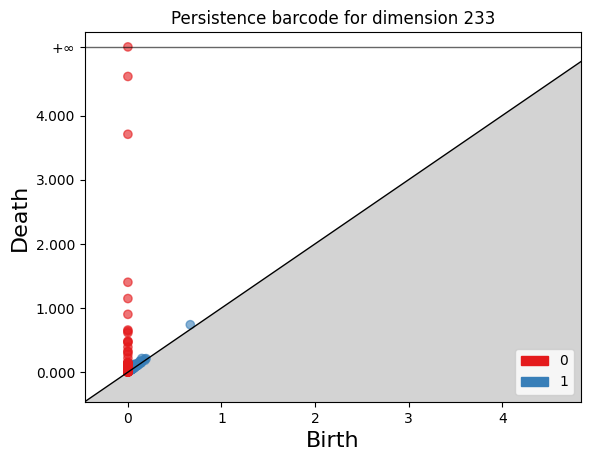

<Figure size 640x480 with 0 Axes>

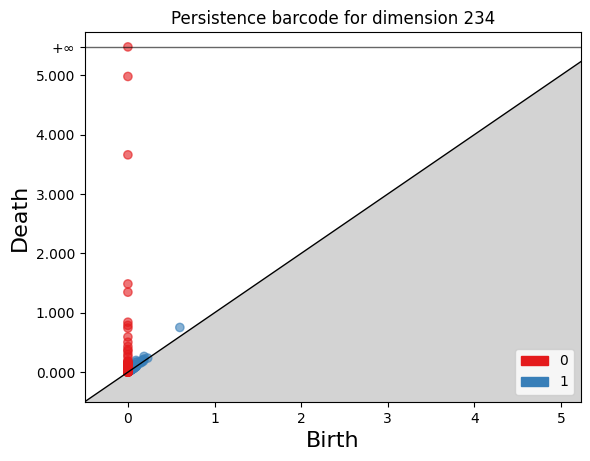

<Figure size 640x480 with 0 Axes>

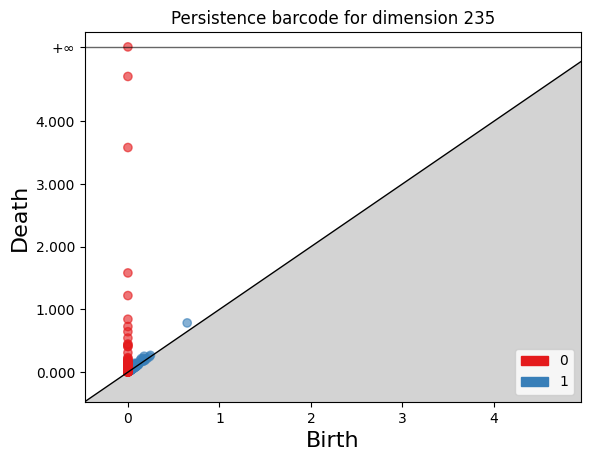

<Figure size 640x480 with 0 Axes>

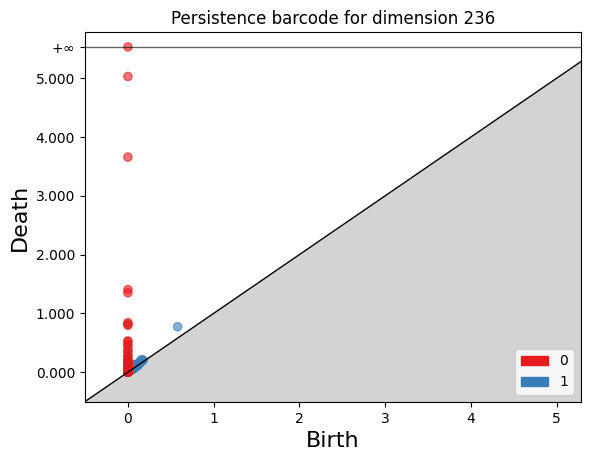

<Figure size 640x480 with 0 Axes>

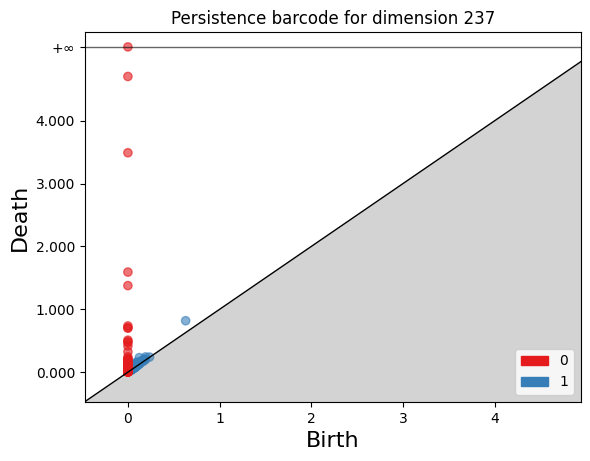

<Figure size 640x480 with 0 Axes>

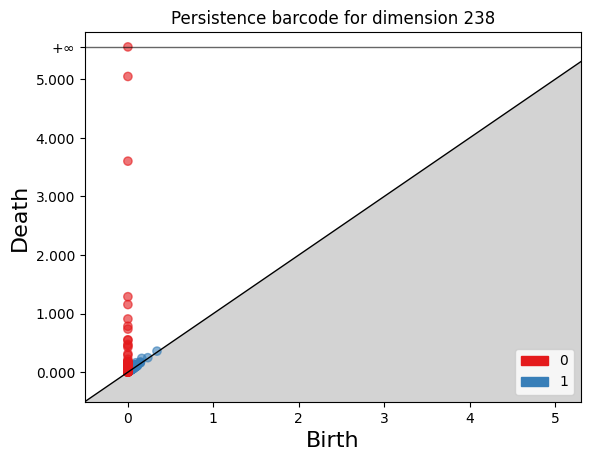

<Figure size 640x480 with 0 Axes>

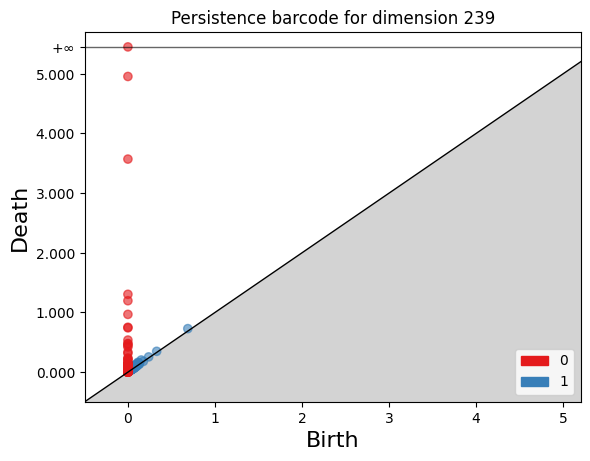

<Figure size 640x480 with 0 Axes>

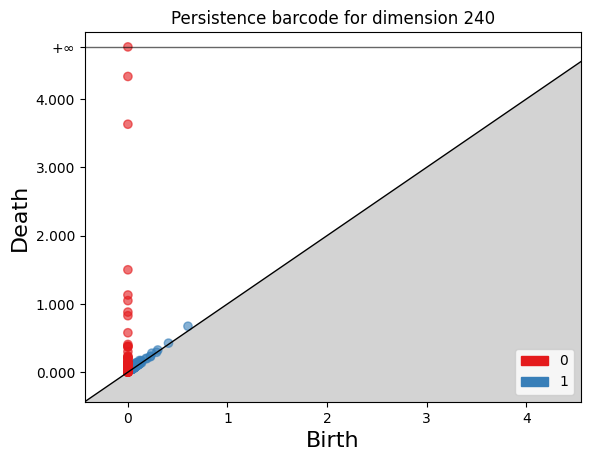

<Figure size 640x480 with 0 Axes>

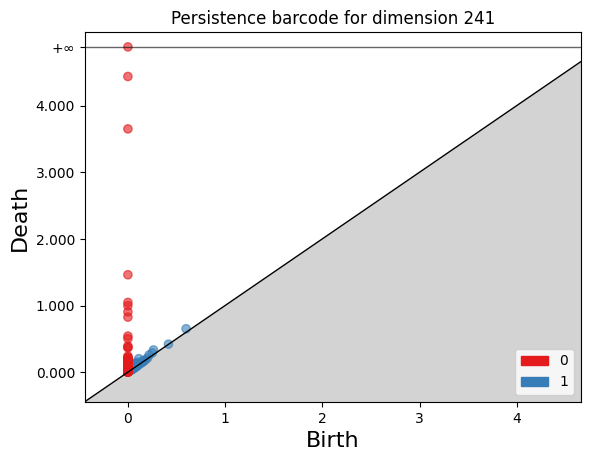

<Figure size 640x480 with 0 Axes>

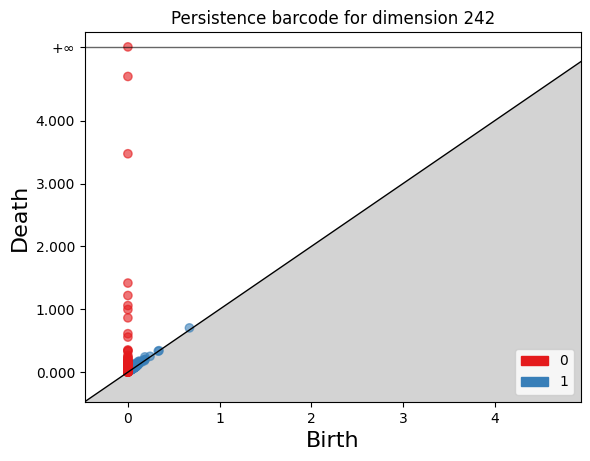

<Figure size 640x480 with 0 Axes>

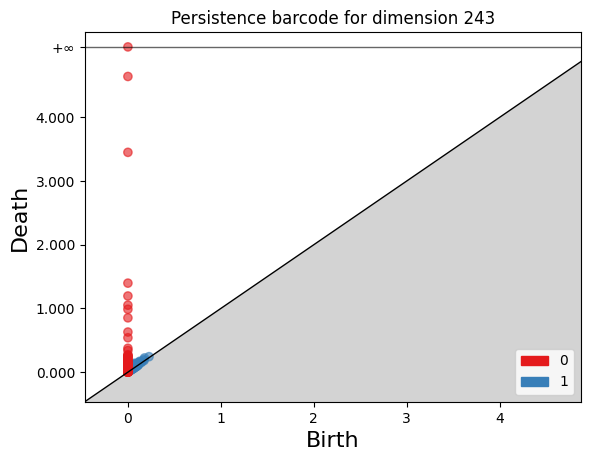

<Figure size 640x480 with 0 Axes>

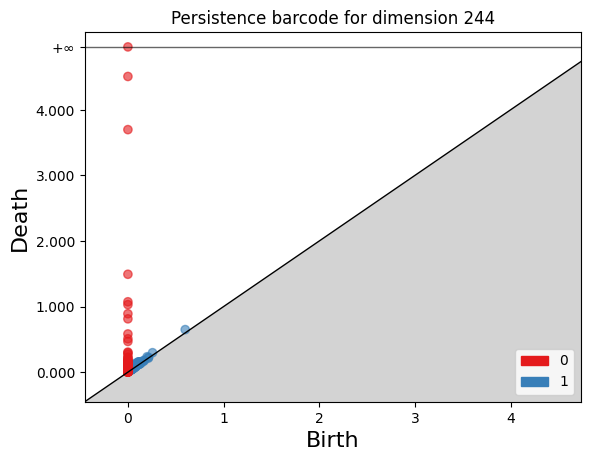

In [57]:
for i, barcode in enumerate(persistence_diagrams):
    plt.figure()
    plot_persistence_diagram(barcode)
    plt.title('Persistence barcode for dimension ' + str(i))
    plt.show()


In [21]:
embeddings = df['embedding'].tolist()
labels = df['spec_relation'].tolist()

# Step 1: Calculate Persistent Homology
persistence_diagrams_new = [g.RipsComplex(points=e, max_edge_length=42).create_simplex_tree(max_dimension=2).persistence() for e in embeddings]
